<a href="https://colab.research.google.com/github/NikitaMarnykh/labor_market_analysis/blob/main/%D0%9C%D0%B0%D1%80%D0%BD%D1%8B%D1%85_%D0%9D_%D0%92_%D0%B8_%D0%9E%D0%B1%D0%BE%D1%80%D0%BE%D1%82%D0%BE%D0%B2_%D0%9C_%D0%92_%D1%80%D1%8B%D0%BD%D0%BE%D0%BA_%D1%82%D1%80%D1%83%D0%B4%D0%B0_%D0%B0%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7_%D0%B2%D0%B7%D0%B0%D0%B8%D0%BC%D0%BE%D1%81%D0%B2%D1%8F%D0%B7%D0%B8_%D0%B4%D0%B2%D1%83%D1%85_%D0%BA%D0%B0%D1%82%D0%B5%D0%B3%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D1%85_%D0%BF%D1%80%D0%B8%D0%B7%D0%BD%D0%B0%D0%BA%D0%BE%D0%B2_%D1%87%D0%B0%D1%81%D1%82%D1%8C_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Признаки, которые будут использованы для дальнейшего анализа**

Категориальные признаки:

  - профессиональная роль (professional roles)

  - ключевые навыки (key_skills)

  - наименование работодателя (employer)

  - опыт работы (experience)

  - график работы (schedule)

  - тип занятости (employment)

  - доступна ли вакансия для соискателей с инвалидностью (accept_handicapped)

  - город (city)

  - сфера деятельности (field_of_activity)

## 13. Установка и подключение зависимостей для анализа взаимосвязей категориальных признаков

Устанавливаем все необходимые зависимости

In [1]:
!pip install numpy
!pip install matplotlib
!pip install pandas
!pip install scipy

Подключаем все необходимые зависимости

In [2]:
import numpy as np

import pandas as pd

import matplotlib.pyplot as plt

import scipy.stats as stats

Подгружаем репозиторий для работы с ним

In [3]:
!git clone https://github.com/NikitaMarnykh/labor_market_analysis

Cloning into 'labor_market_analysis'...
remote: Enumerating objects: 94, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 94 (delta 53), reused 9 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (94/94), 61.13 MiB | 7.13 MiB/s, done.
Resolving deltas: 100% (53/53), done.
Updating files: 100% (11/11), done.


Перейдём в установленный репозиторий

In [4]:
%cd labor_market_analysis/

/content/labor_market_analysis


Сохраним датасет в переменную

In [5]:
dataset = pd.read_csv('cleaned_hh_hard.csv',
                      na_values=['NA', 'N/A', 'null', 'missing', '-', '?', '...'],
                      dtype={
                             'id': 'Int64', 'professional_roles': 'string',
                             'experience': 'category', 'schedule': 'category',
                             'employment': 'category', 'employer': 'string',
                             'accept_handicapped': 'category', 'key_skills': 'string',
                             'city': 'string', 'salary_from': 'Int64',
                             'salary_to': 'Int64', 'field_of_activity': 'category',

                      },
                      keep_default_na=True,
                      na_filter=True)

Посмотрим информацию о датасете

In [190]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81412 entries, 0 to 81411
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   id                  81412 non-null  Int64   
 1   professional_roles  81412 non-null  string  
 2   experience          81412 non-null  category
 3   schedule            81412 non-null  category
 4   employment          81412 non-null  category
 5   employer            81412 non-null  string  
 6   accept_handicapped  81412 non-null  category
 7   key_skills          81412 non-null  string  
 8   city                81412 non-null  string  
 9   salary_from         81412 non-null  Int64   
 10  salary_to           81412 non-null  Int64   
 11  field_of_activity   81412 non-null  category
dtypes: Int64(3), category(5), string(4)
memory usage: 5.0 MB


## 14. Анализ взаимосвязи двух категориальных признаков (Часть 2)

Зададим базовые цвета для отображения топ 5 категорий для анализа признаков

In [7]:
colors = ('#FF9AA2', '#FFB7B2', '#FFDAC1', '#E2F0CB', '#B5EAD7')

Зададим свойства секторов (долей) круговой диаграммы

In [8]:
wedgeprops = {'linewidth': 1.5, 'edgecolor': 'white'}

Зададим свойства текста круговой диаграммы

In [9]:
textprops={'fontsize': 12}

### 14.1 Признаки employer и accept_handicapped

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [10]:
columns = ('employer', 'accept_handicapped')

Посмотрим на уникальные значения первого признака

In [11]:
dataset[columns[0]].unique()

<StringArray>
[        'Стройкомплектсервис',                      'Квазар',
                'Staff-Linear',                   'AYS GROUP',
       'ЛАМА, Группа компаний',               'Деталь Проект',
           'Автоцентр АВТОГИК',                 'Эко-Системы',
    'Мототека, филиал г.Томск',                     'ДомПлюс',
 ...
                  'Риэлт Плюс', 'Филиппова Марина Николаевна',
                        'Вега',                 'АСС-Холдинг',
                  'Grand Line',                       'Омега',
                 'Инста Пермь',                     'Tantuni',
                  'СТОМСЕРВИС',                 'Night smoke']
Length: 4394, dtype: string

Выведем их количество

In [12]:
dataset[columns[0]].unique().shape

(4394,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [13]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
employer,
Сибгарант +,655
Стройся,585
"СИБУР, Группа компаний",583
"ЛАМА, Группа компаний",449
ОГКУ ЦЗН города Томска и Томского района,381
...,...
Массажная мастерская,1
РосПром Персонал,1
Дело в креме,1


Посмотрим на уникальные значения второго признака

In [14]:
dataset[columns[1]].unique()

['0', '1']
Categories (2, object): ['0', '1']

Выведем их количество

In [15]:
dataset[columns[1]].unique().shape

(2,)

Для каждого значения первого признака построим круговые диаграммы

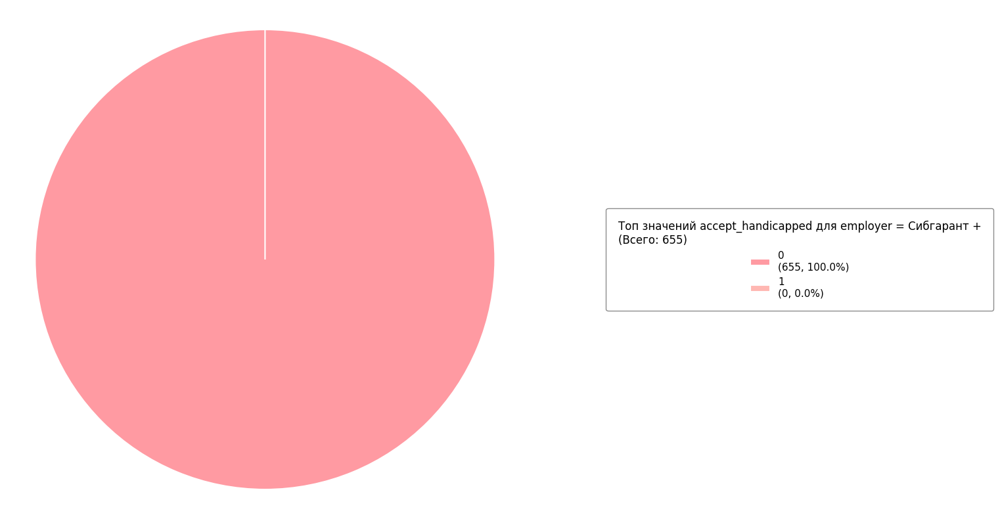

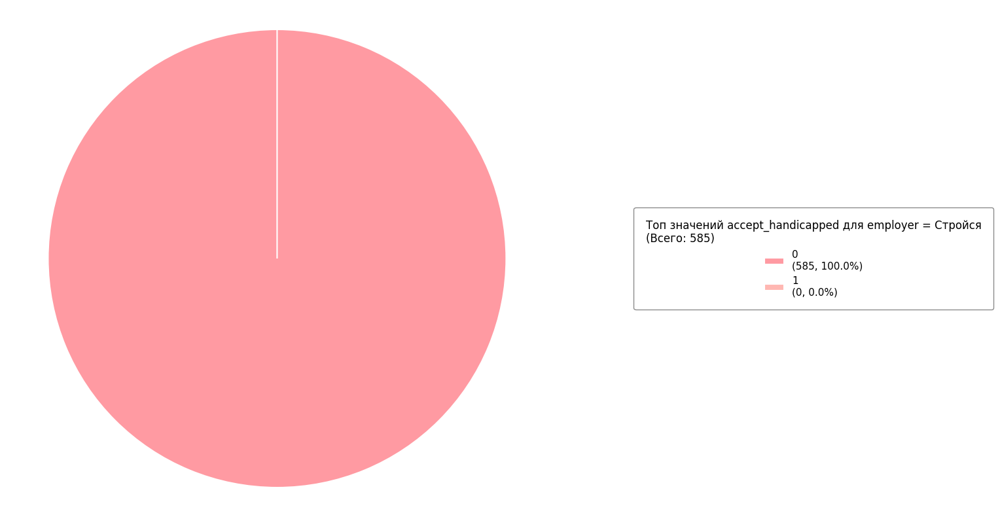

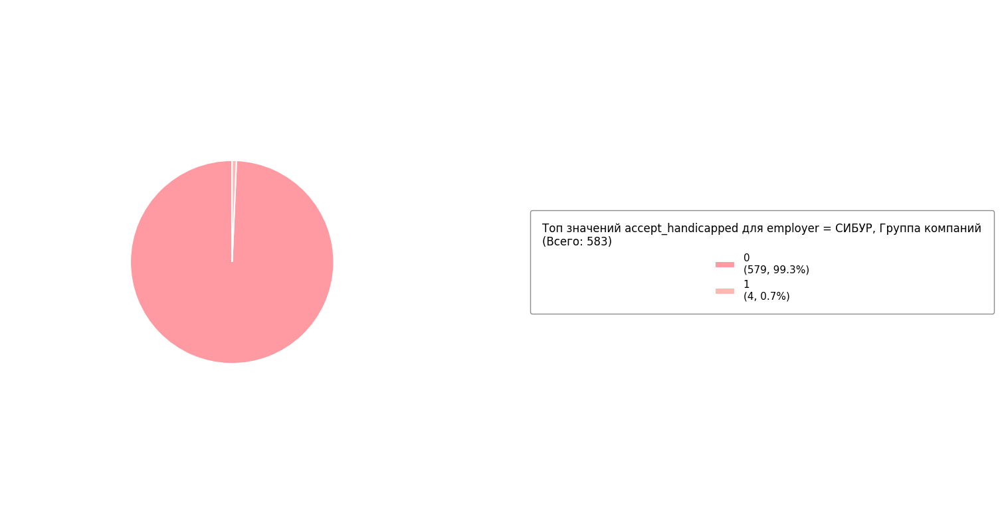

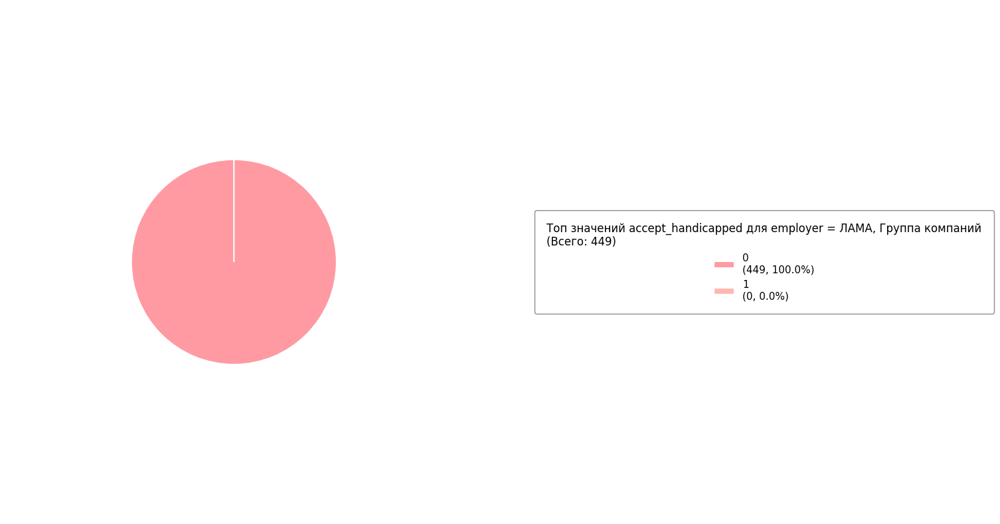

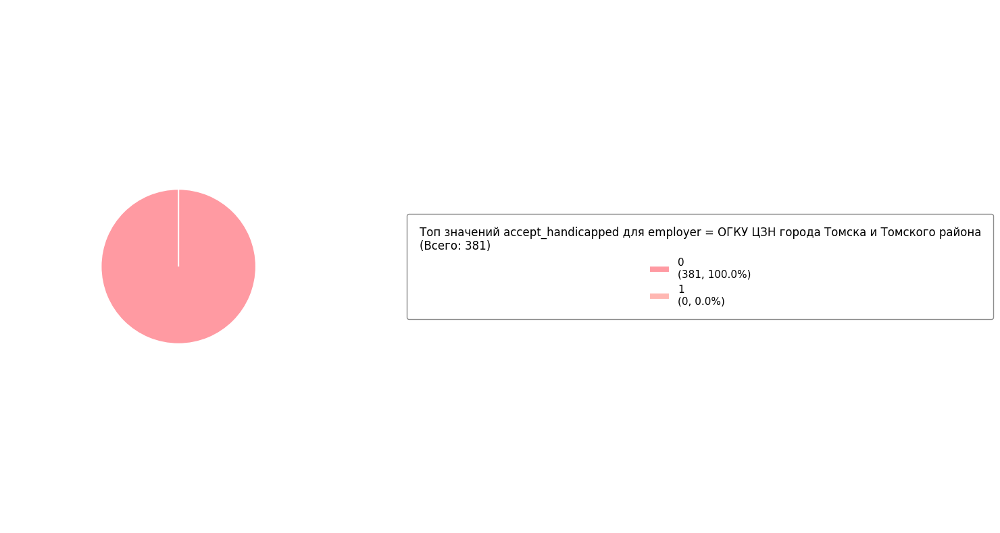

...

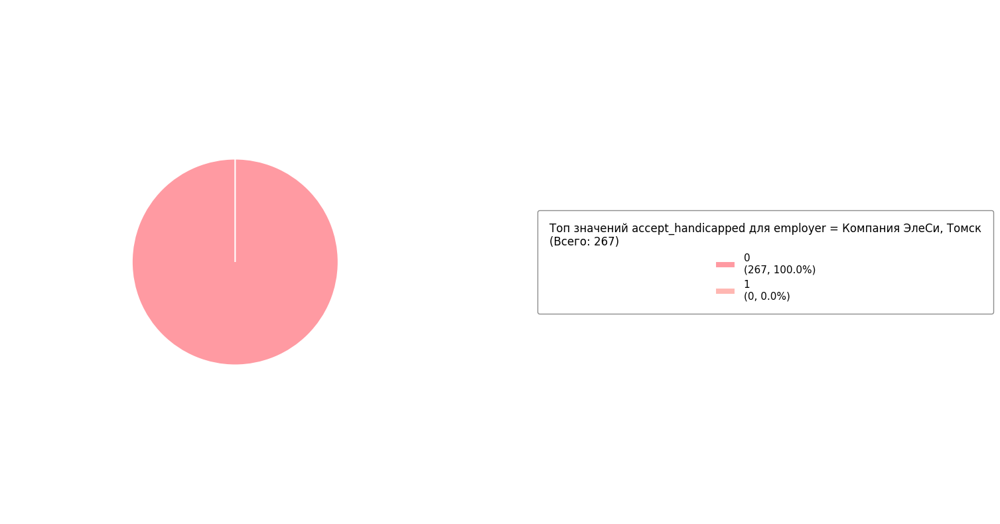

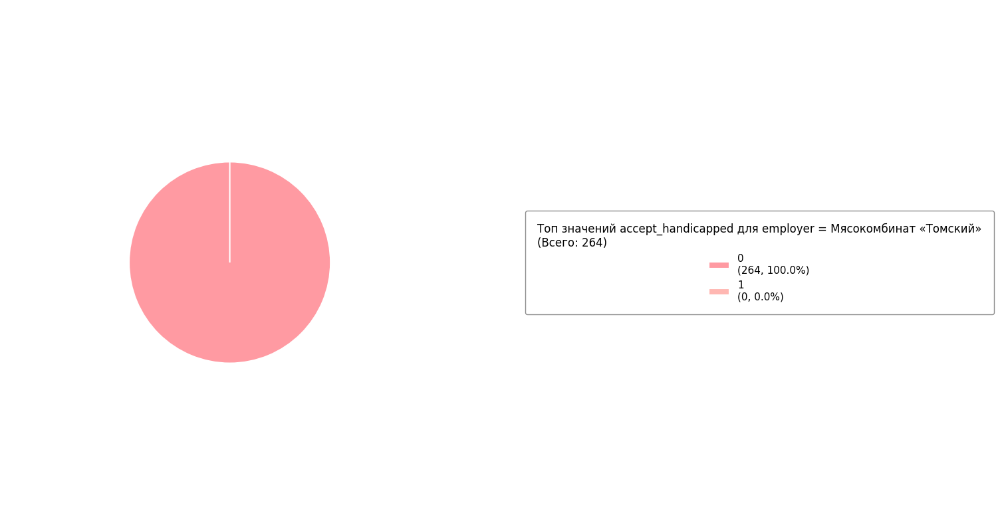

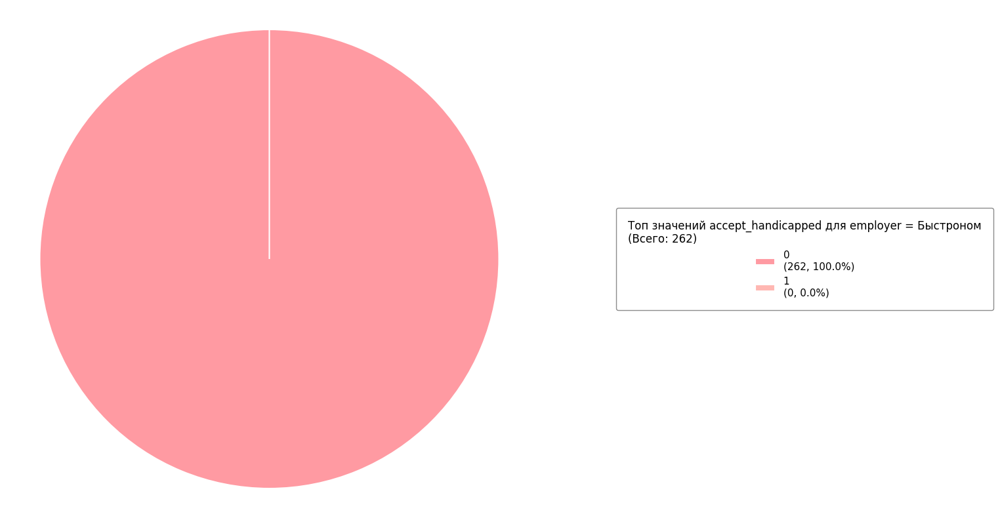

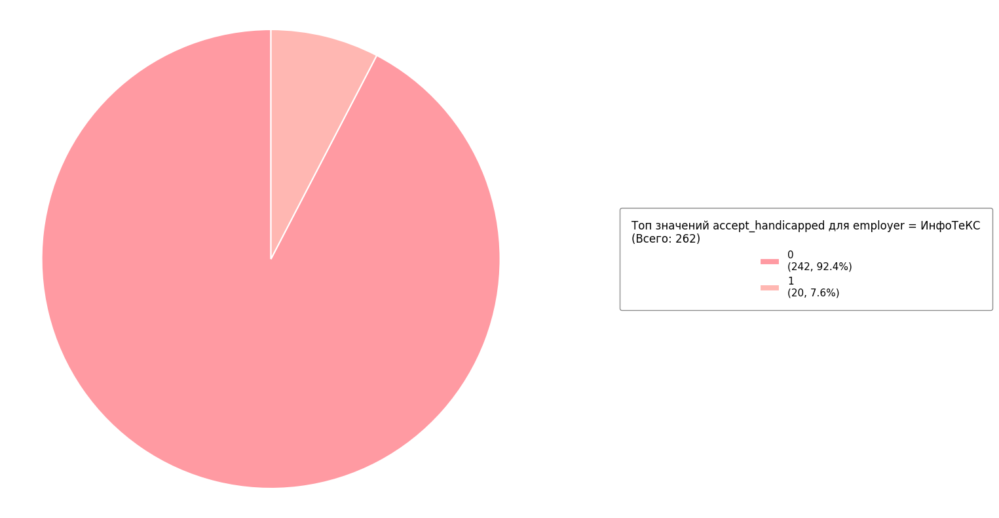

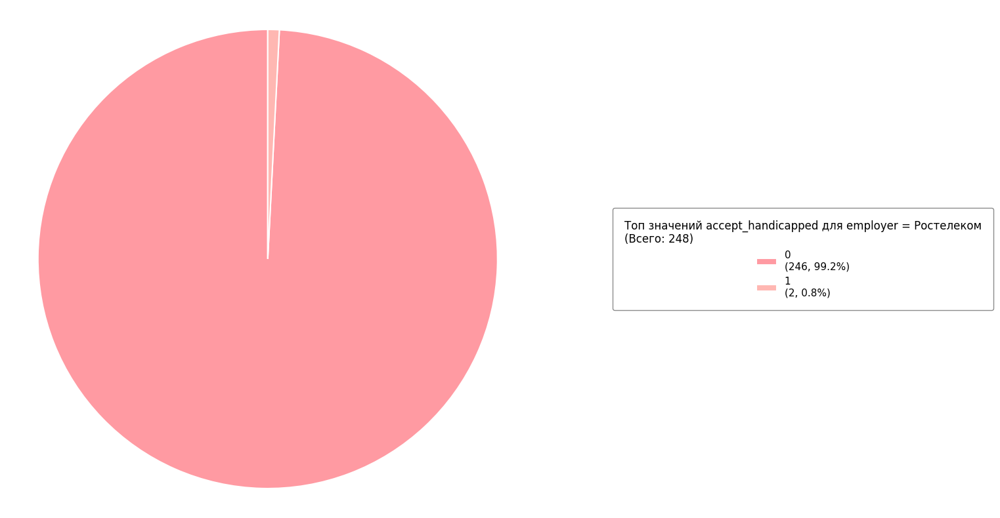

In [16]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [17]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

accept_handicapped,0,1
employer,,
#Многопива,5,0
1&3 Коммерческая Недвижимость,6,0
1&3 Концепт Девелопмент,86,0
100Масел,8,0
1C-Рарус,4,0
...,...,...
сеть магазинов Красное и Белое,175,0
томинвест,1,0
фирма Агрокомплекс им. Н.И. Ткачева,3,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [18]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 47909.907
p-value = 0.0
Степени свободы = 4393


Оценим уровень связи коэффициентом Крамера

In [19]:
stats.contingency.association(contingency_table, method='cramer')

0.7671290901577127

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.767) показывает, что сила связи высокая

    - Возможно из-за разрежённости матрицы результат не точен

### 14.2 Признаки employer и city

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [20]:
columns = ('city', 'employer')

Посмотрим на уникальные значения первого признака

In [21]:
dataset[columns[0]].unique()

<StringArray>
[                            'Томск',                          'Могочино',
                           'Каргала',    'Первомайское (Томская область)',
                           'Чажемто',                            'Самусь',
                         'Колпашево',                          'Рыбалово',
                            'Парбиг',                          'Копылово',
                            'Курлек',                          'Кедровый',
                        'Кривошеино',                          'Кисловка',
                            'Бакчар',                          'Богашёво',
         'Северск (Томская область)',         'Светлый (Томская область)',
                         'Стрежевой',                          'Белый Яр',
                         'Молчаново',                         'Подгорное',
                        'Мельниково',                             'Асино',
                          'Каргасок',                         'Тегульдет',
           

Выведем их количество

In [22]:
dataset[columns[0]].unique().shape

(42,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [23]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
city,
Томск,74319
Северск (Томская область),3081
Стрежевой,1001
Асино,396
Колпашево,337
Первомайское (Томская область),181
Зональная Станция,152
Светлый (Томская область),150
Парабель,136


Посмотрим на уникальные значения второго признака

In [24]:
dataset[columns[1]].unique()

<StringArray>
[        'Стройкомплектсервис',                      'Квазар',
                'Staff-Linear',                   'AYS GROUP',
       'ЛАМА, Группа компаний',               'Деталь Проект',
           'Автоцентр АВТОГИК',                 'Эко-Системы',
    'Мототека, филиал г.Томск',                     'ДомПлюс',
 ...
                  'Риэлт Плюс', 'Филиппова Марина Николаевна',
                        'Вега',                 'АСС-Холдинг',
                  'Grand Line',                       'Омега',
                 'Инста Пермь',                     'Tantuni',
                  'СТОМСЕРВИС',                 'Night smoke']
Length: 4394, dtype: string

Выведем их количество

In [25]:
dataset[columns[1]].unique().shape

(4394,)

Для каждого значения первого признака построим круговые диаграммы

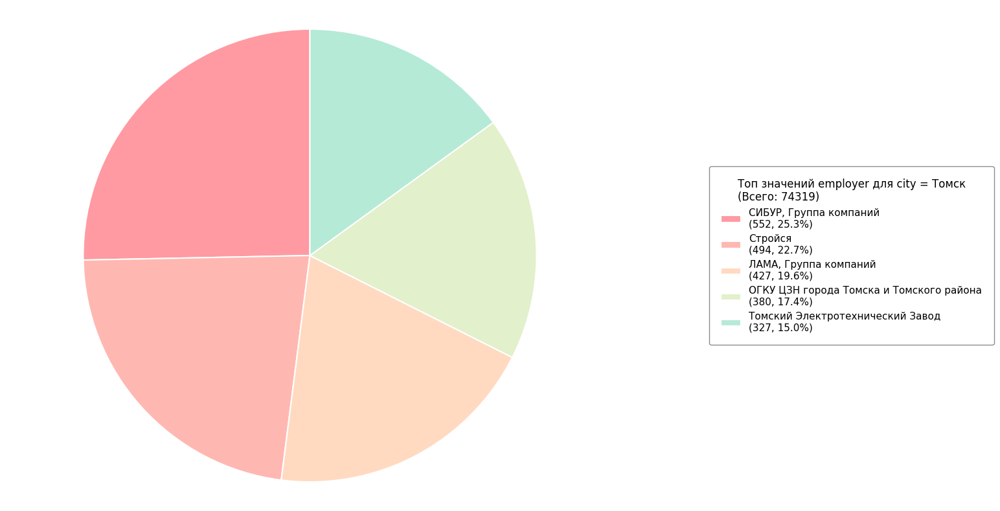

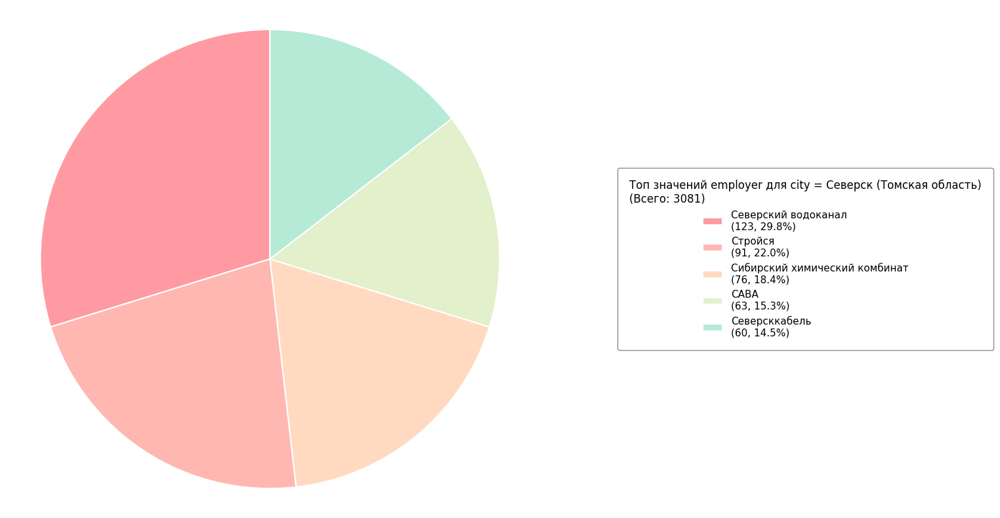

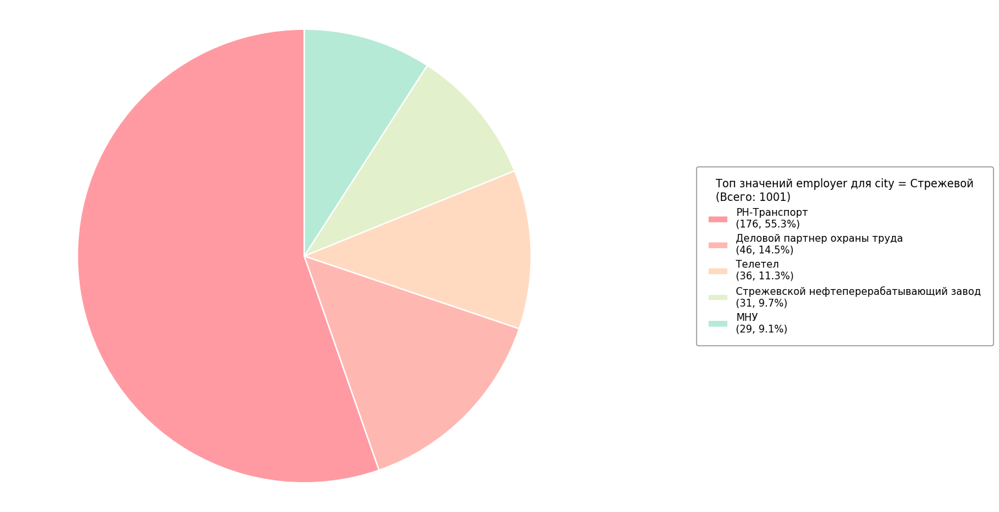

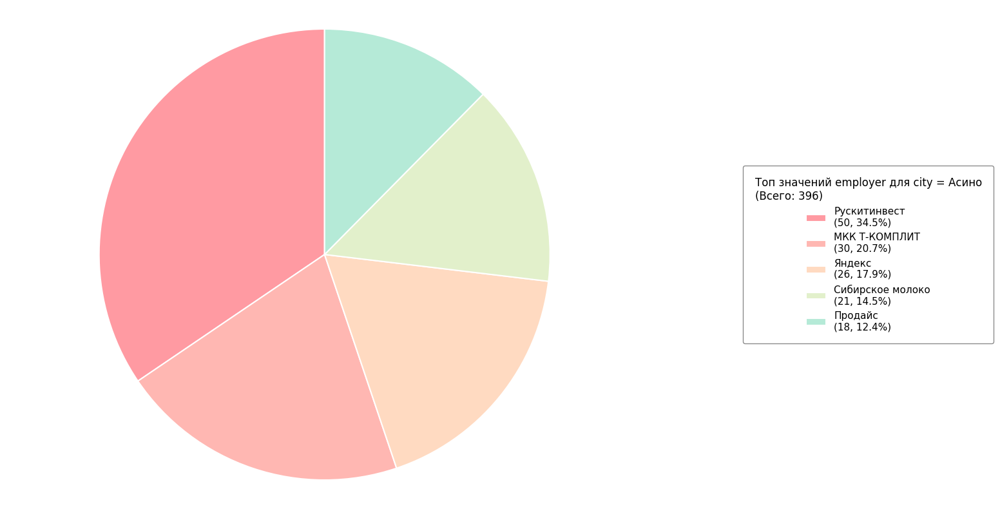

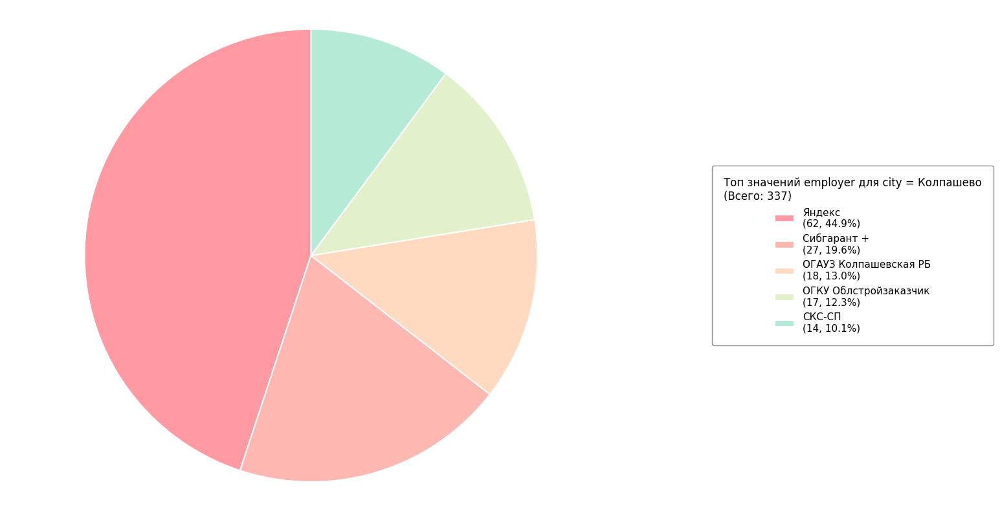

...

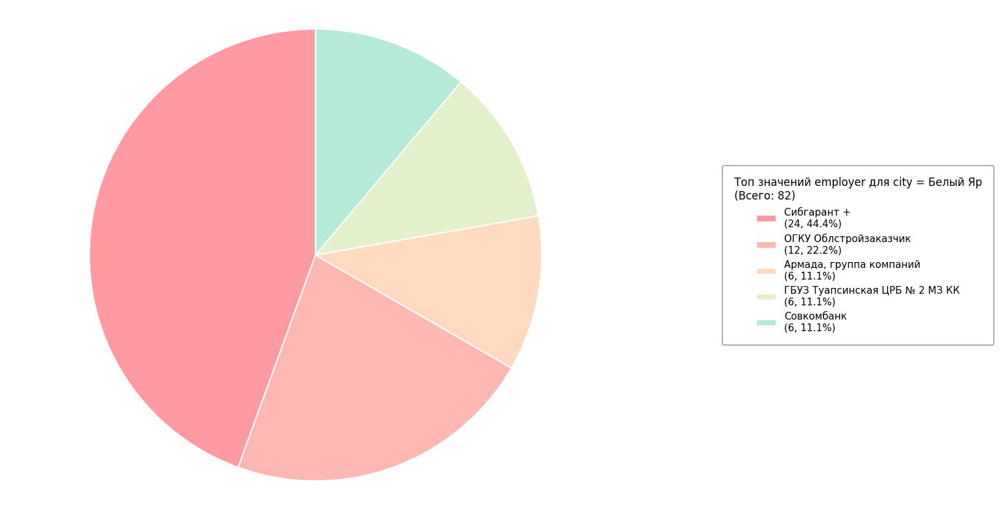

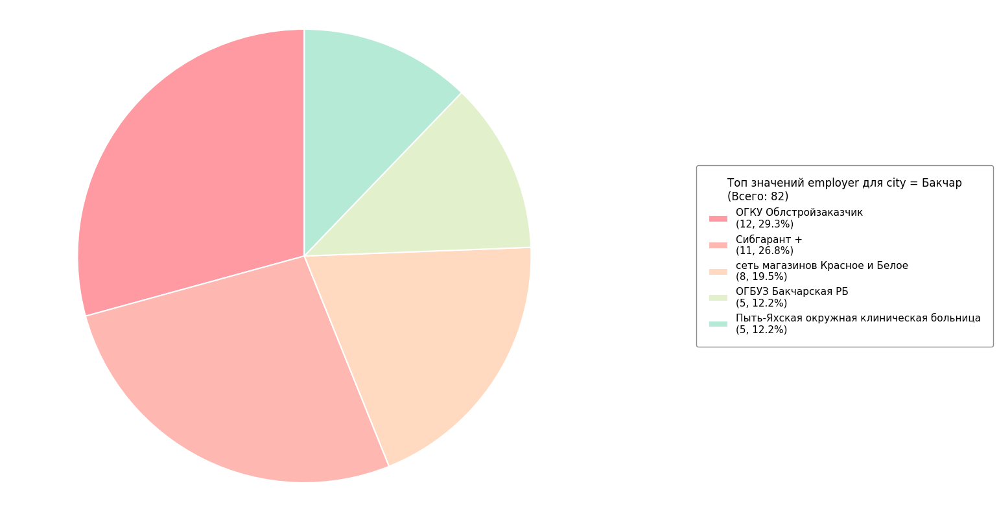

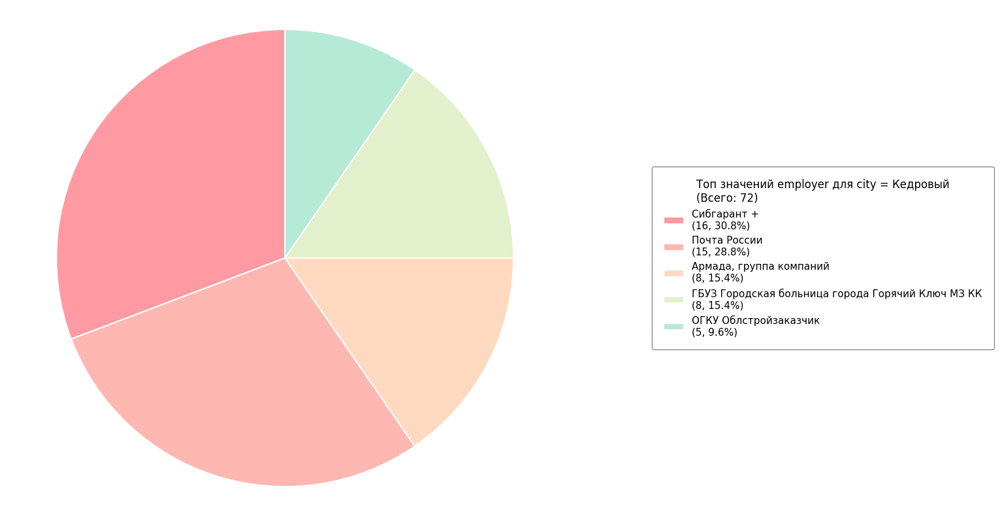

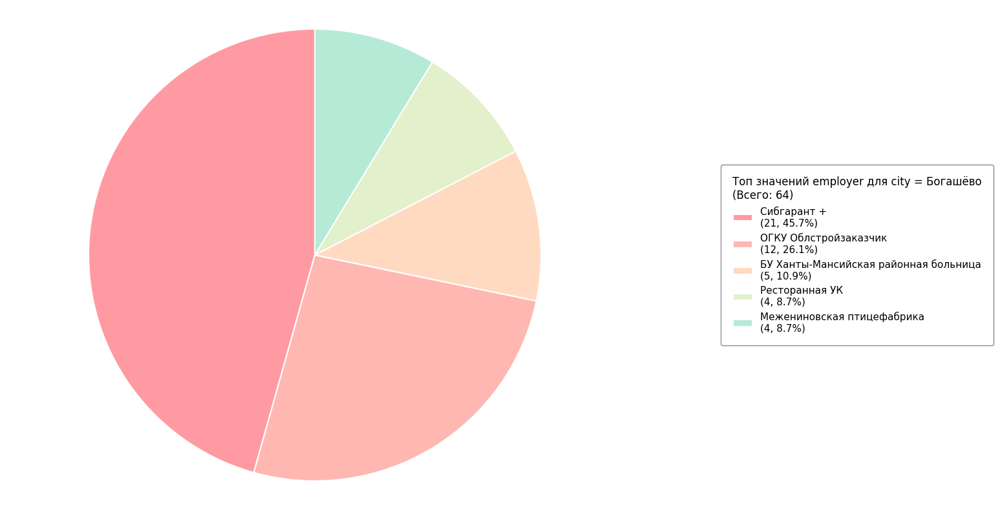

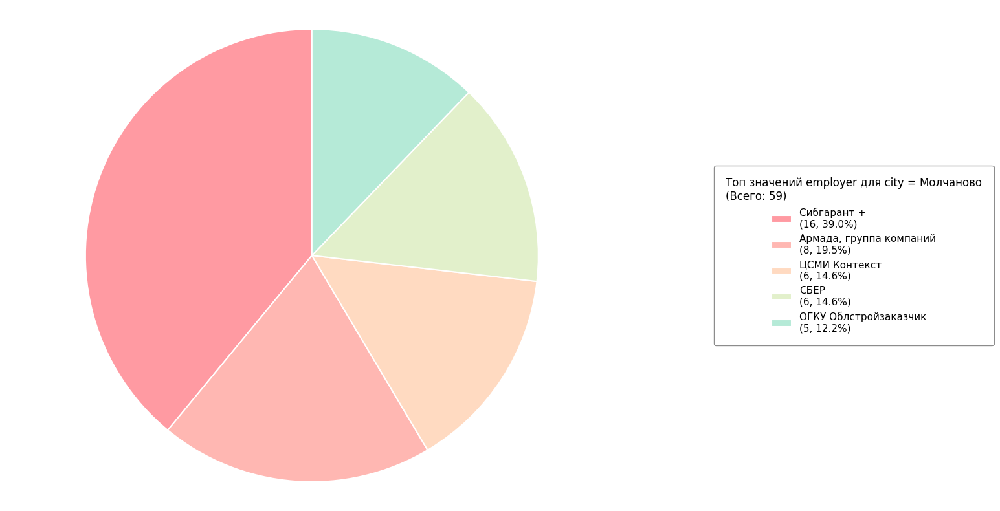

In [26]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [27]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

employer,#Многопива,1&3 Коммерческая Недвижимость,1&3 Концепт Девелопмент,100Масел,1C-Рарус,1С:БухОбслуживание.Азимут,1С:БухОбслуживание.ТэнчПро,2-й Специальный полк полиции ГУ МВД России по г.Москве (4 батальон 3 рота),2-ой ОПП ГУ МВД России по г. Москве 1 рота 1 батальон,2droida,...,гостиница ArtPlaza,деЛюкс-АВто,оптика< BECHA>,региональная компания,сеть кофеен Буланже,сеть магазинов Красное и Белое,томинвест,фирма Агрокомплекс им. Н.И. Ткачева,​Детский развлекательный центр Кактус,​Ресторан паназиатской кухни ПхиПхи
city,,,,,,,,,,,,,,,,,,,,,
Александровское (Томская область),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0
Асино,0,0,0,0,0,0,0,0,3,0,...,0,0,0,0,0,1,0,0,0,0
Бакчар,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,8,0,0,0,0
Батурино,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Белый Яр,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Богашёво,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Зональная Станция,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0
Зоркальцево,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Зырянское,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [28]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 413856.054
p-value = 0.0
Степени свободы = 180113


Оценим уровень связи коэффициентом Крамера

In [29]:
stats.contingency.association(contingency_table, method='cramer')

0.35211823493499594

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.352) показывает, что сила связи умеренная

    - Возможно из-за разрежённости матрицы результат не точен

### 14.3 Признаки employer и field_of_activity

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [30]:
columns = ('field_of_activity', 'employer')

Посмотрим на уникальные значения первого признака

In [31]:
dataset[columns[0]].unique()

['Инженерия и строительство', 'Транспорт и логистика', 'Торговля и продажи', 'Сфера обслуживания', 'Производство и технические специальности', ..., 'Образование и наука', 'Аналитика и исследования', 'Туризм', 'Сельское хозяйство', 'Спорт и фитнес']
Length: 20
Categories (20, object): ['IT и технологии', 'Аналитика и исследования', 'Бытовые услуги',
                          'Другие сферы', ..., 'Туризм', 'Управление и администрирование',
                          'Финансы и бухгалтерия', 'Юриспруденция и безопасность']

Выведем их количество

In [32]:
dataset[columns[0]].unique().shape

(20,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [33]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
field_of_activity,
Торговля и продажи,15586
Инженерия и строительство,9292
Сфера обслуживания,7322
Другие сферы,7302
Управление и администрирование,5902
Транспорт и логистика,5860
Производство и технические специальности,5347
IT и технологии,4988
Финансы и бухгалтерия,4616


Посмотрим на уникальные значения второго признака

In [34]:
dataset[columns[1]].unique()

<StringArray>
[        'Стройкомплектсервис',                      'Квазар',
                'Staff-Linear',                   'AYS GROUP',
       'ЛАМА, Группа компаний',               'Деталь Проект',
           'Автоцентр АВТОГИК',                 'Эко-Системы',
    'Мототека, филиал г.Томск',                     'ДомПлюс',
 ...
                  'Риэлт Плюс', 'Филиппова Марина Николаевна',
                        'Вега',                 'АСС-Холдинг',
                  'Grand Line',                       'Омега',
                 'Инста Пермь',                     'Tantuni',
                  'СТОМСЕРВИС',                 'Night smoke']
Length: 4394, dtype: string

Выведем их количество

In [35]:
dataset[columns[1]].unique().shape

(4394,)

Для каждого значения первого признака построим круговые диаграммы

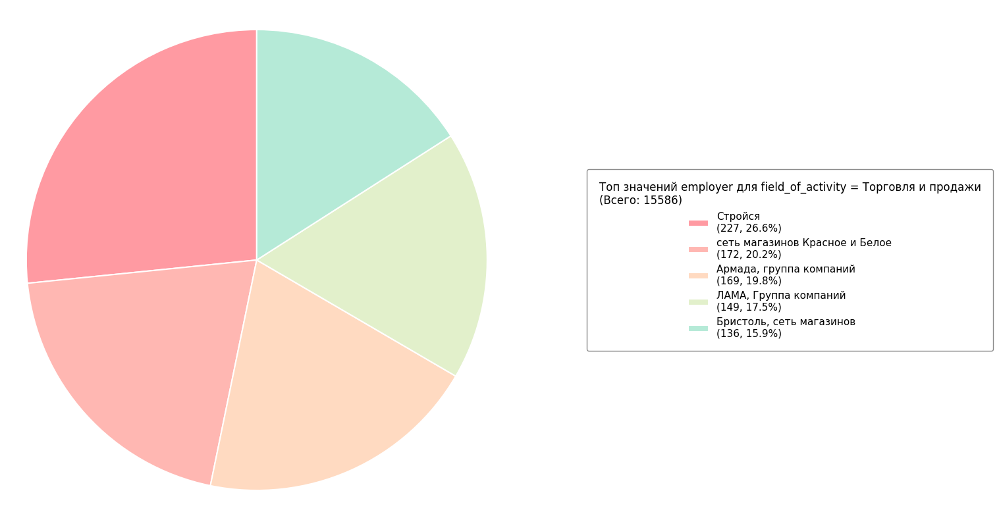

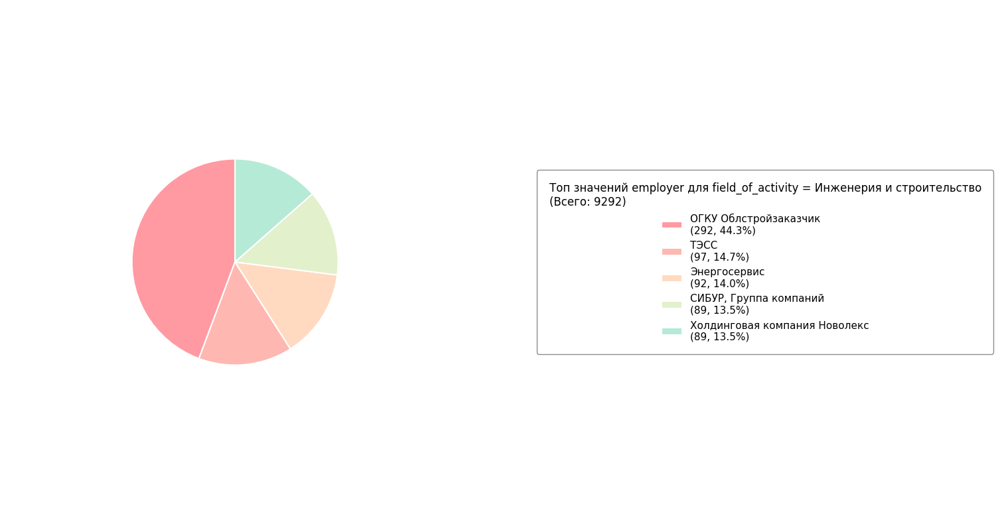

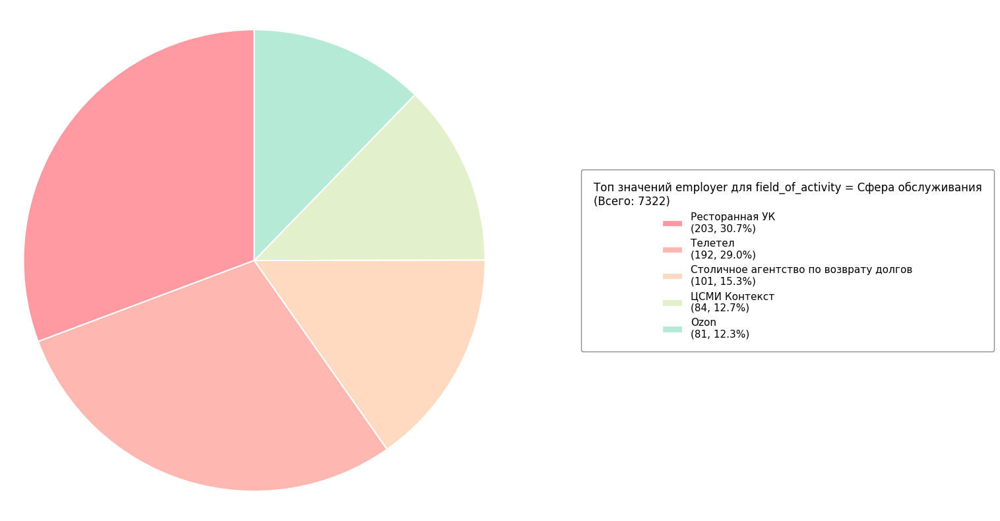

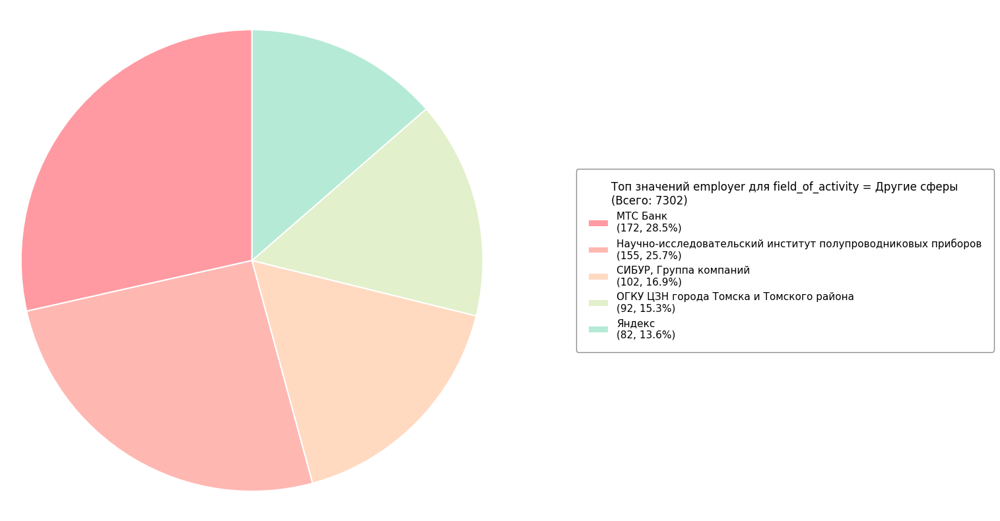

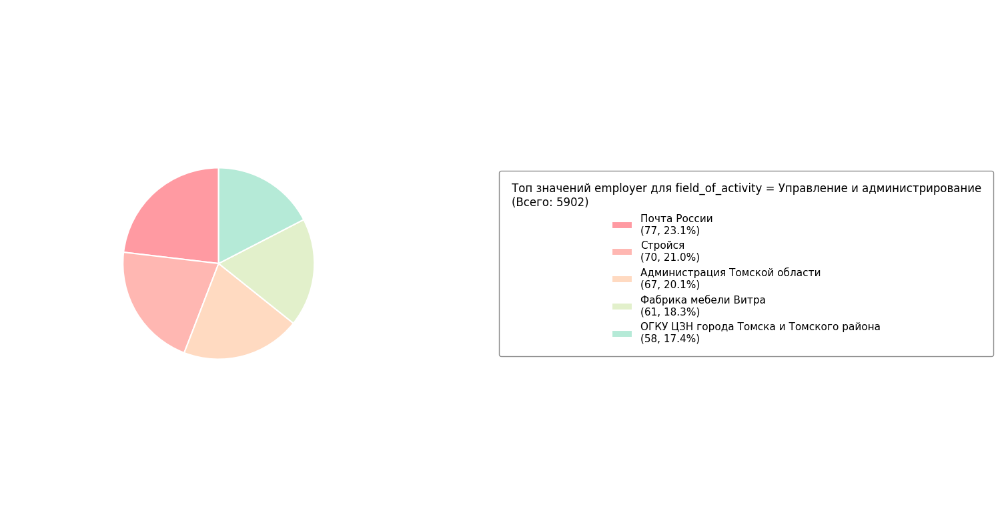

...

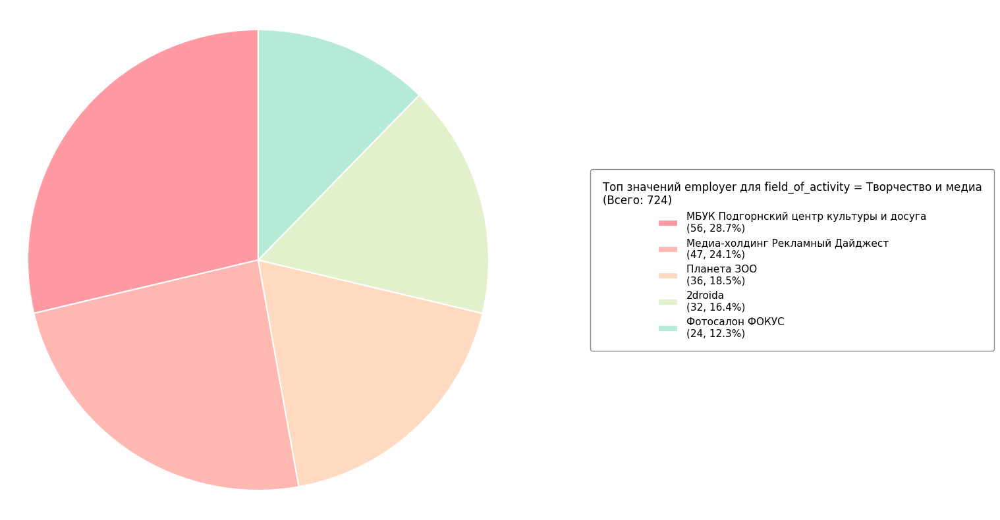

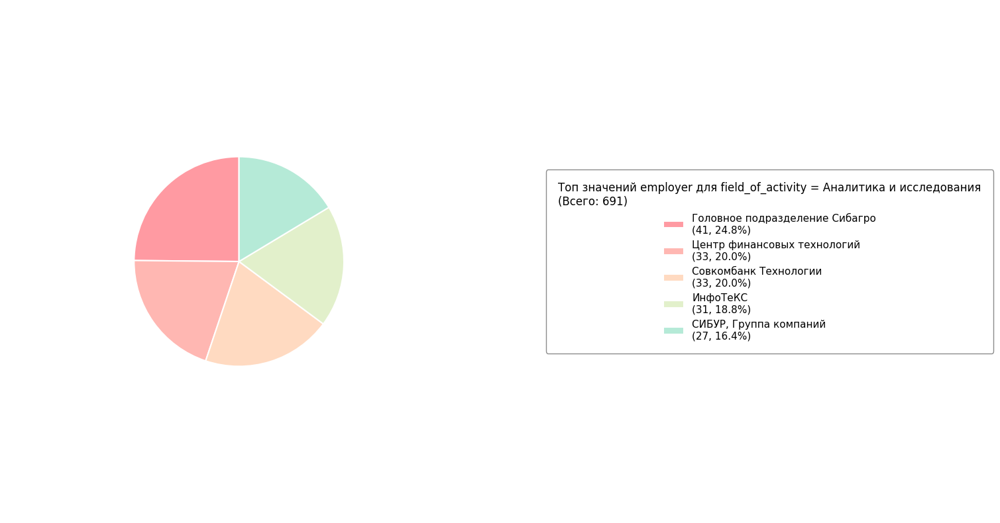

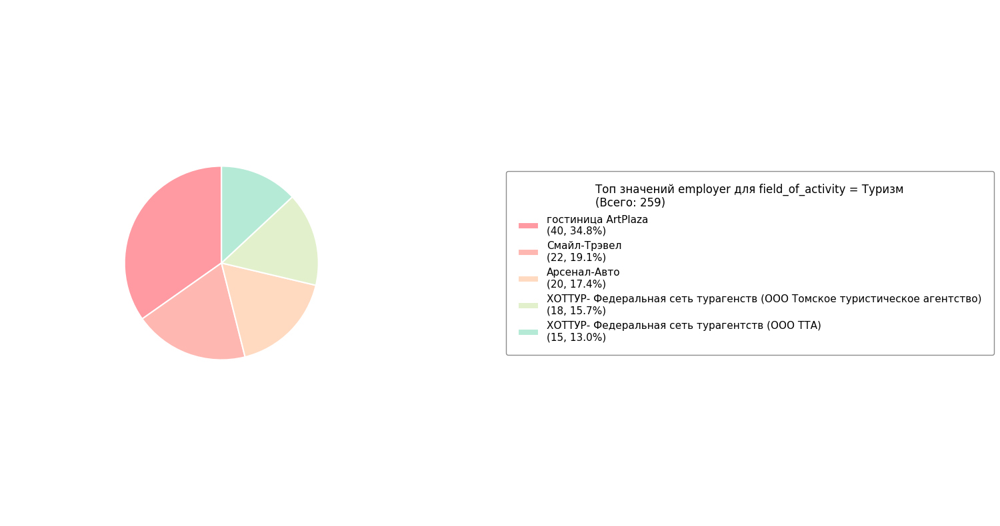

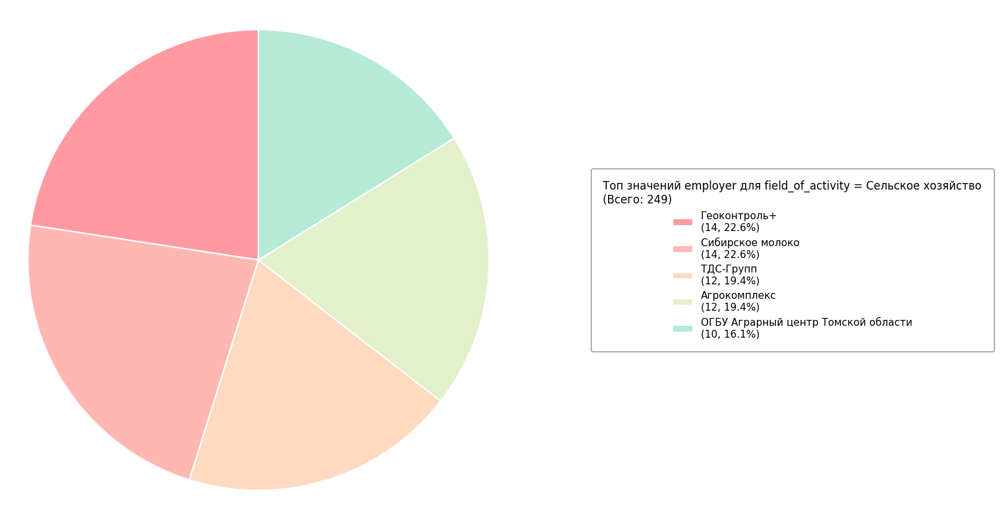

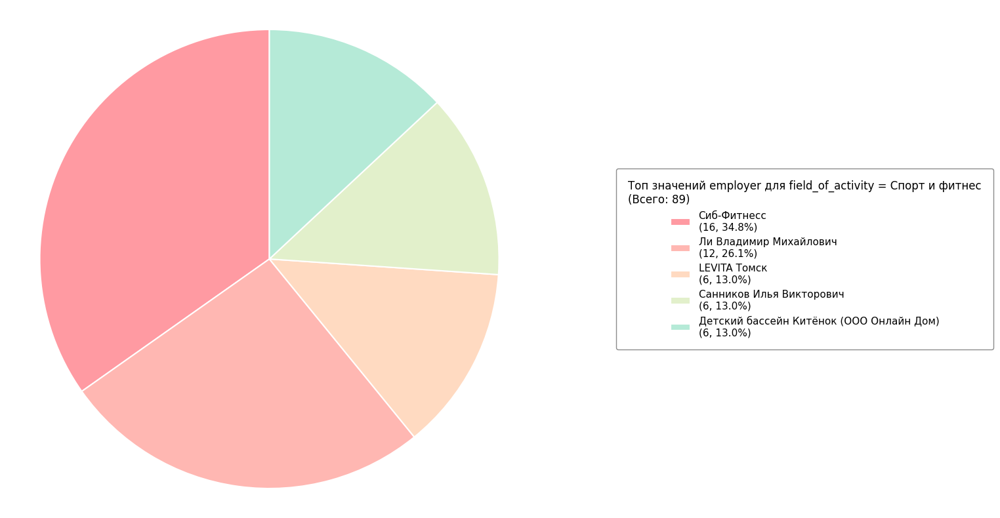

In [36]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [37]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

employer,#Многопива,1&3 Коммерческая Недвижимость,1&3 Концепт Девелопмент,100Масел,1C-Рарус,1С:БухОбслуживание.Азимут,1С:БухОбслуживание.ТэнчПро,2-й Специальный полк полиции ГУ МВД России по г.Москве (4 батальон 3 рота),2-ой ОПП ГУ МВД России по г. Москве 1 рота 1 батальон,2droida,...,гостиница ArtPlaza,деЛюкс-АВто,оптика< BECHA>,региональная компания,сеть кофеен Буланже,сеть магазинов Красное и Белое,томинвест,фирма Агрокомплекс им. Н.И. Ткачева,​Детский развлекательный центр Кактус,​Ресторан паназиатской кухни ПхиПхи
field_of_activity,,,,,,,,,,,,,,,,,,,,,
IT и технологии,0,0,0,0,0,0,0,0,0,9,...,0,0,0,0,0,0,0,0,0,0
Аналитика и исследования,0,0,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Бытовые услуги,0,0,0,0,0,0,0,0,0,0,...,20,0,0,0,0,0,0,0,0,0
Другие сферы,0,0,9,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,4,0
Инженерия и строительство,0,0,33,0,0,0,0,0,0,0,...,0,3,0,0,0,0,1,0,0,0
Маркетинг и реклама,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Медицина и фармацевтика,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
Образование и наука,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Производство и технические специальности,0,0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [38]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 727326.046
p-value = 0.0
Степени свободы = 83467


Оценим уровень связи коэффициентом Крамера

In [39]:
stats.contingency.association(contingency_table, method='cramer')

0.6857148546239085

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.68571) показывает, что сила связи заметная

    - Возможно из-за разрежённости матрицы результат не точен

### 14.4 Признаки experience и schedule

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [40]:
columns = ('experience', 'schedule')

Посмотрим на уникальные значения первого признака

In [41]:
dataset[columns[0]].unique()

['1-3', '0', '3-6', '6-']
Categories (4, object): ['0', '1-3', '3-6', '6-']

Выведем их количество

In [42]:
dataset[columns[0]].unique().shape

(4,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [43]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
experience,
1-3,39313
0,25731
3-6,14607
6-,1761


Посмотрим на уникальные значения второго признака

In [44]:
dataset[columns[1]].unique()

['full_day', 'shift', 'remote', 'labor', 'flexible']
Categories (5, object): ['flexible', 'full_day', 'labor', 'remote', 'shift']

Выведем их количество

In [45]:
dataset[columns[1]].unique().shape

(5,)

Для каждого значения первого признака построим круговые диаграммы

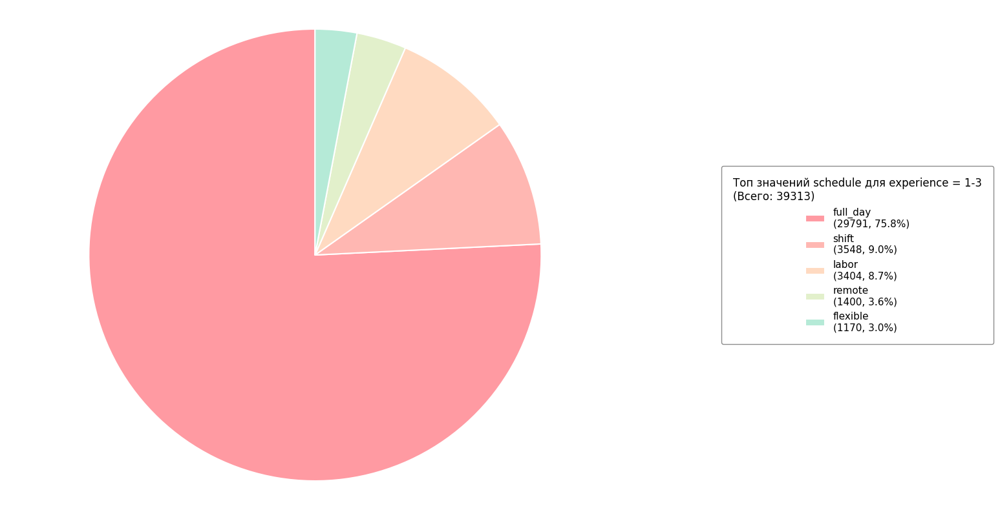

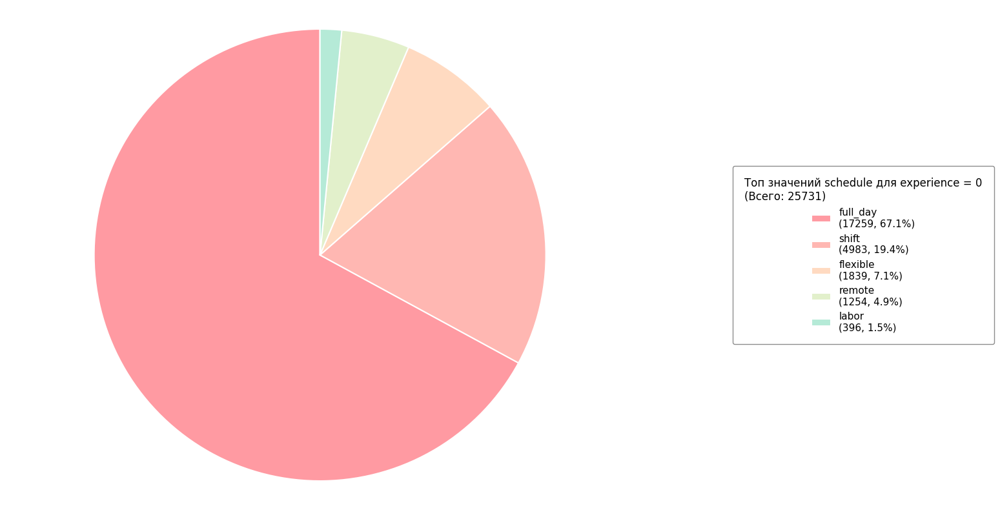

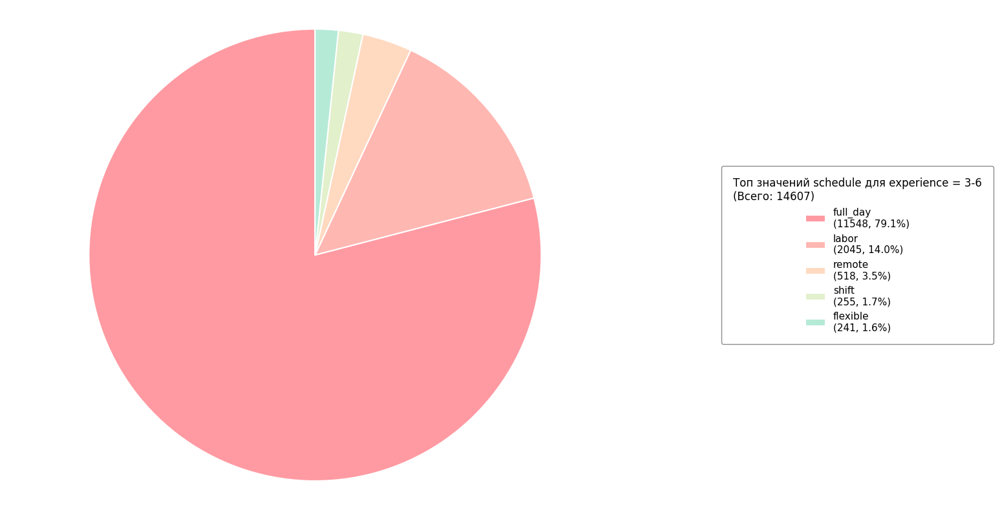

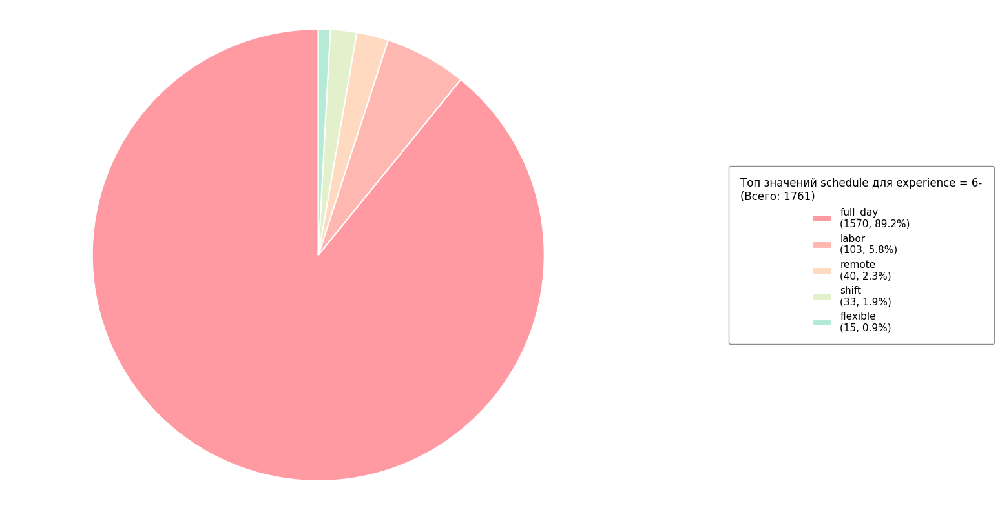

In [46]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [47]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

schedule,flexible,full_day,labor,remote,shift
experience,,,,,
0,1839,17259,396,1254,4983
1-3,1170,29791,3404,1400,3548
3-6,241,11548,2045,518,255
6-,15,1570,103,40,33


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [48]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 6624.003
p-value = 0.0
Степени свободы = 12


Оценим уровень связи коэффициентом Крамера

In [49]:
stats.contingency.association(contingency_table, method='cramer')

0.16468552692311422

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.1647) показывает, что сила связи слабая

### 14.5 Признаки experience и employment

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [50]:
columns = ('experience', 'employment')

Посмотрим на уникальные значения первого признака

In [51]:
dataset[columns[0]].unique()

['1-3', '0', '3-6', '6-']
Categories (4, object): ['0', '1-3', '3-6', '6-']

Выведем их количество

In [52]:
dataset[columns[0]].unique().shape

(4,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [53]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
experience,
1-3,39313
0,25731
3-6,14607
6-,1761


Посмотрим на уникальные значения второго признака

In [54]:
dataset[columns[1]].unique()

['full', 'part', 'project', 'probation']
Categories (4, object): ['full', 'part', 'probation', 'project']

Выведем их количество

In [55]:
dataset[columns[1]].unique().shape

(4,)

Для каждого значения первого признака построим круговые диаграммы

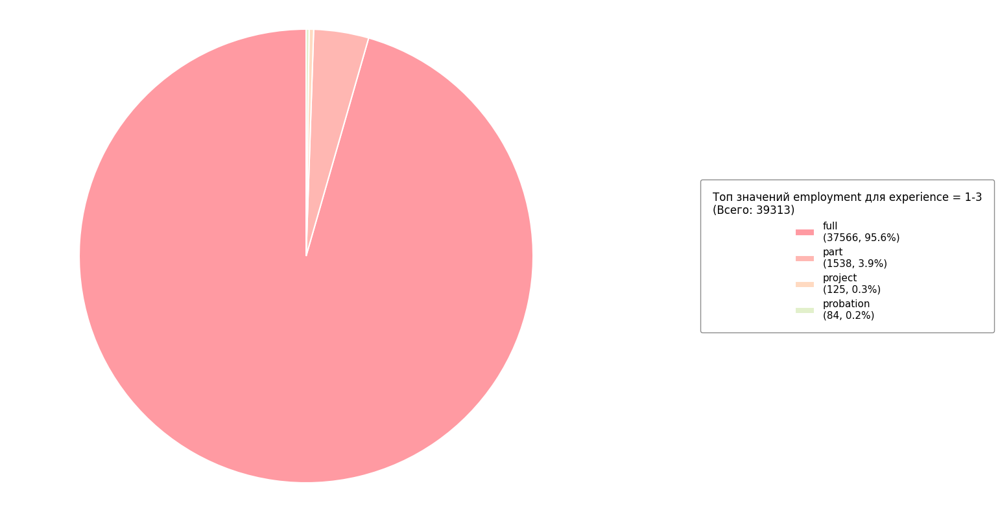

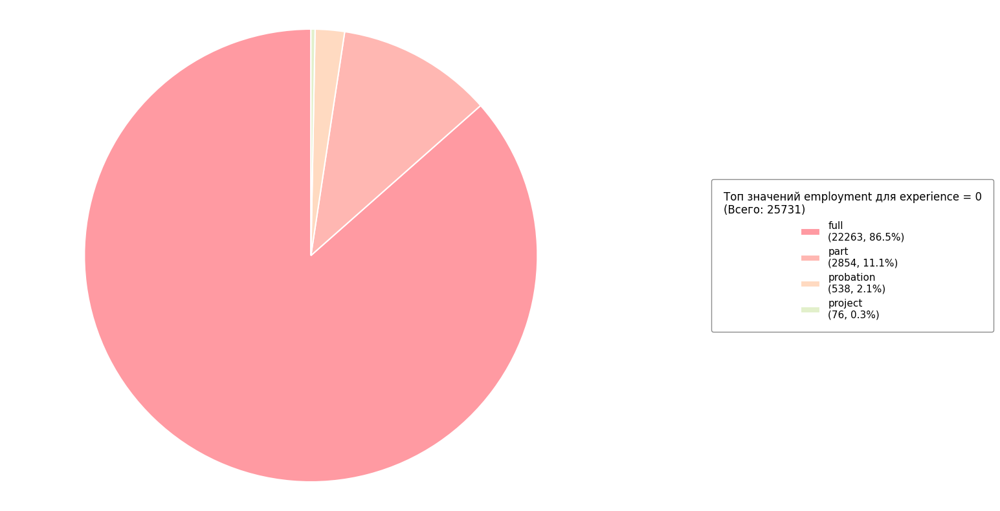

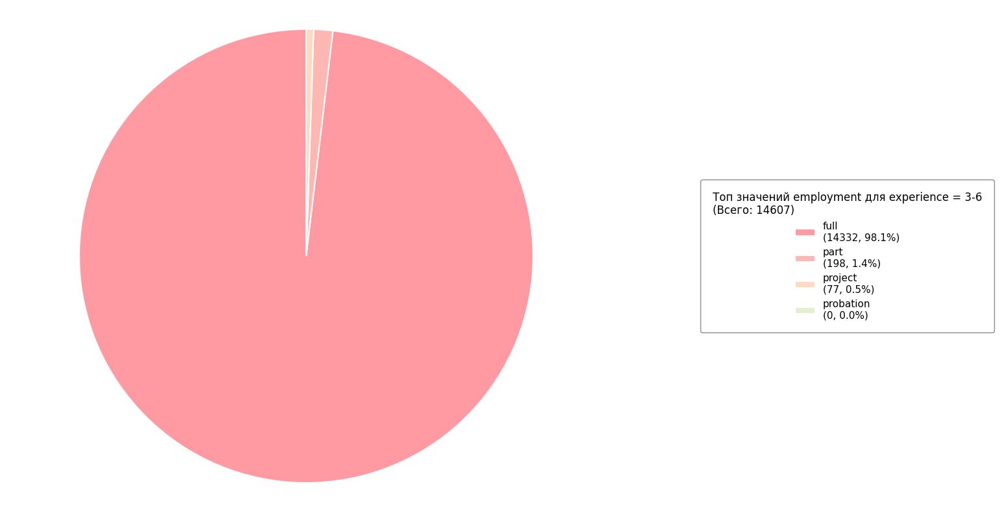

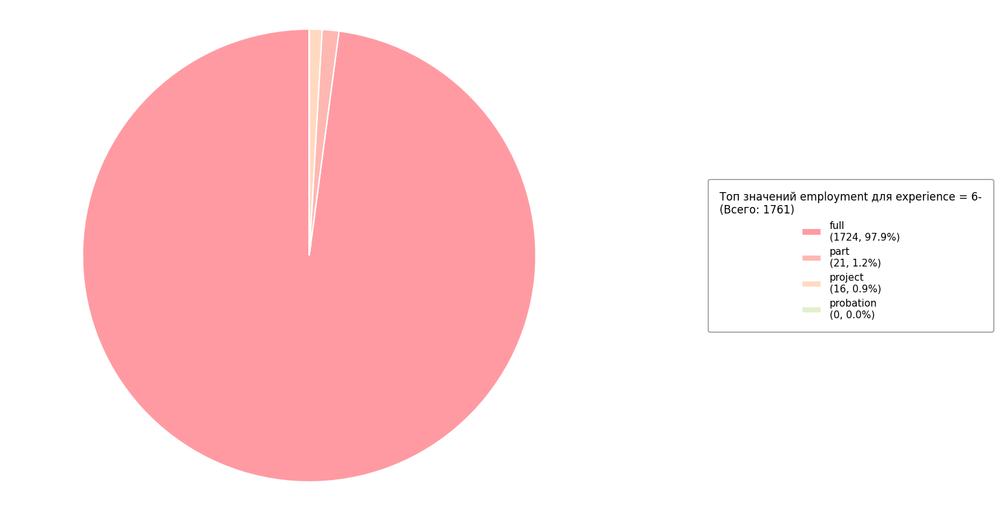

In [56]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [57]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

employment,full,part,probation,project
experience,,,,
0,22263,2854,538,76
1-3,37566,1538,84,125
3-6,14332,198,0,77
6-,1724,21,0,16


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [58]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 3185.577
p-value = 0.0
Степени свободы = 9


Оценим уровень связи коэффициентом Крамера

In [59]:
stats.contingency.association(contingency_table, method='cramer')

0.11420607928888499

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.1142) показывает, что сила связи слабая

### 14.6 Признаки experience и accept_handicapped

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [60]:
columns = ('experience', 'accept_handicapped')

Посмотрим на уникальные значения первого признака

In [61]:
dataset[columns[0]].unique()

['1-3', '0', '3-6', '6-']
Categories (4, object): ['0', '1-3', '3-6', '6-']

Выведем их количество

In [62]:
dataset[columns[0]].unique().shape

(4,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [63]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
experience,
1-3,39313
0,25731
3-6,14607
6-,1761


Посмотрим на уникальные значения второго признака

In [64]:
dataset[columns[1]].unique()

['0', '1']
Categories (2, object): ['0', '1']

Выведем их количество

In [65]:
dataset[columns[1]].unique().shape

(2,)

Для каждого значения первого признака построим круговые диаграммы

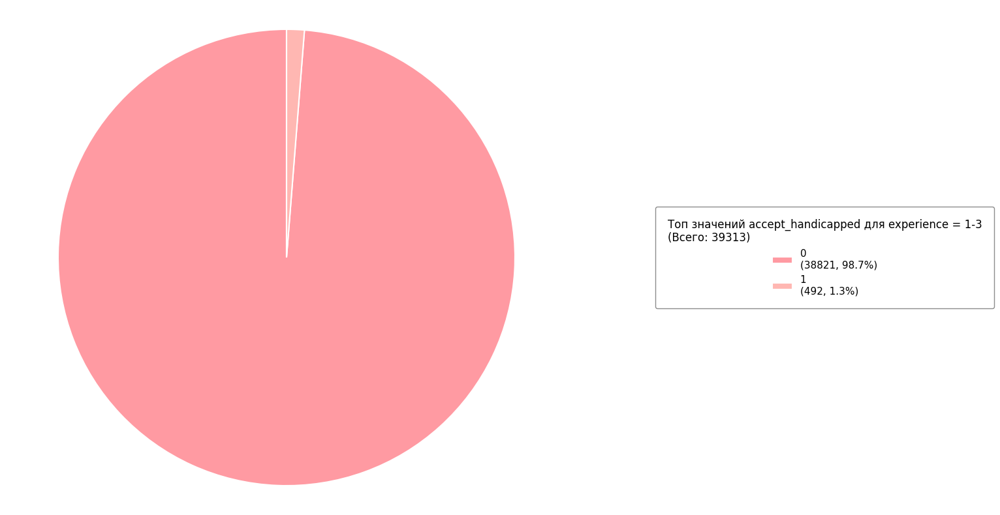

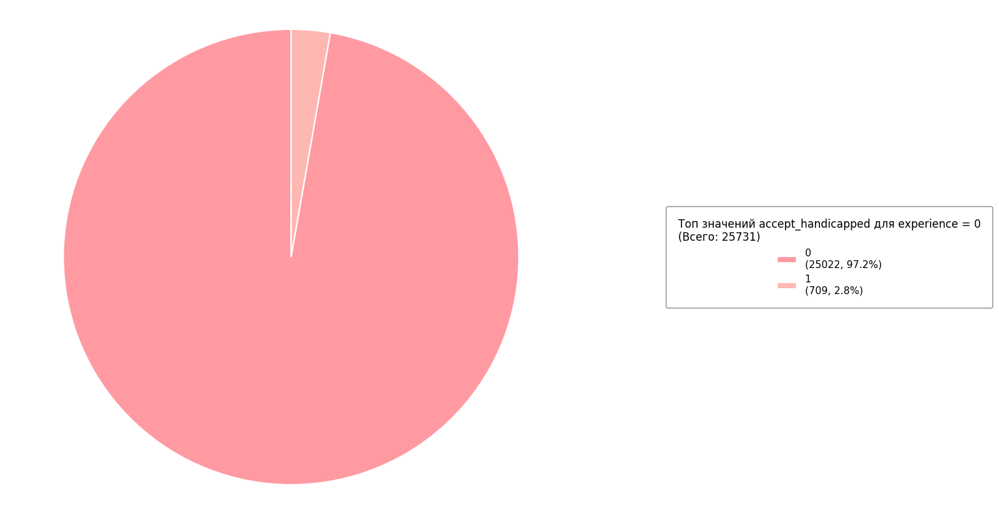

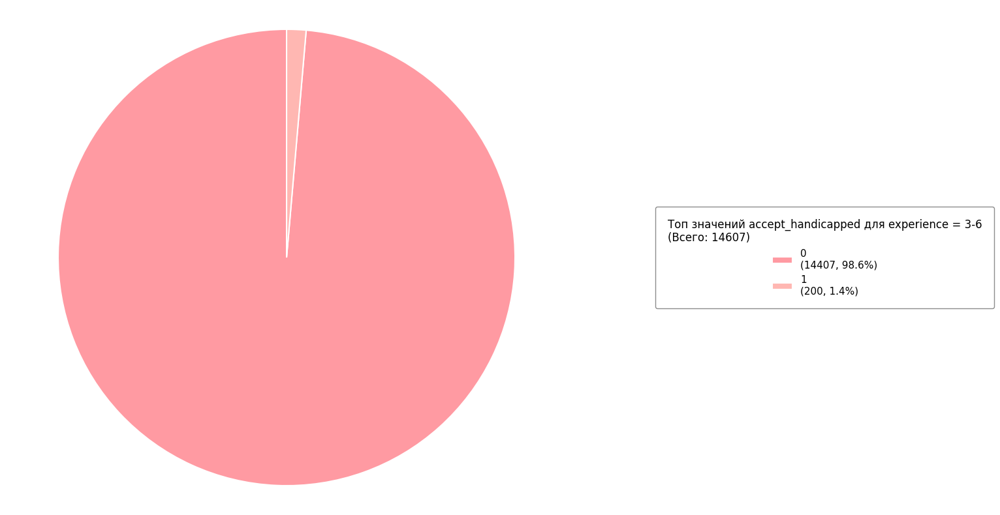

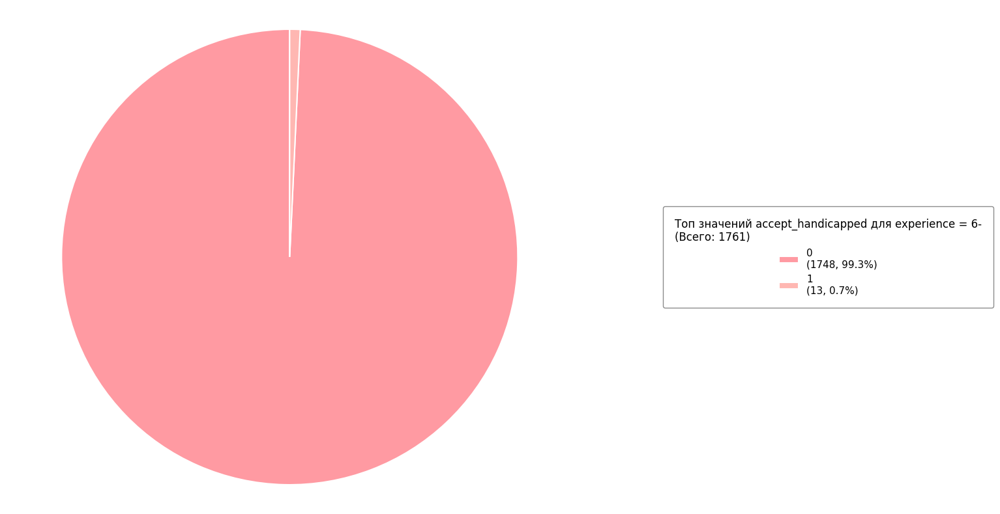

In [66]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [67]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

accept_handicapped,0,1
experience,,
0,25022,709
1-3,38821,492
3-6,14407,200
6-,1748,13


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [68]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 232.543
p-value = 3.8996763222220725e-50
Степени свободы = 3


Оценим уровень связи коэффициентом Крамера

In [69]:
stats.contingency.association(contingency_table, method='cramer')

0.05344501444691562

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.053445) показывает, что связь незначительна

### 14.7 Признаки experience и city

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [70]:
columns = ('city', 'experience')

Посмотрим на уникальные значения первого признака

In [71]:
dataset[columns[0]].unique()

<StringArray>
[                            'Томск',                          'Могочино',
                           'Каргала',    'Первомайское (Томская область)',
                           'Чажемто',                            'Самусь',
                         'Колпашево',                          'Рыбалово',
                            'Парбиг',                          'Копылово',
                            'Курлек',                          'Кедровый',
                        'Кривошеино',                          'Кисловка',
                            'Бакчар',                          'Богашёво',
         'Северск (Томская область)',         'Светлый (Томская область)',
                         'Стрежевой',                          'Белый Яр',
                         'Молчаново',                         'Подгорное',
                        'Мельниково',                             'Асино',
                          'Каргасок',                         'Тегульдет',
           

Выведем их количество

In [72]:
dataset[columns[0]].unique().shape

(42,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [73]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
city,
Томск,74319
Северск (Томская область),3081
Стрежевой,1001
Асино,396
Колпашево,337
Первомайское (Томская область),181
Зональная Станция,152
Светлый (Томская область),150
Парабель,136


Посмотрим на уникальные значения второго признака

In [74]:
dataset[columns[1]].unique()

['1-3', '0', '3-6', '6-']
Categories (4, object): ['0', '1-3', '3-6', '6-']

Выведем их количество

In [75]:
dataset[columns[1]].unique().shape

(4,)

Для каждого значения первого признака построим круговые диаграммы

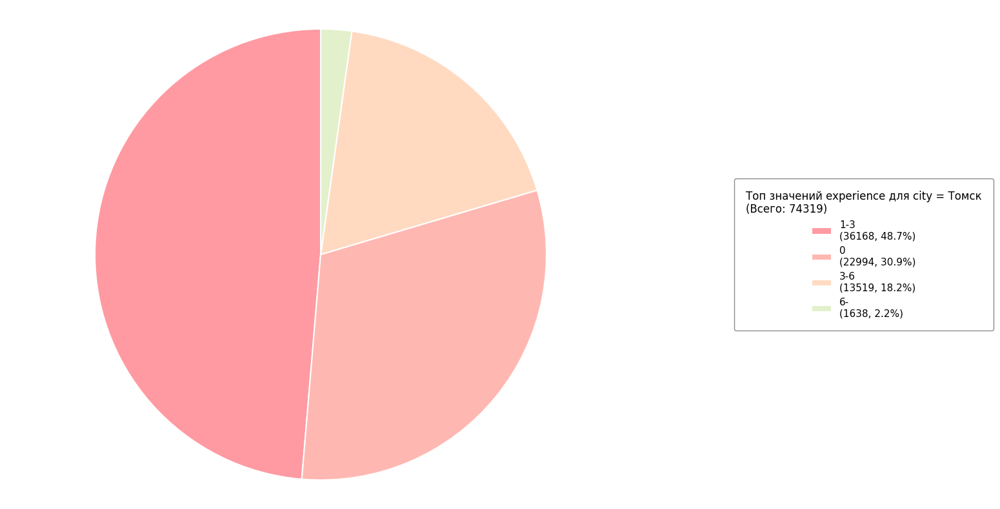

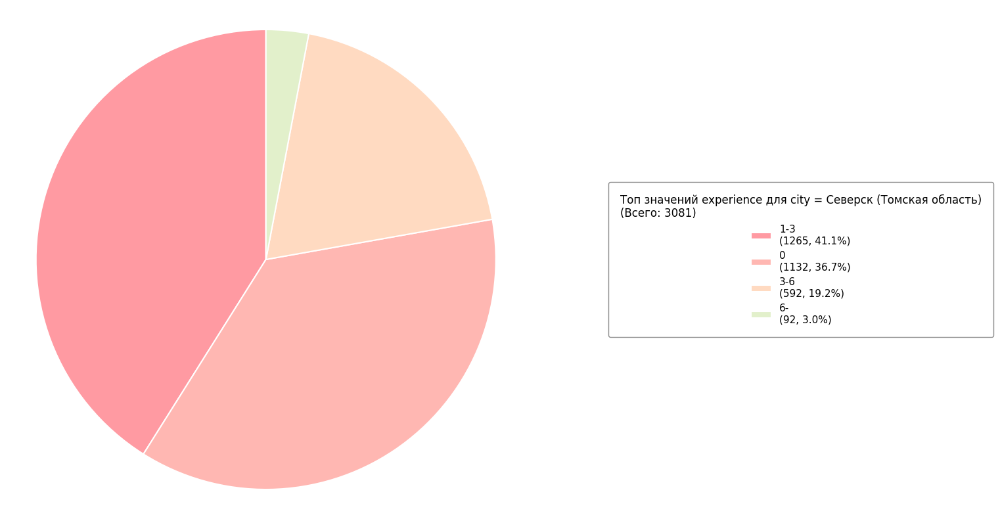

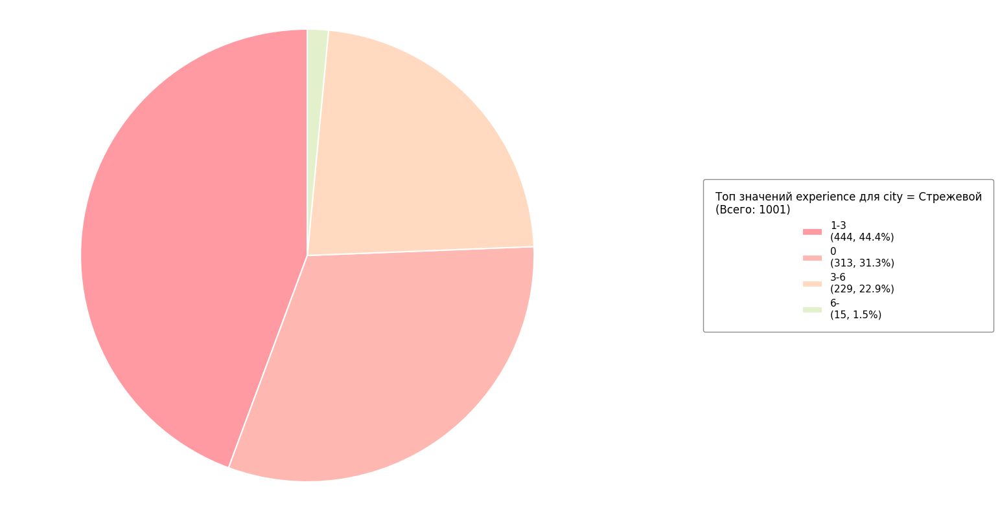

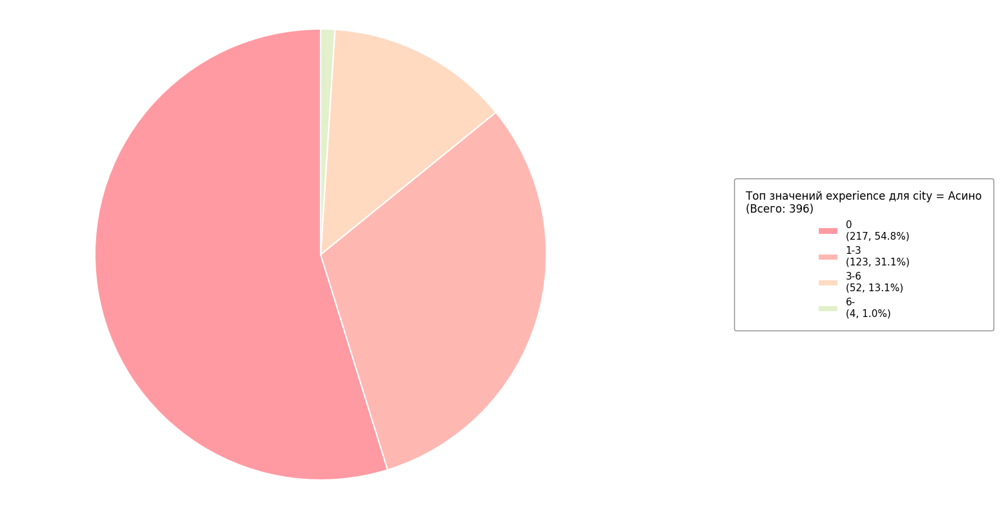

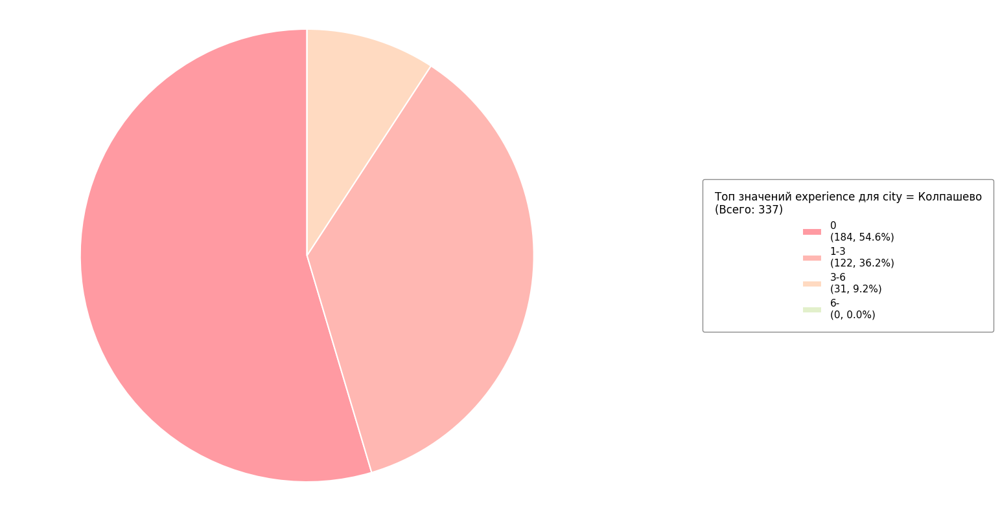

...

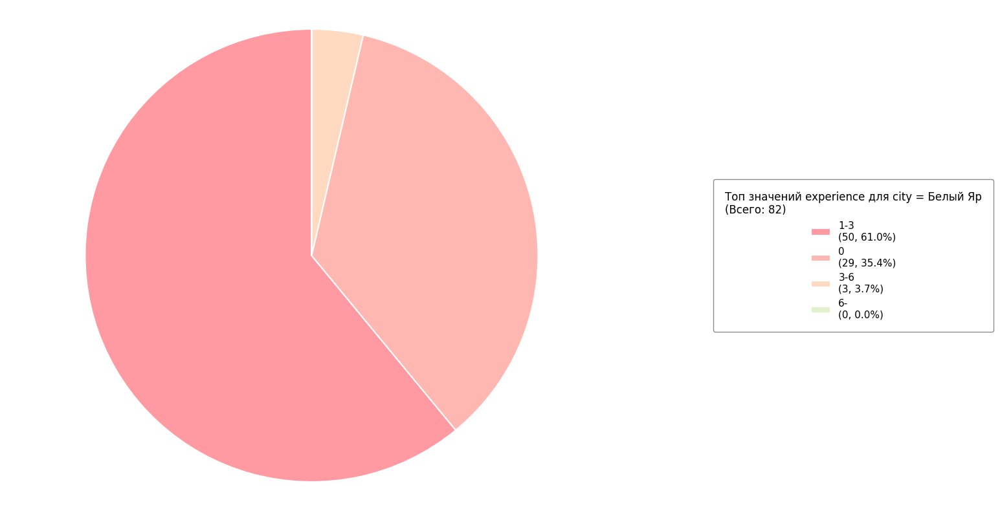

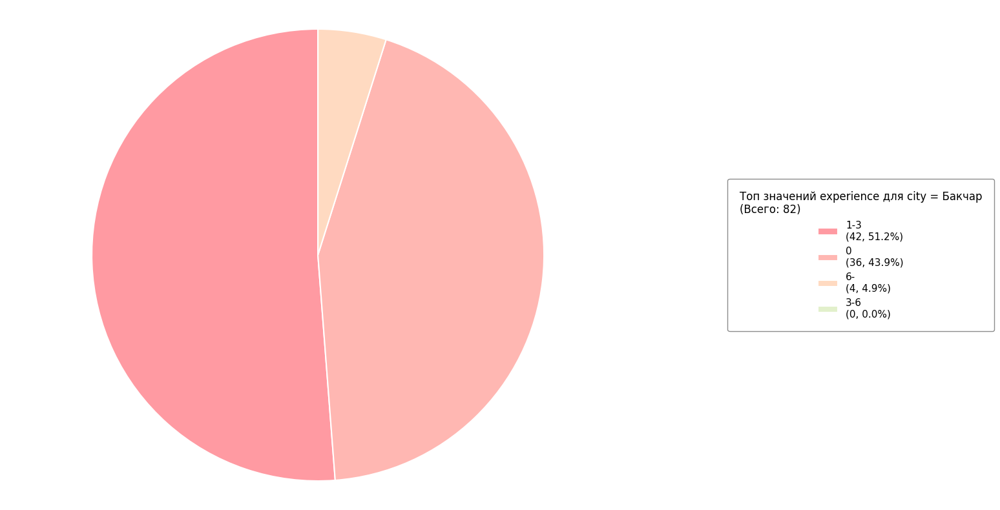

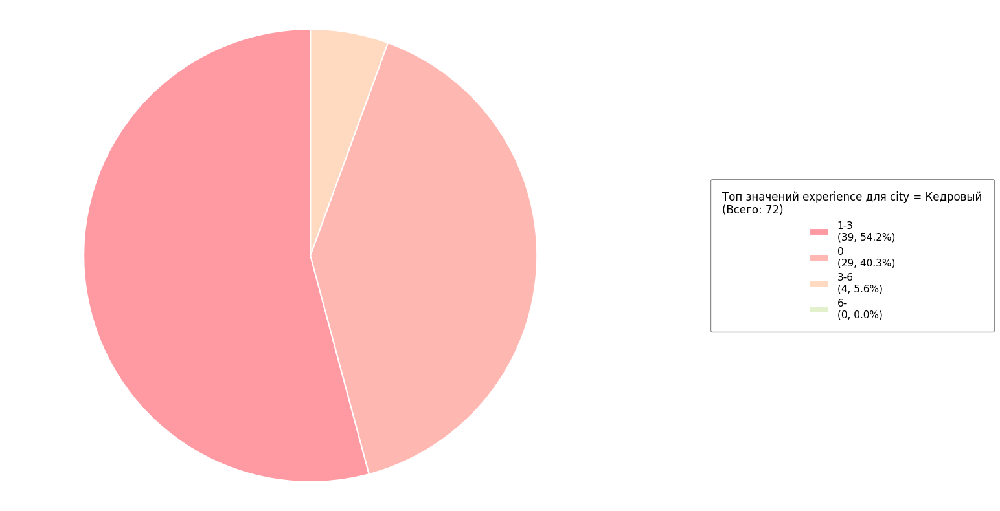

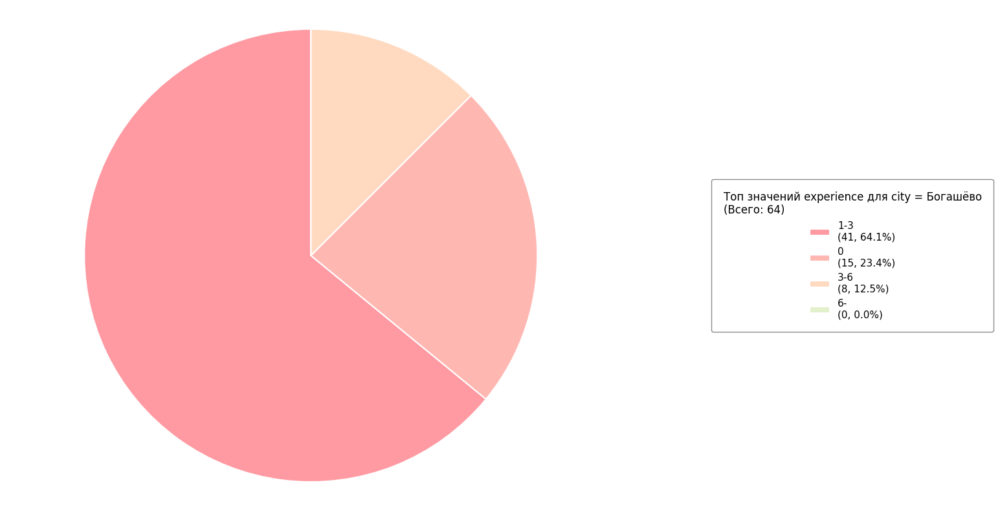

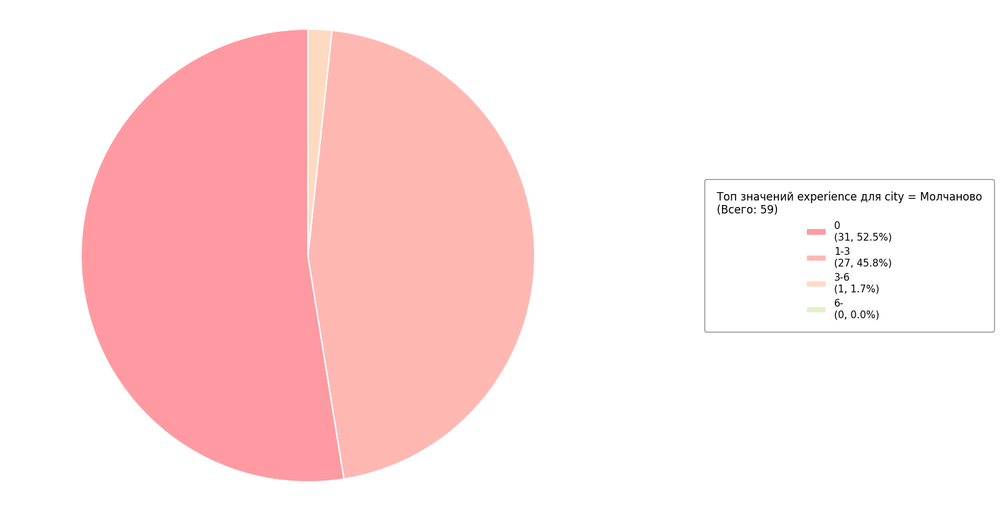

In [76]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [77]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

experience,0,1-3,3-6,6-
city,,,,
Александровское (Томская область),52,58,20,0
Асино,217,123,52,4
Бакчар,36,42,0,4
Батурино,0,13,0,0
Белый Яр,29,50,3,0
Богашёво,15,41,8,0
Зональная Станция,52,79,21,0
Зоркальцево,19,21,8,0
Зырянское,80,38,0,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [78]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 943.476
p-value = 1.359157908372113e-126
Степени свободы = 123


Оценим уровень связи коэффициентом Крамера

In [79]:
stats.contingency.association(contingency_table, method='cramer')

0.06215277135512282

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.06215) показывает, что связь незначительна

### 14.8 Признаки experience и field_of_activity

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [80]:
columns = ('field_of_activity', 'experience')

Посмотрим на уникальные значения первого признака

In [81]:
dataset[columns[0]].unique()

['Инженерия и строительство', 'Транспорт и логистика', 'Торговля и продажи', 'Сфера обслуживания', 'Производство и технические специальности', ..., 'Образование и наука', 'Аналитика и исследования', 'Туризм', 'Сельское хозяйство', 'Спорт и фитнес']
Length: 20
Categories (20, object): ['IT и технологии', 'Аналитика и исследования', 'Бытовые услуги',
                          'Другие сферы', ..., 'Туризм', 'Управление и администрирование',
                          'Финансы и бухгалтерия', 'Юриспруденция и безопасность']

Выведем их количество

In [82]:
dataset[columns[0]].unique().shape

(20,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [83]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
field_of_activity,
Торговля и продажи,15586
Инженерия и строительство,9292
Сфера обслуживания,7322
Другие сферы,7302
Управление и администрирование,5902
Транспорт и логистика,5860
Производство и технические специальности,5347
IT и технологии,4988
Финансы и бухгалтерия,4616


Посмотрим на уникальные значения второго признака

In [84]:
dataset[columns[1]].unique()

['1-3', '0', '3-6', '6-']
Categories (4, object): ['0', '1-3', '3-6', '6-']

Выведем их количество

In [85]:
dataset[columns[1]].unique().shape

(4,)

Для каждого значения первого признака построим круговые диаграммы

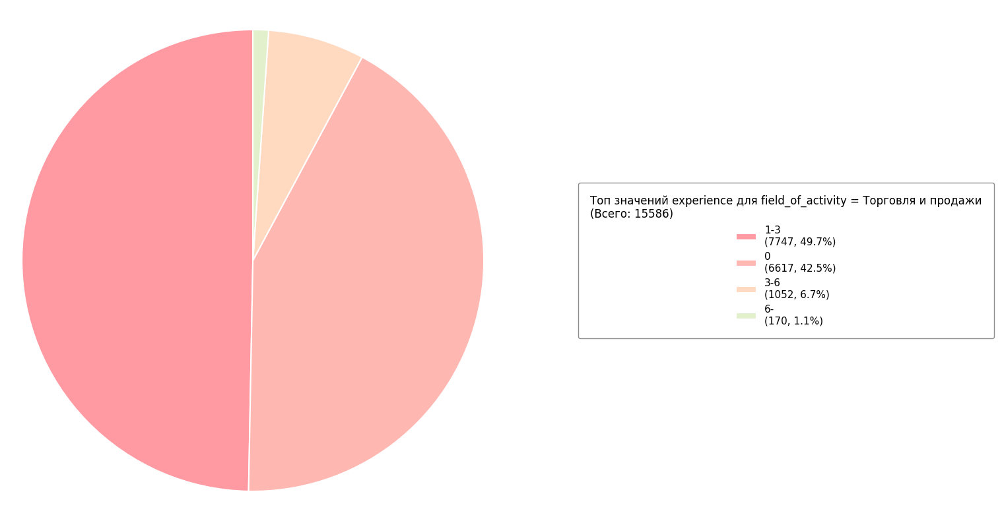

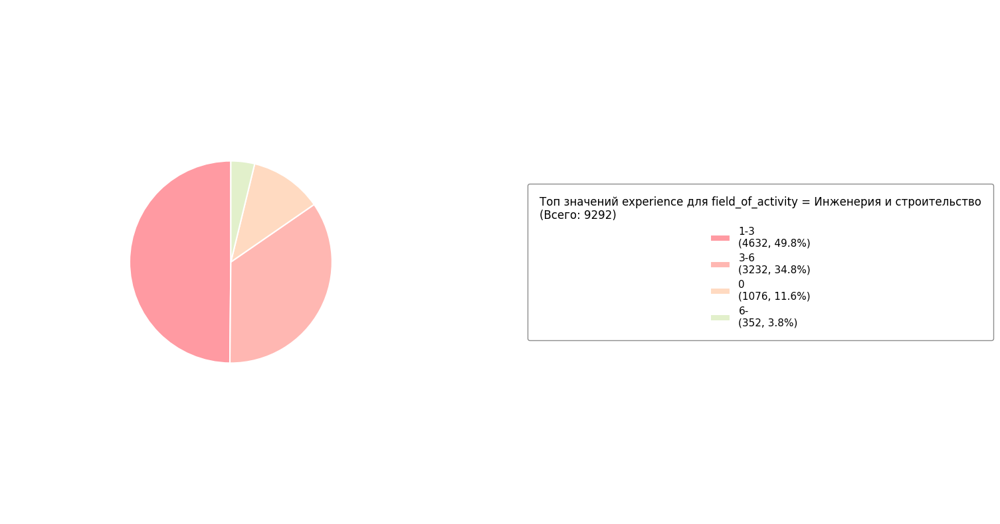

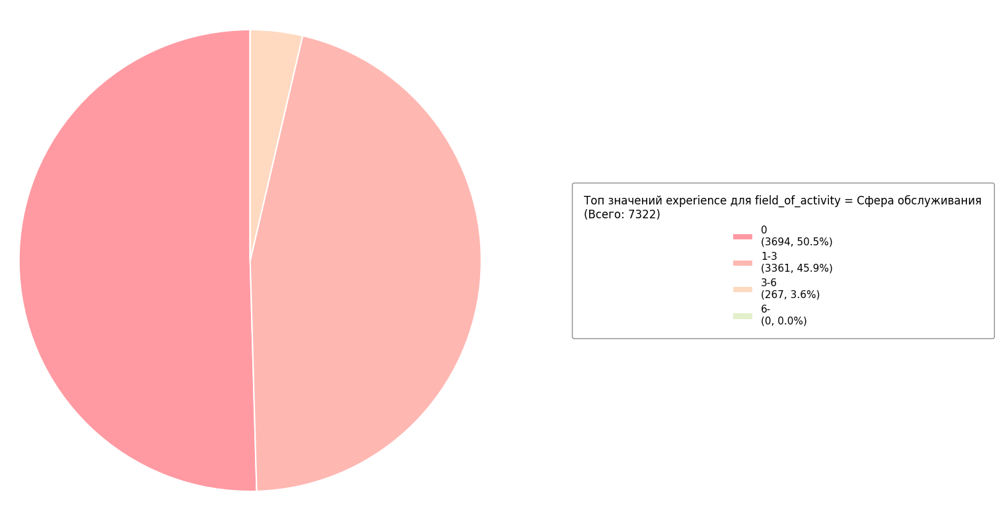

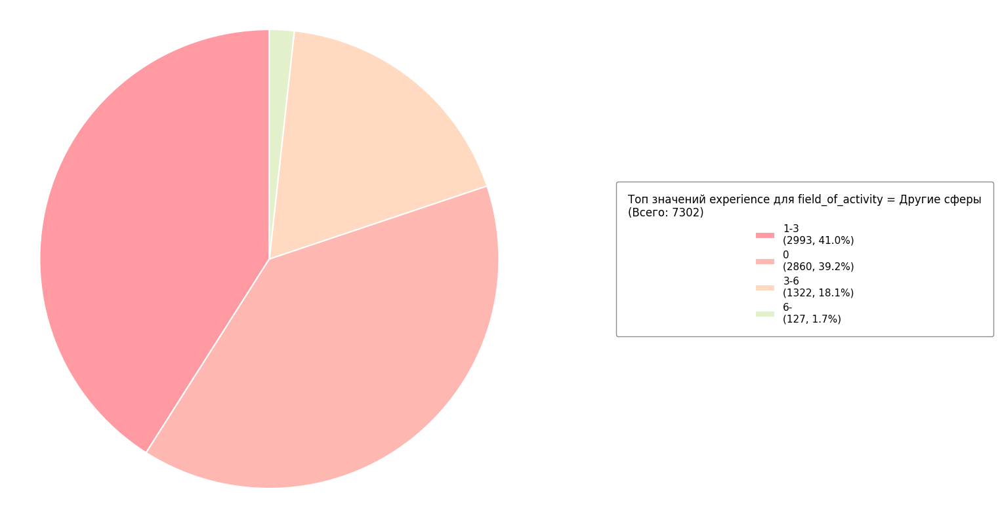

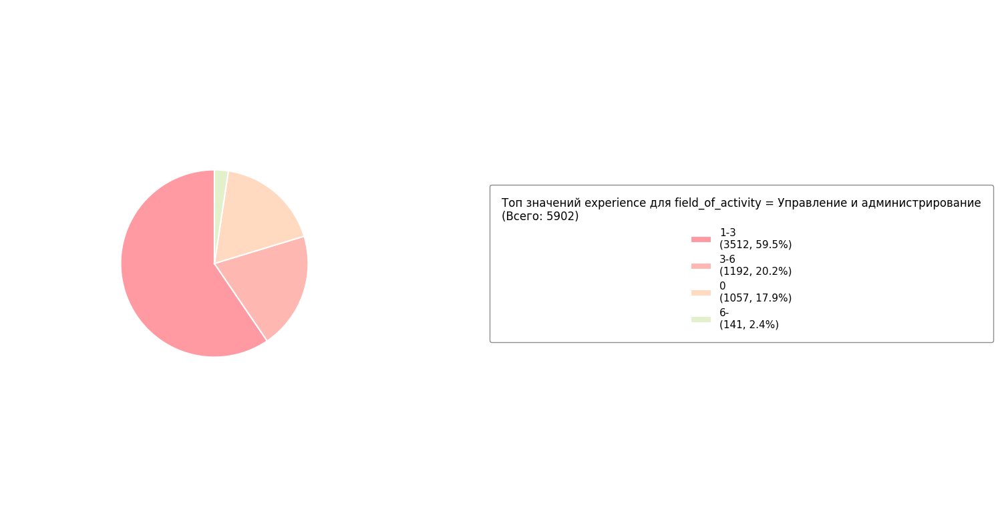

...

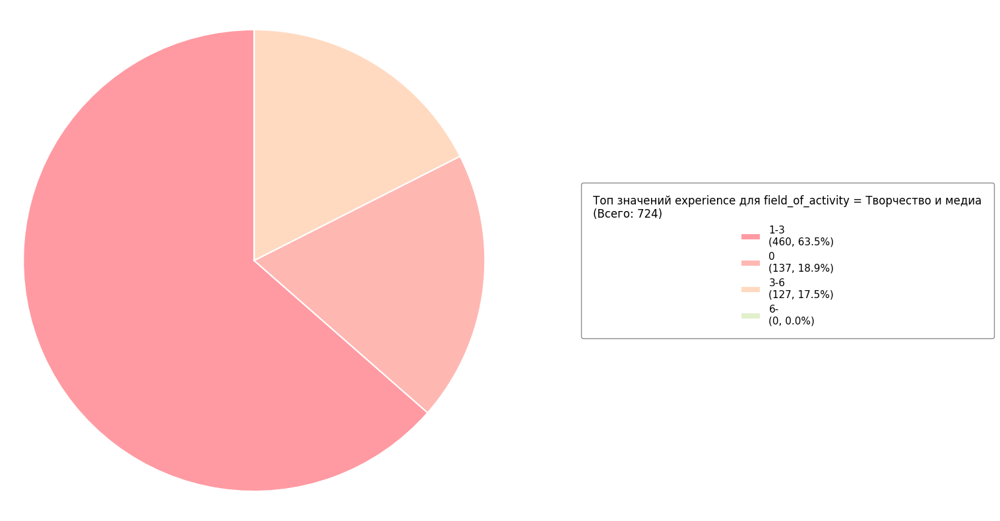

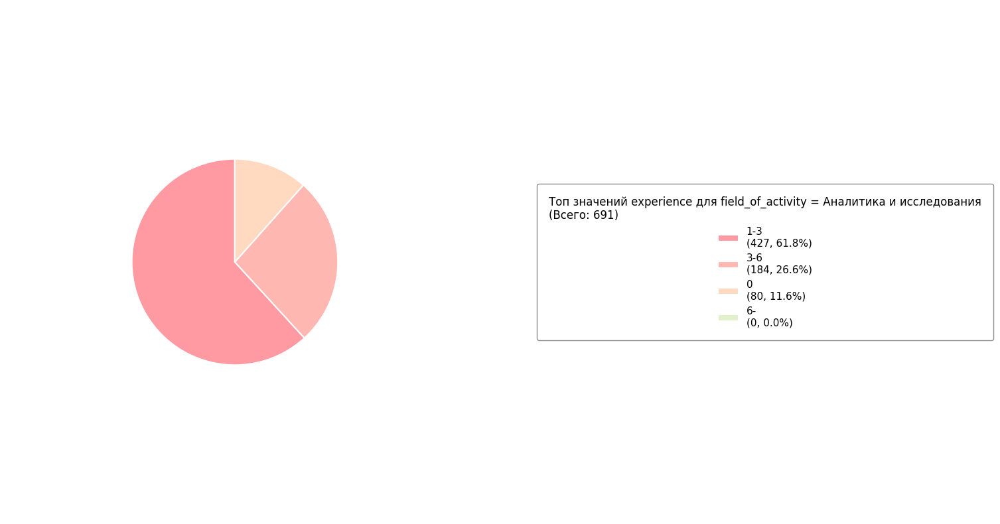

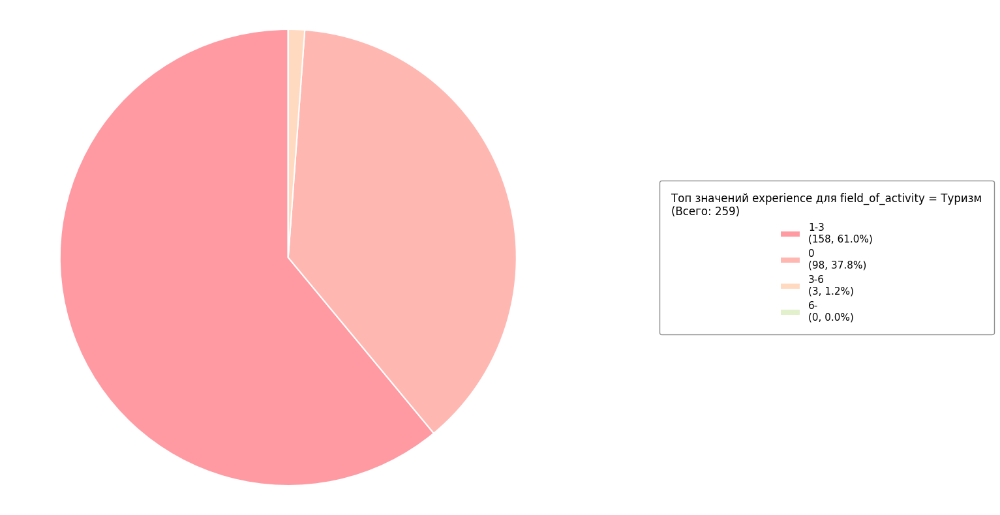

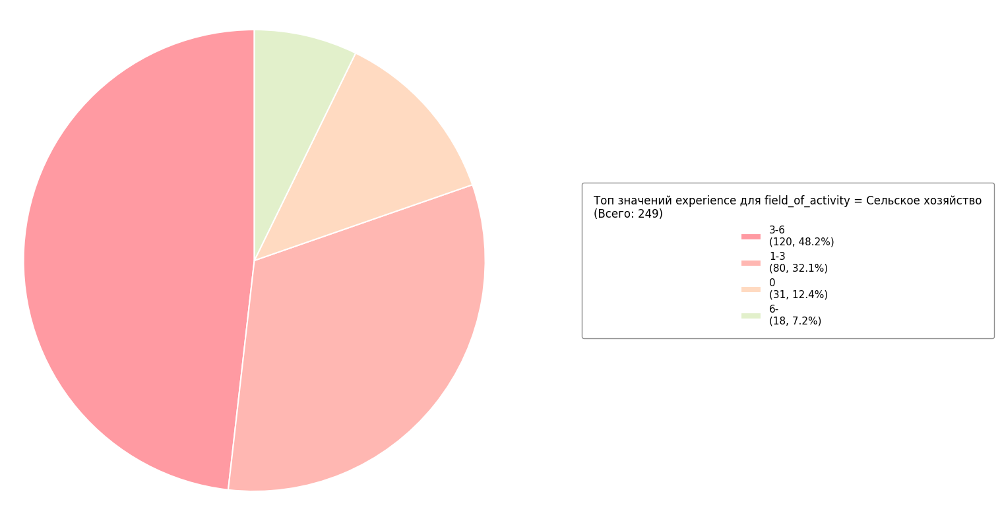

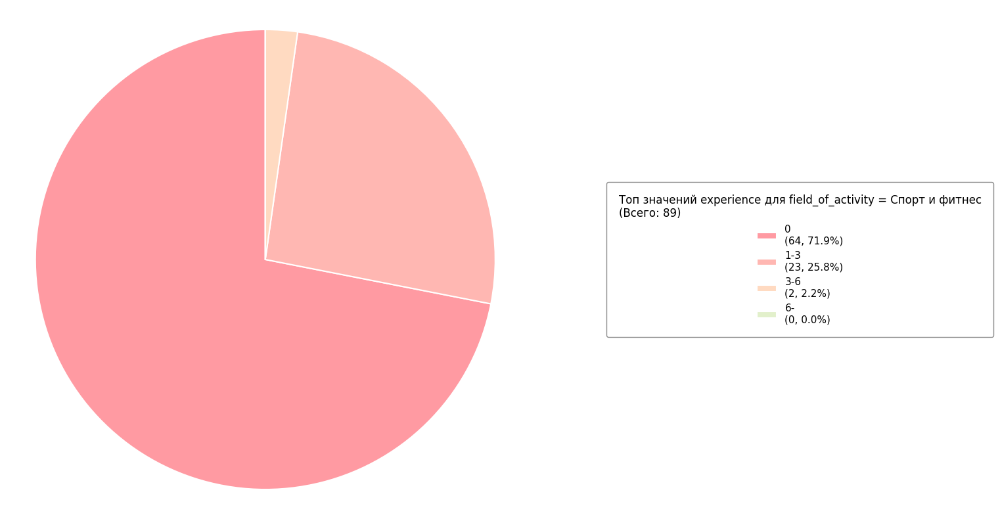

In [86]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [87]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

experience,0,1-3,3-6,6-
field_of_activity,,,,
IT и технологии,646,2674,1535,133
Аналитика и исследования,80,427,184,0
Бытовые услуги,675,274,36,7
Другие сферы,2860,2993,1322,127
Инженерия и строительство,1076,4632,3232,352
Маркетинг и реклама,315,1076,213,9
Медицина и фармацевтика,2068,1209,397,59
Образование и наука,721,1128,217,30
Производство и технические специальности,1004,2752,1429,162


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [88]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 13996.040
p-value = 0.0
Степени свободы = 57


Оценим уровень связи коэффициентом Крамера

In [89]:
stats.contingency.association(contingency_table, method='cramer')

0.23938544976791132

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.239385) показывает, что сила связи слабая

### 14.9 Признаки schedule и employment

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [90]:
columns = ('schedule', 'employment')

Посмотрим на уникальные значения первого признака

In [91]:
dataset[columns[0]].unique()

['full_day', 'shift', 'remote', 'labor', 'flexible']
Categories (5, object): ['flexible', 'full_day', 'labor', 'remote', 'shift']

Выведем их количество

In [92]:
dataset[columns[0]].unique().shape

(5,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [93]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
schedule,
full_day,60168
shift,8819
labor,5948
flexible,3265
remote,3212


Посмотрим на уникальные значения второго признака

In [94]:
dataset[columns[1]].unique()

['full', 'part', 'project', 'probation']
Categories (4, object): ['full', 'part', 'probation', 'project']

Выведем их количество

In [95]:
dataset[columns[1]].unique().shape

(4,)

Для каждого значения первого признака построим круговые диаграммы

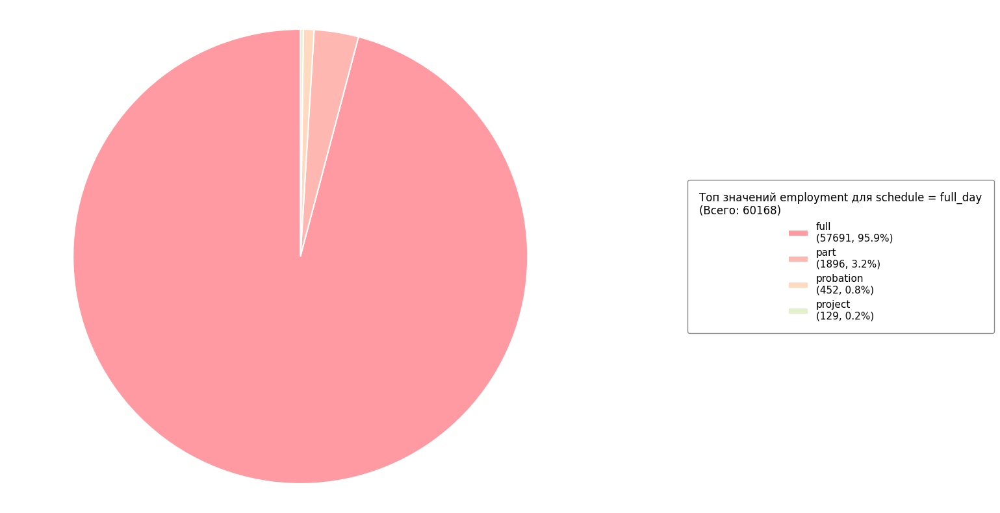

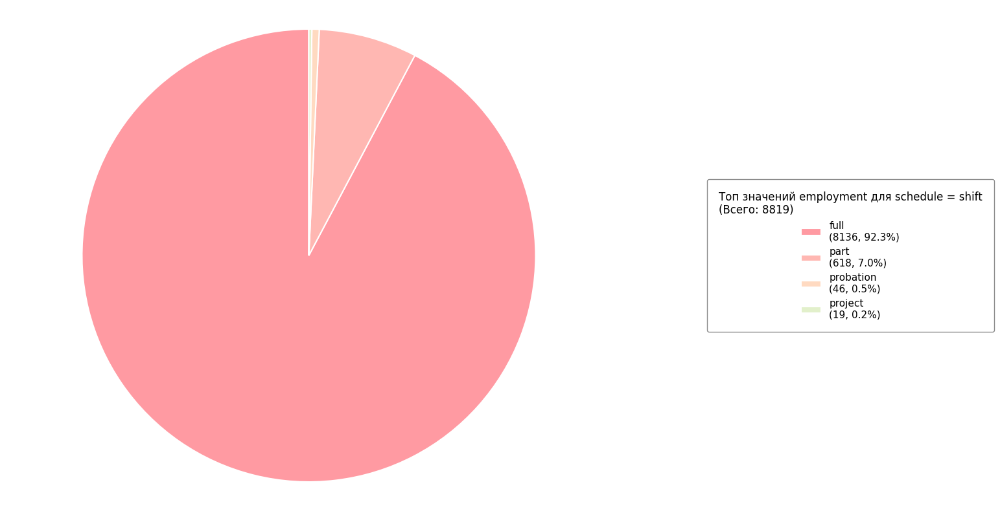

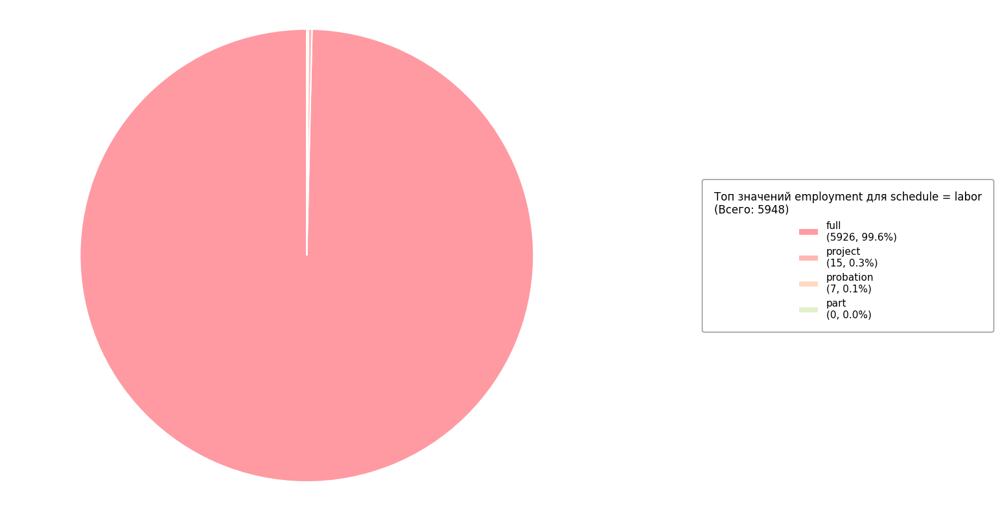

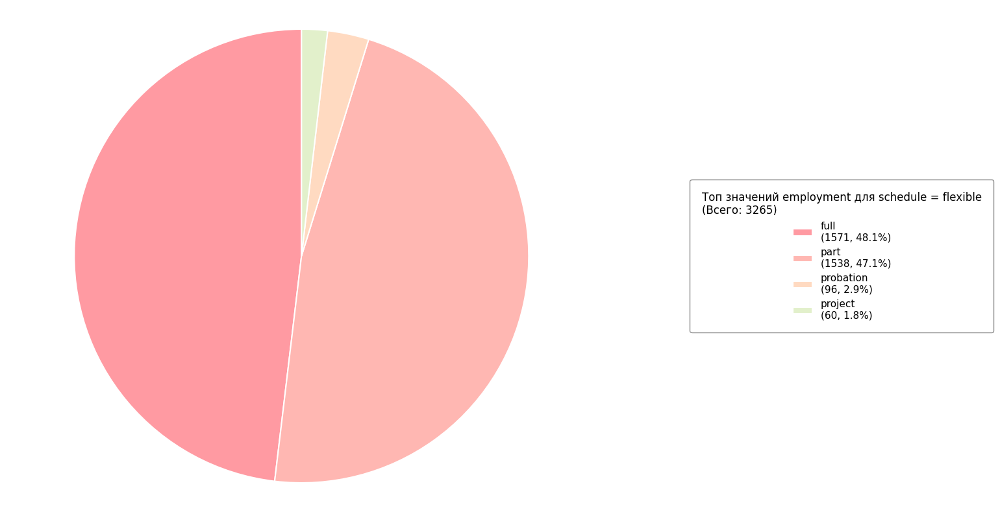

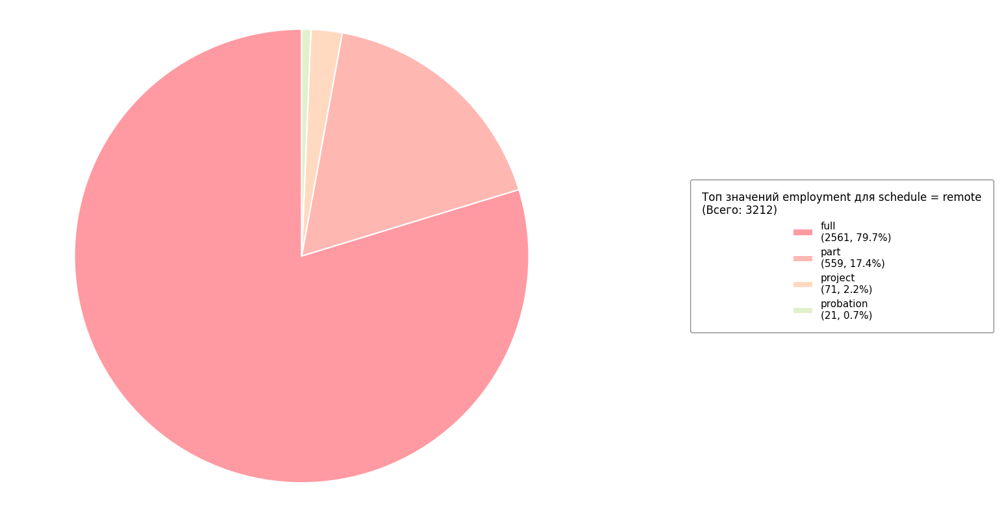

In [96]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [97]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

employment,full,part,probation,project
schedule,,,,
flexible,1571,1538,96,60
full_day,57691,1896,452,129
labor,5926,0,7,15
remote,2561,559,21,71
shift,8136,618,46,19


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [98]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 13352.541
p-value = 0.0
Степени свободы = 12


Оценим уровень связи коэффициентом Крамера

In [99]:
stats.contingency.association(contingency_table, method='cramer')

0.23381755752736588

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.23381) показывает, что сила связи слабая

### 14.10 Признаки schedule и accept_handicapped

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [100]:
columns = ('schedule', 'accept_handicapped')

Посмотрим на уникальные значения первого признака

In [101]:
dataset[columns[0]].unique()

['full_day', 'shift', 'remote', 'labor', 'flexible']
Categories (5, object): ['flexible', 'full_day', 'labor', 'remote', 'shift']

Выведем их количество

In [102]:
dataset[columns[0]].unique().shape

(5,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [103]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
schedule,
full_day,60168
shift,8819
labor,5948
flexible,3265
remote,3212


Посмотрим на уникальные значения второго признака

In [104]:
dataset[columns[1]].unique()

['0', '1']
Categories (2, object): ['0', '1']

Выведем их количество

In [105]:
dataset[columns[1]].unique().shape

(2,)

Для каждого значения первого признака построим круговые диаграммы

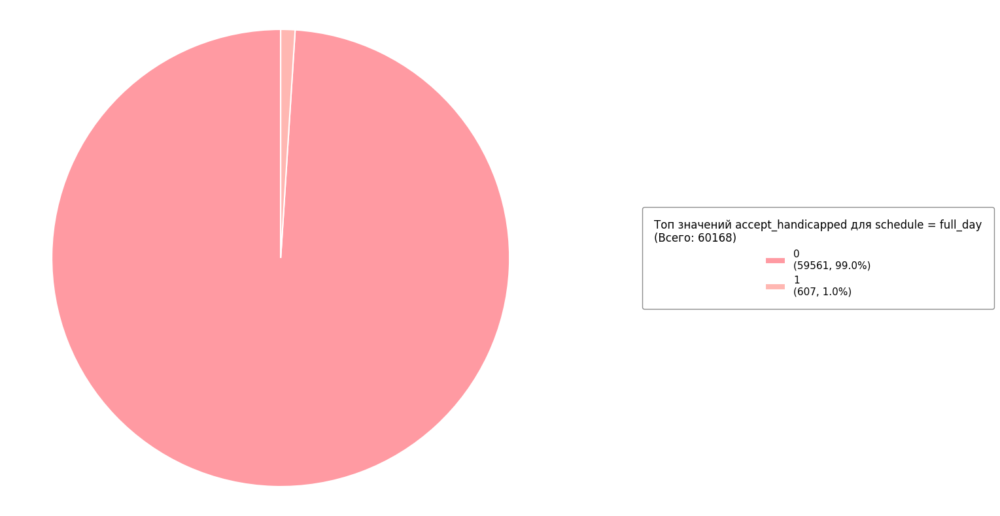

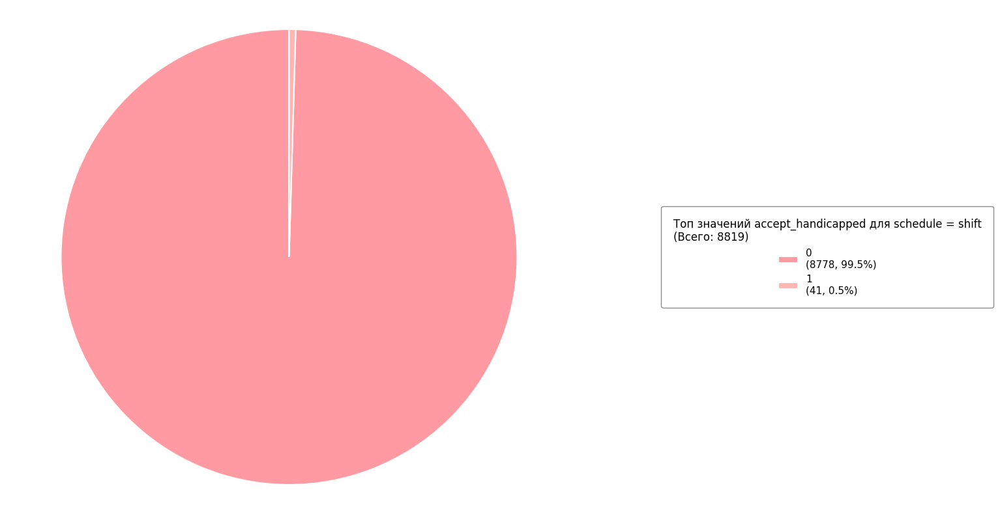

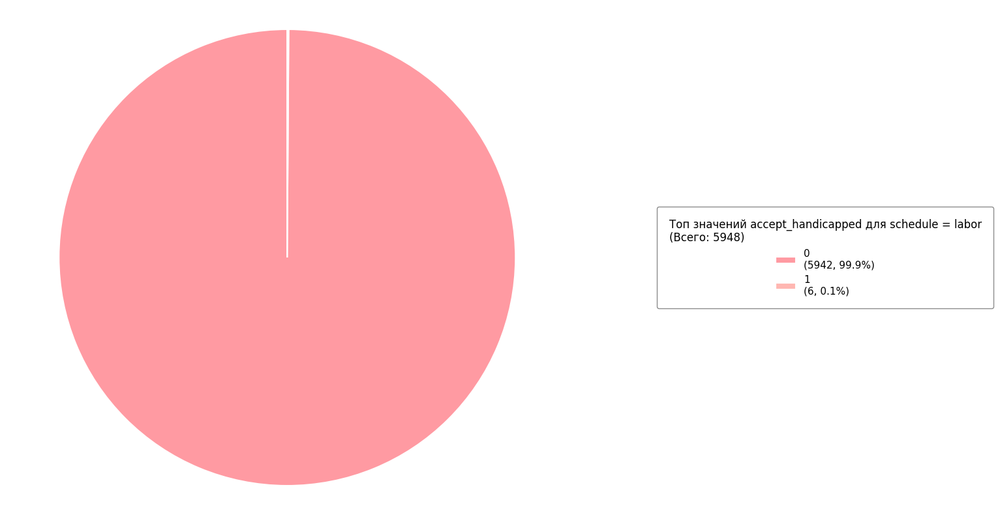

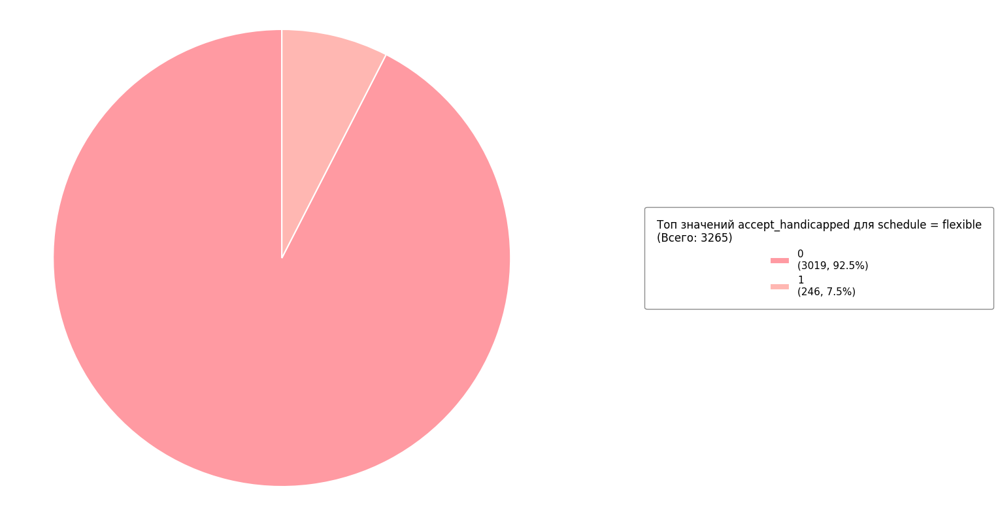

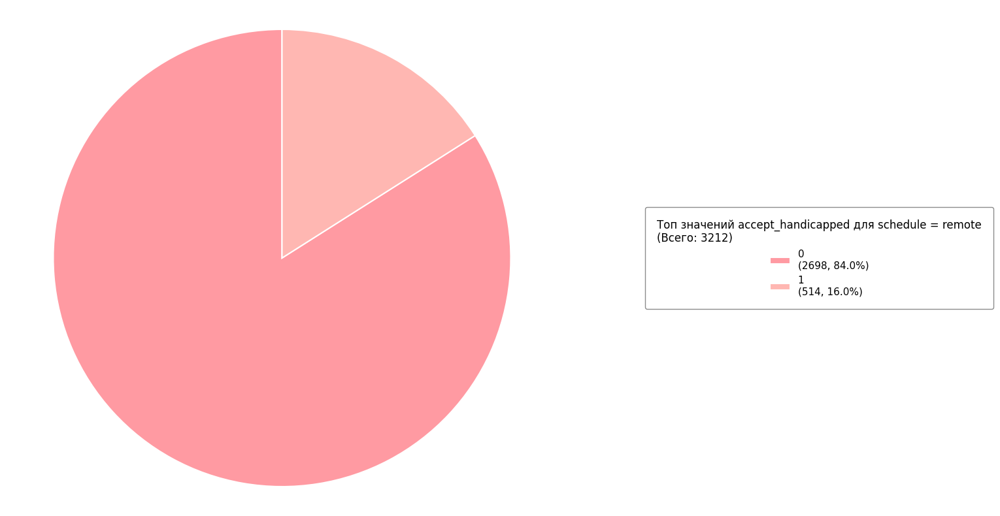

In [106]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [107]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

accept_handicapped,0,1
schedule,,
flexible,3019,246
full_day,59561,607
labor,5942,6
remote,2698,514
shift,8778,41


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [108]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 4836.817
p-value = 0.0
Степени свободы = 4


Оценим уровень связи коэффициентом Крамера

In [109]:
stats.contingency.association(contingency_table, method='cramer')

0.24374494991669435

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.2438) показывает, что сила связи слабая

### 14.11 Признаки schedule и city

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [110]:
columns = ('city', 'schedule')

Посмотрим на уникальные значения первого признака

In [111]:
dataset[columns[0]].unique()

<StringArray>
[                            'Томск',                          'Могочино',
                           'Каргала',    'Первомайское (Томская область)',
                           'Чажемто',                            'Самусь',
                         'Колпашево',                          'Рыбалово',
                            'Парбиг',                          'Копылово',
                            'Курлек',                          'Кедровый',
                        'Кривошеино',                          'Кисловка',
                            'Бакчар',                          'Богашёво',
         'Северск (Томская область)',         'Светлый (Томская область)',
                         'Стрежевой',                          'Белый Яр',
                         'Молчаново',                         'Подгорное',
                        'Мельниково',                             'Асино',
                          'Каргасок',                         'Тегульдет',
           

Выведем их количество

In [112]:
dataset[columns[0]].unique().shape

(42,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [113]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
city,
Томск,74319
Северск (Томская область),3081
Стрежевой,1001
Асино,396
Колпашево,337
Первомайское (Томская область),181
Зональная Станция,152
Светлый (Томская область),150
Парабель,136


Посмотрим на уникальные значения второго признака

In [114]:
dataset[columns[1]].unique()

['full_day', 'shift', 'remote', 'labor', 'flexible']
Categories (5, object): ['flexible', 'full_day', 'labor', 'remote', 'shift']

Выведем их количество

In [115]:
dataset[columns[1]].unique().shape

(5,)

Для каждого значения первого признака построим круговые диаграммы

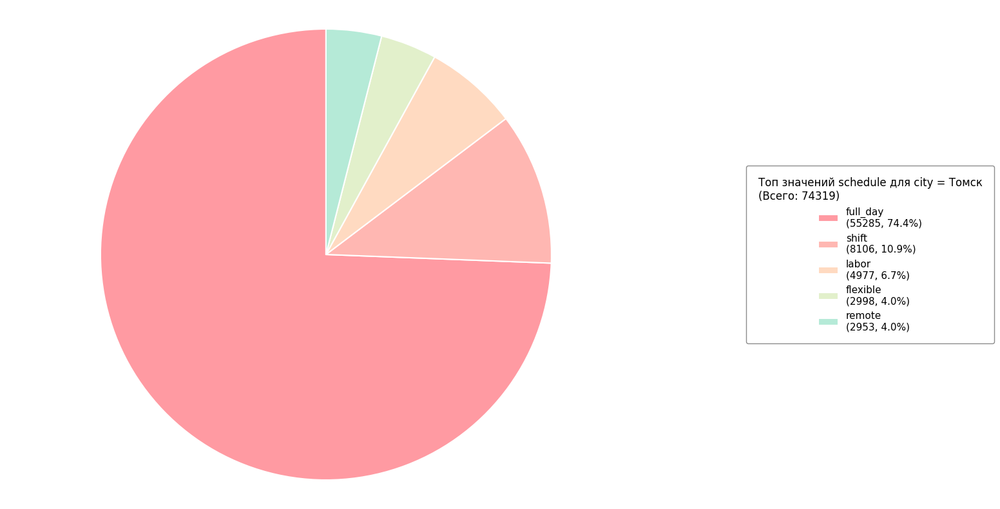

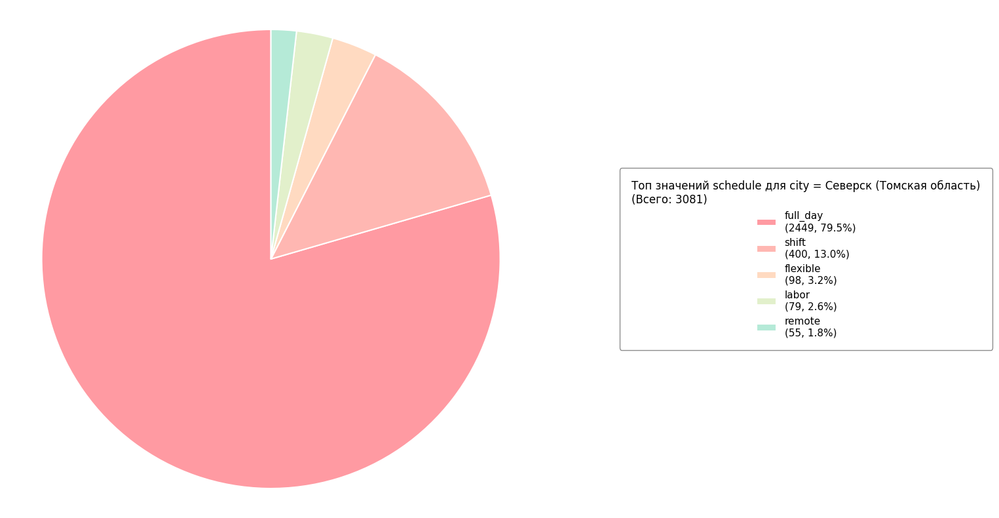

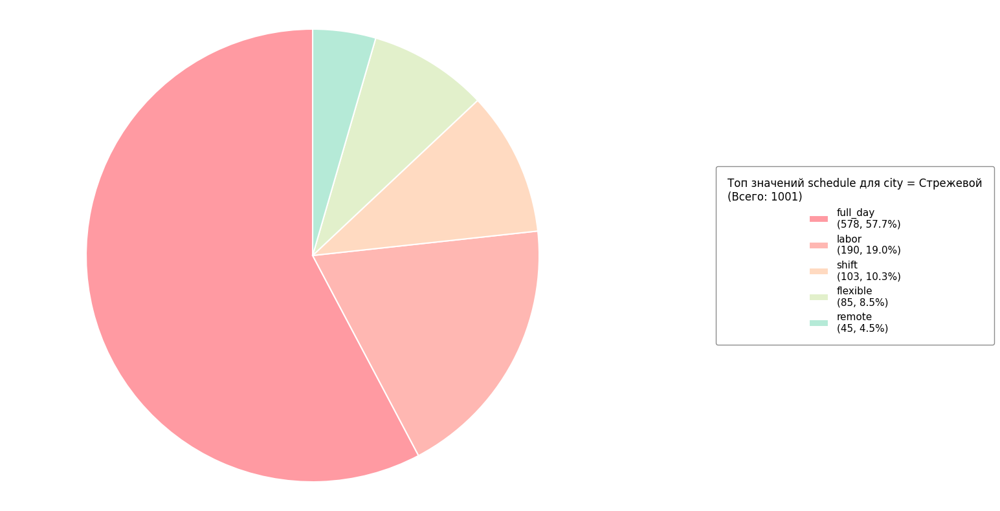

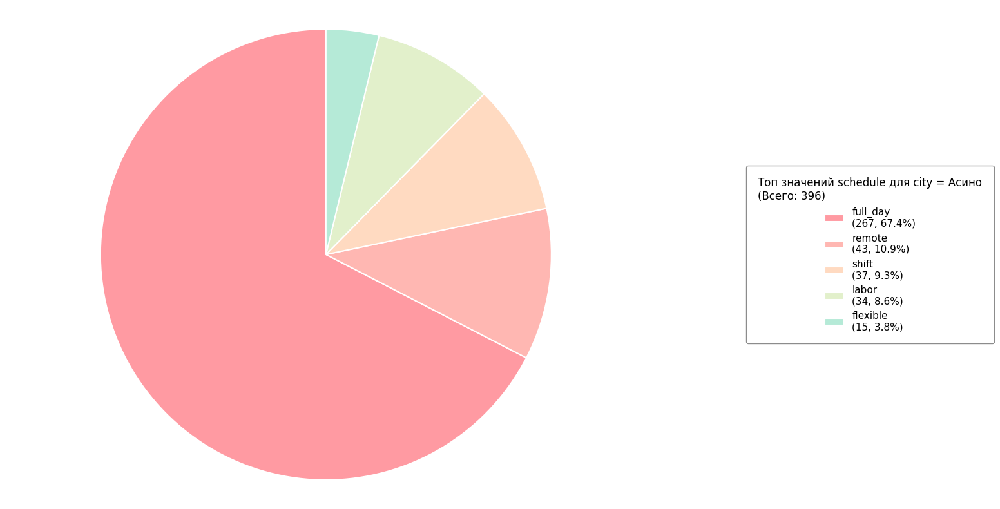

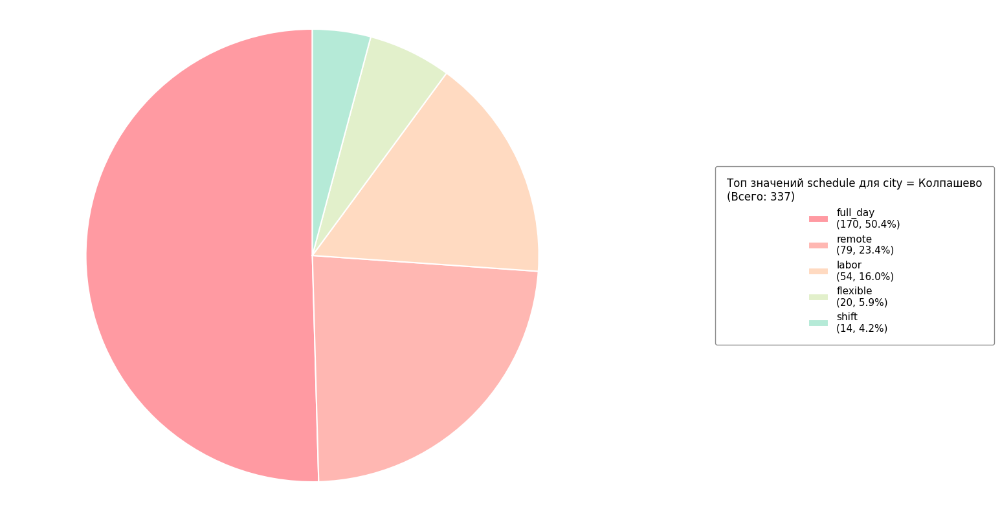

...

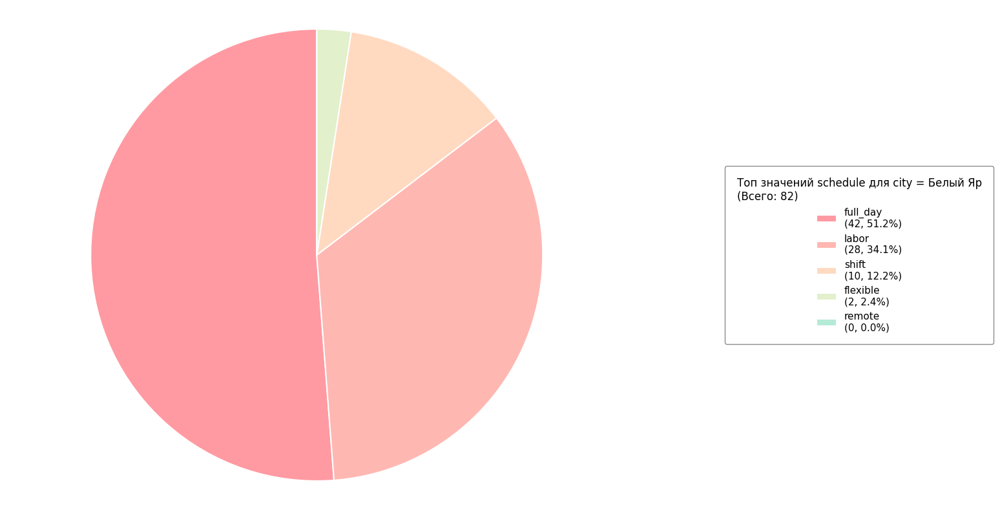

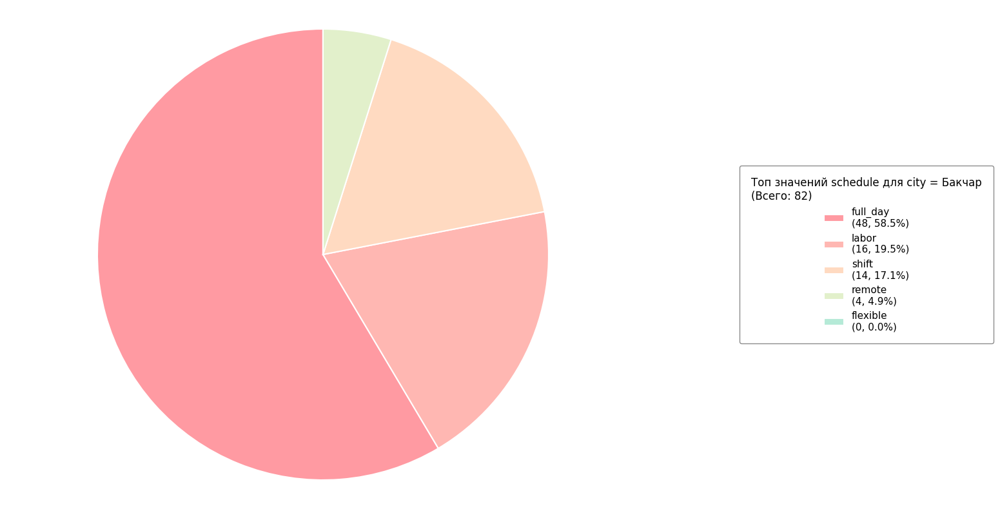

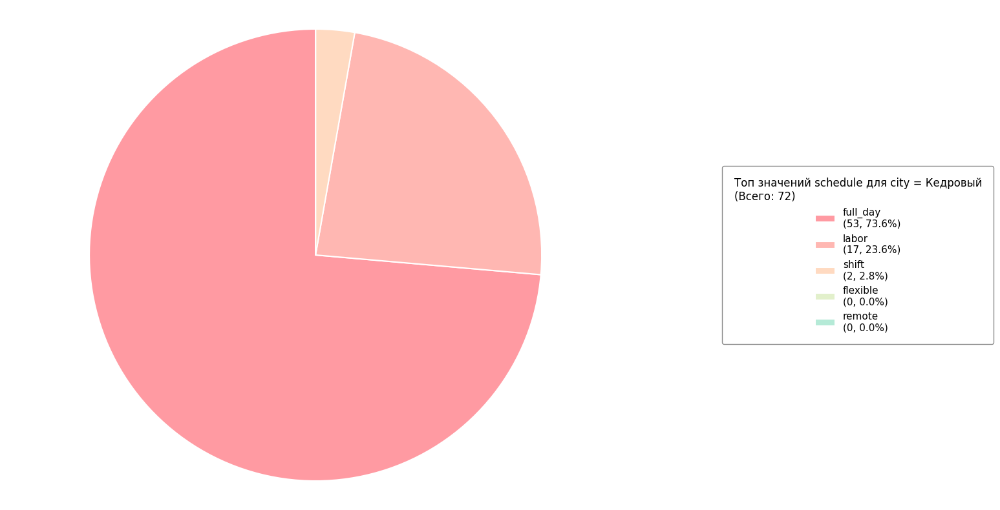

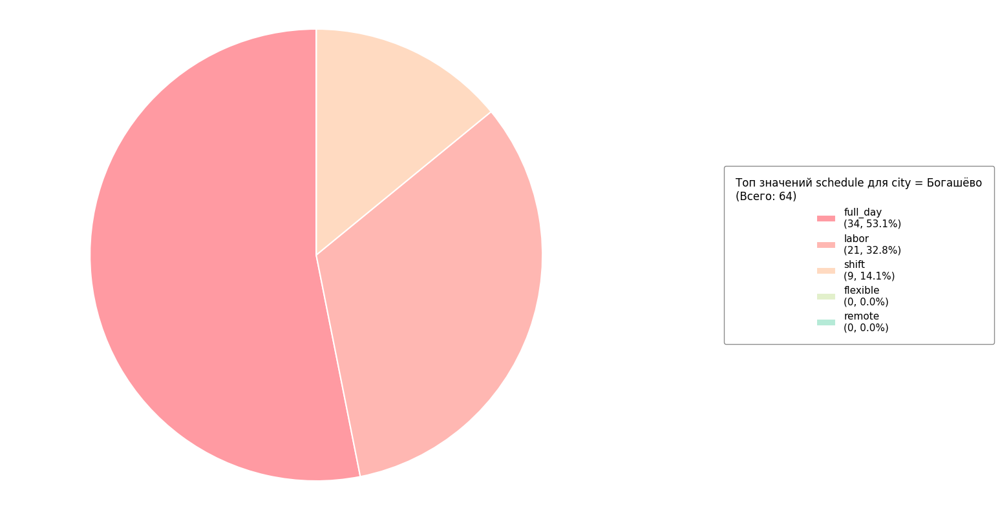

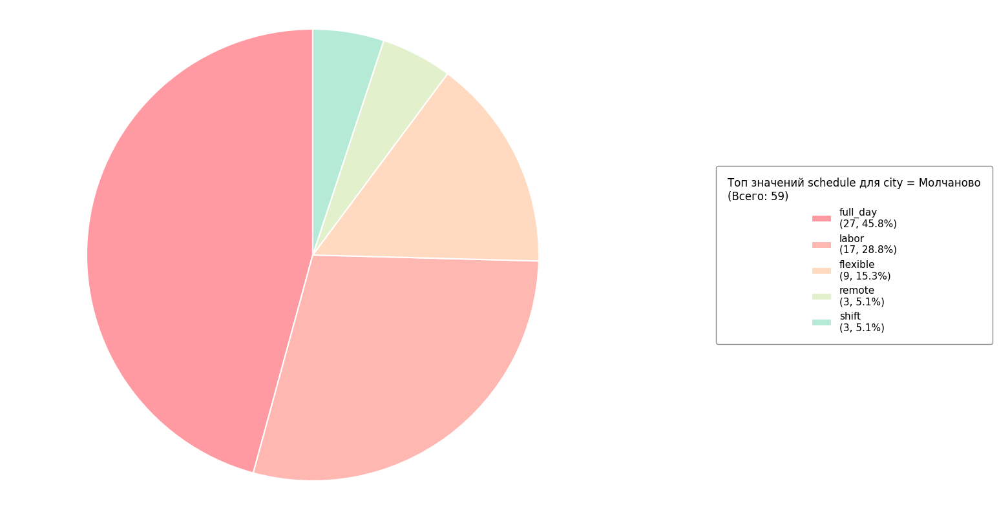

In [116]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [117]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

schedule,flexible,full_day,labor,remote,shift
city,,,,,
Александровское (Томская область),6,77,40,3,4
Асино,15,267,34,43,37
Бакчар,0,48,16,4,14
Батурино,0,5,8,0,0
Белый Яр,2,42,28,0,10
Богашёво,0,34,21,0,9
Зональная Станция,0,117,18,3,14
Зоркальцево,3,27,16,0,2
Зырянское,0,99,13,3,3


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [118]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 3424.669
p-value = 0.0
Степени свободы = 164


Оценим уровень связи коэффициентом Крамера

In [119]:
stats.contingency.association(contingency_table, method='cramer')

0.10254986185448241

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.1) показывает, что сила связи слабая

### 14.12 Признаки schedule и field_of_activity

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [120]:
columns = ('field_of_activity', 'schedule')

Посмотрим на уникальные значения первого признака

In [121]:
dataset[columns[0]].unique()

['Инженерия и строительство', 'Транспорт и логистика', 'Торговля и продажи', 'Сфера обслуживания', 'Производство и технические специальности', ..., 'Образование и наука', 'Аналитика и исследования', 'Туризм', 'Сельское хозяйство', 'Спорт и фитнес']
Length: 20
Categories (20, object): ['IT и технологии', 'Аналитика и исследования', 'Бытовые услуги',
                          'Другие сферы', ..., 'Туризм', 'Управление и администрирование',
                          'Финансы и бухгалтерия', 'Юриспруденция и безопасность']

Выведем их количество

In [122]:
dataset[columns[0]].unique().shape

(20,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [123]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
field_of_activity,
Торговля и продажи,15586
Инженерия и строительство,9292
Сфера обслуживания,7322
Другие сферы,7302
Управление и администрирование,5902
Транспорт и логистика,5860
Производство и технические специальности,5347
IT и технологии,4988
Финансы и бухгалтерия,4616


Посмотрим на уникальные значения второго признака

In [124]:
dataset[columns[1]].unique()

['full_day', 'shift', 'remote', 'labor', 'flexible']
Categories (5, object): ['flexible', 'full_day', 'labor', 'remote', 'shift']

Выведем их количество

In [125]:
dataset[columns[1]].unique().shape

(5,)

Для каждого значения первого признака построим круговые диаграммы

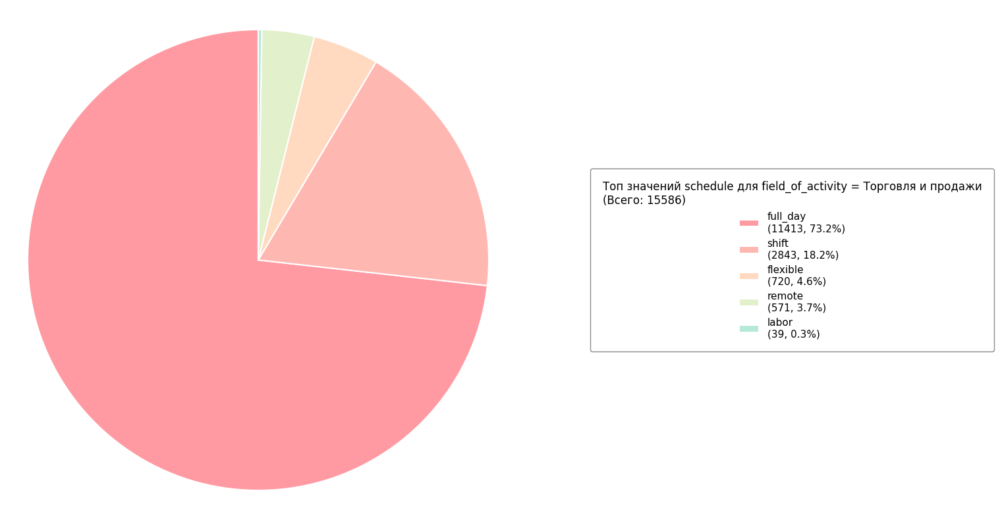

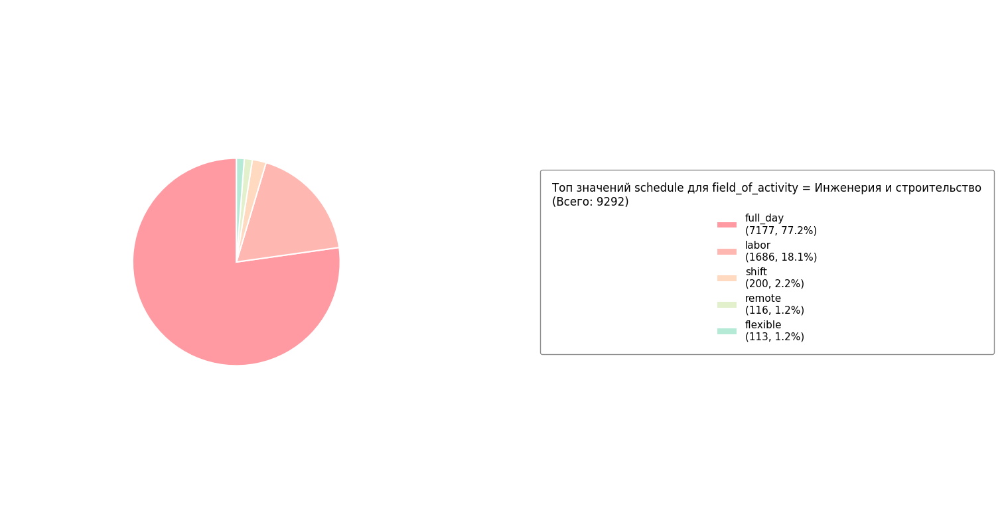

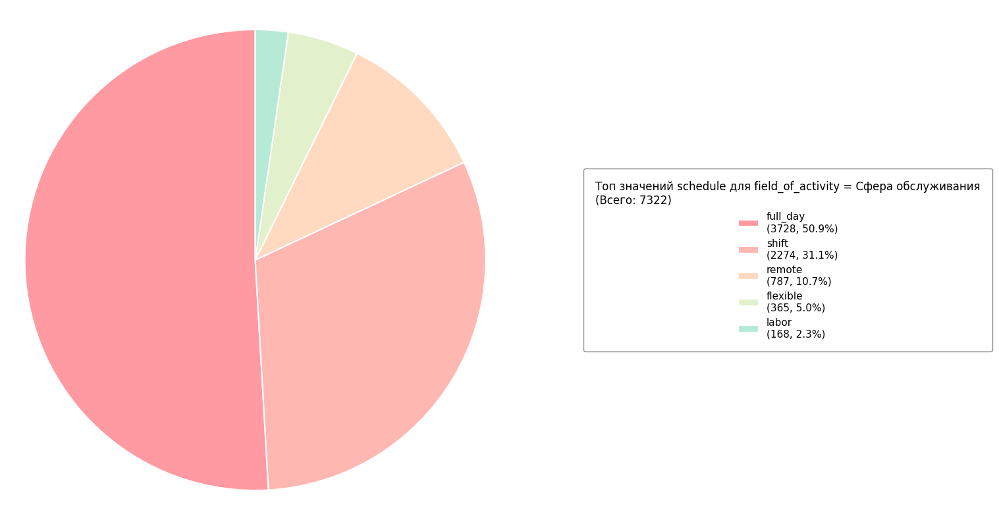

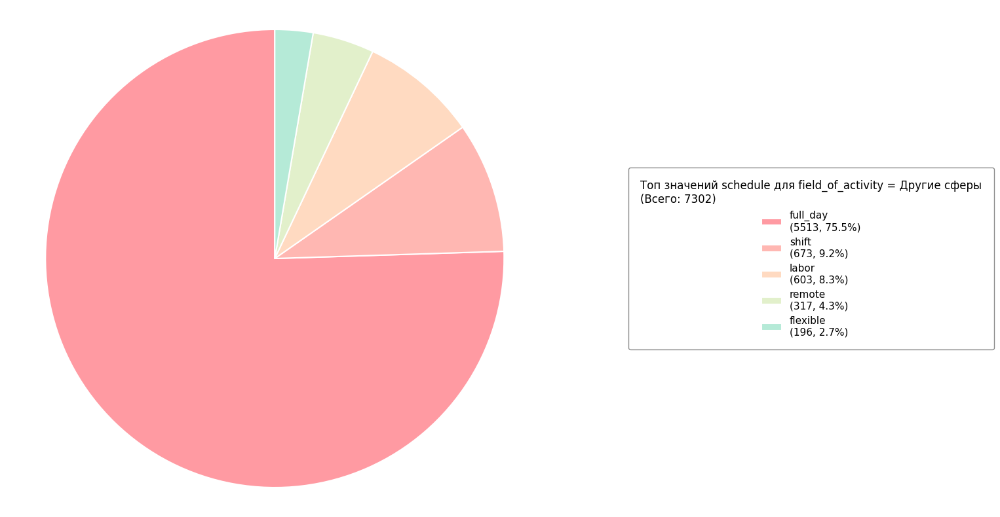

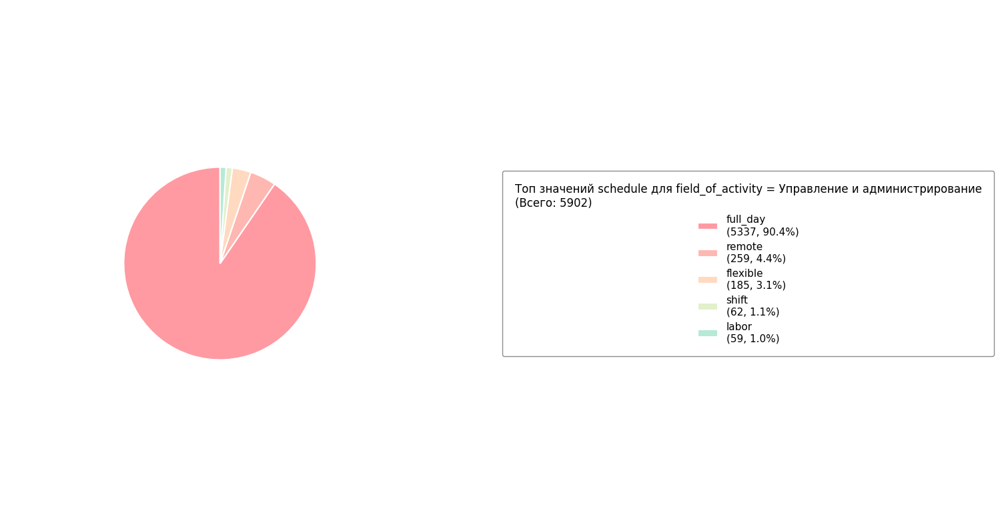

...

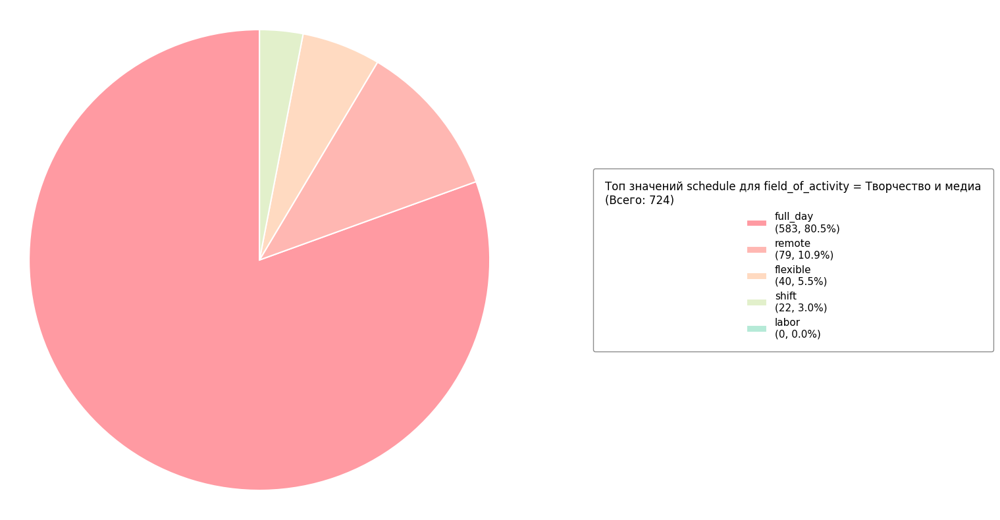

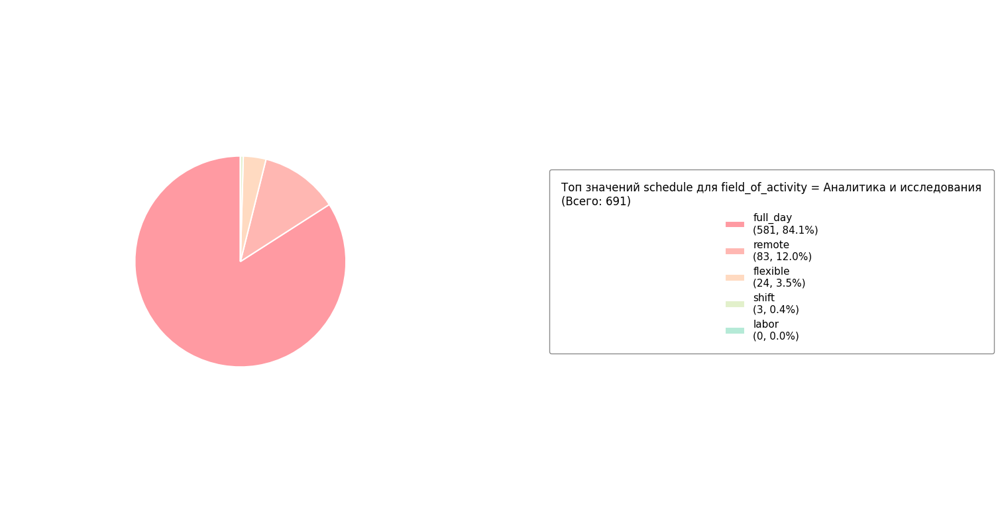

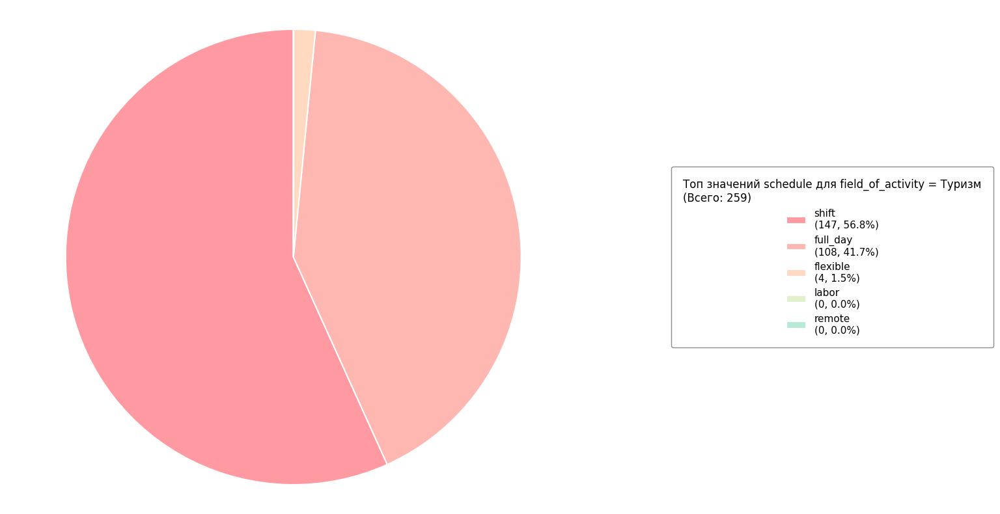

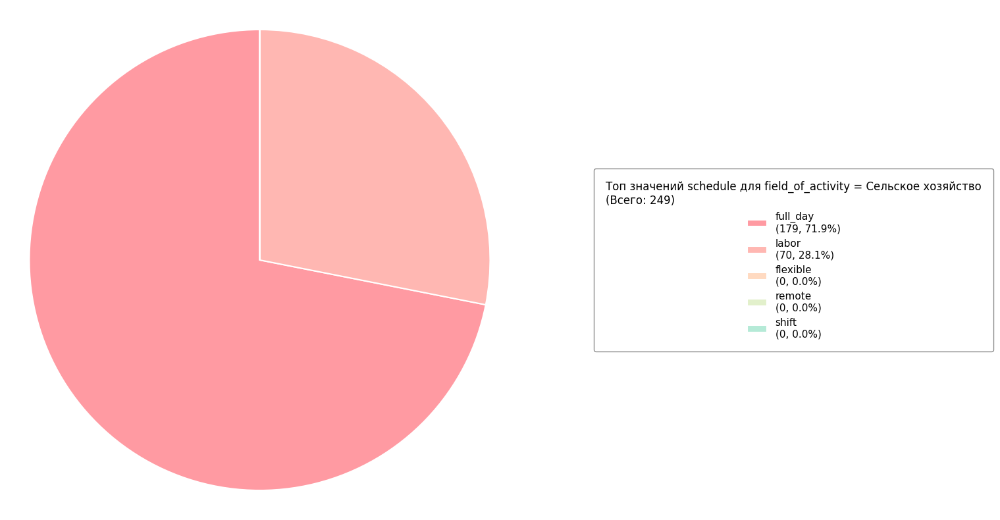

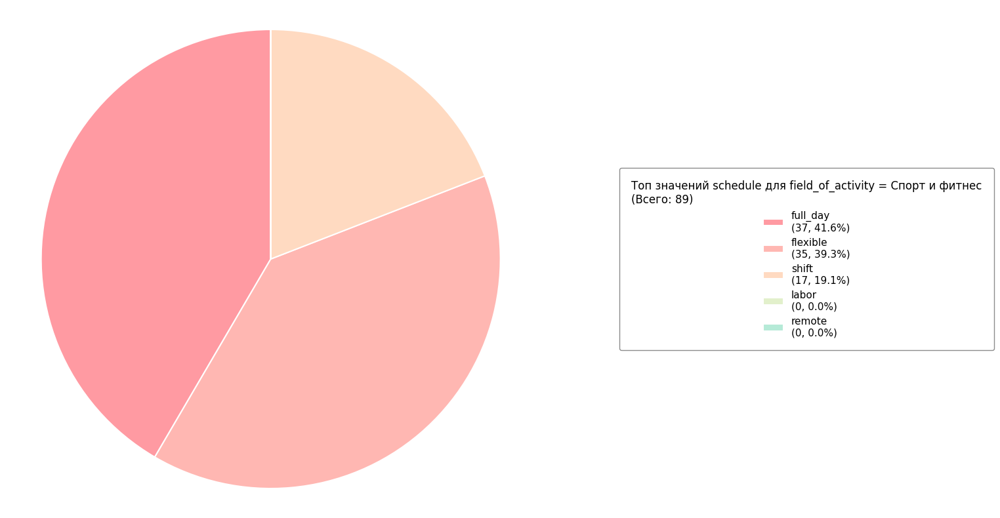

In [126]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [127]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

schedule,flexible,full_day,labor,remote,shift
field_of_activity,,,,,
IT и технологии,281,3941,11,663,92
Аналитика и исследования,24,581,0,83,3
Бытовые услуги,71,695,33,0,193
Другие сферы,196,5513,603,317,673
Инженерия и строительство,113,7177,1686,116,200
Маркетинг и реклама,164,1327,4,97,21
Медицина и фармацевтика,116,3011,20,15,571
Образование и наука,233,1633,42,97,91
Производство и технические специальности,40,3943,930,7,427


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [128]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 23584.023
p-value = 0.0
Степени свободы = 76


Оценим уровень связи коэффициентом Крамера

In [129]:
stats.contingency.association(contingency_table, method='cramer')

0.26911303523758495

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.269113) показывает, что сила связи слабая

### 14.13 Признаки employment и accept_handicapped

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [130]:
columns = ('employment', 'accept_handicapped')

Посмотрим на уникальные значения первого признака

In [131]:
dataset[columns[0]].unique()

['full', 'part', 'project', 'probation']
Categories (4, object): ['full', 'part', 'probation', 'project']

Выведем их количество

In [132]:
dataset[columns[0]].unique().shape

(4,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [133]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
employment,
full,75885
part,4611
probation,622
project,294


Посмотрим на уникальные значения второго признака

In [134]:
dataset[columns[1]].unique()

['0', '1']
Categories (2, object): ['0', '1']

Выведем их количество

In [135]:
dataset[columns[1]].unique().shape

(2,)

Для каждого значения первого признака построим круговые диаграммы

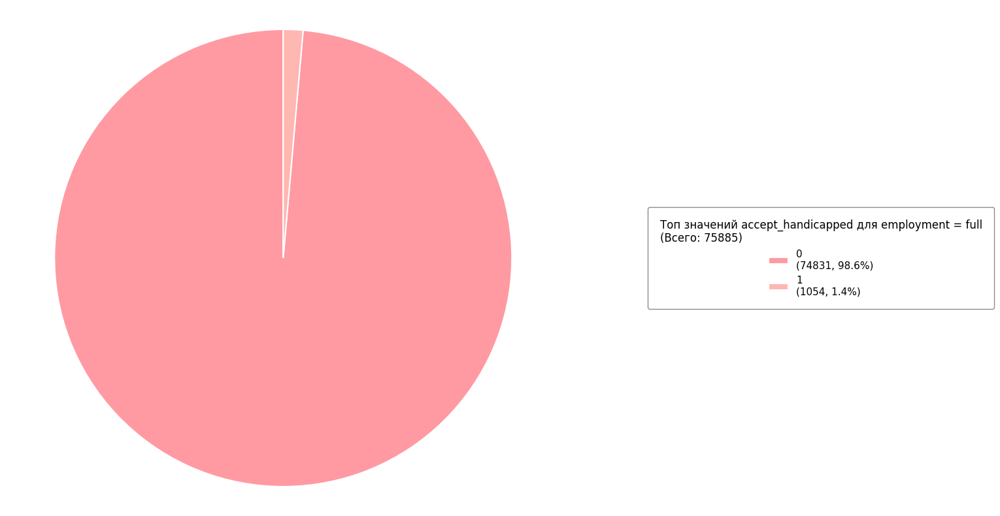

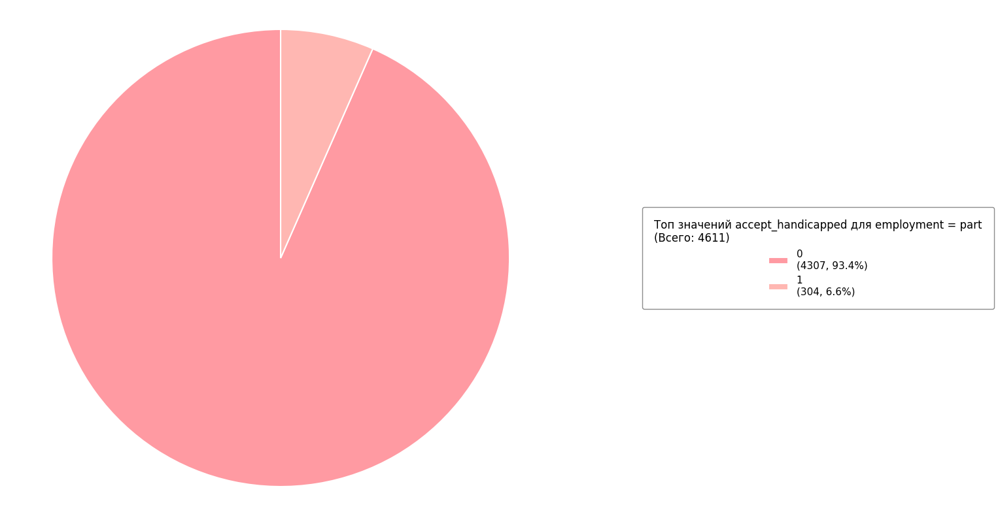

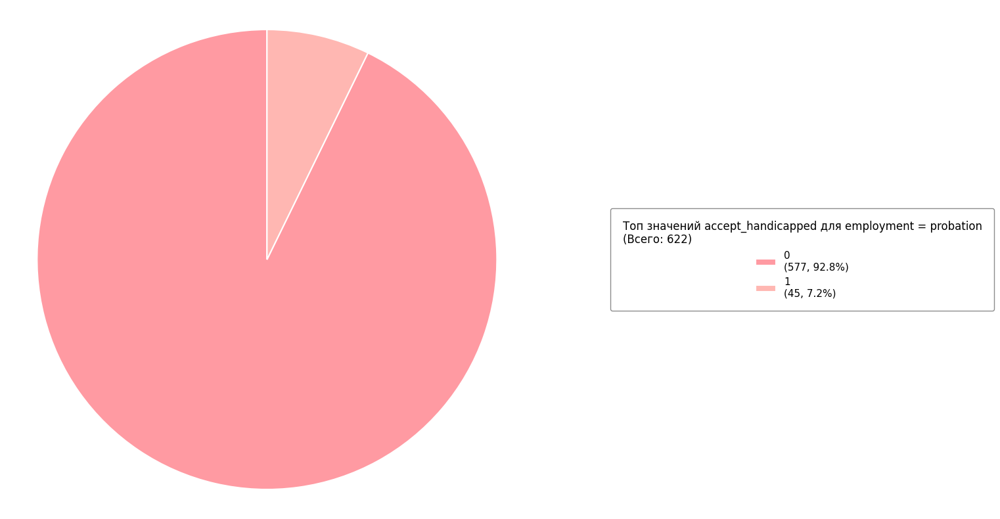

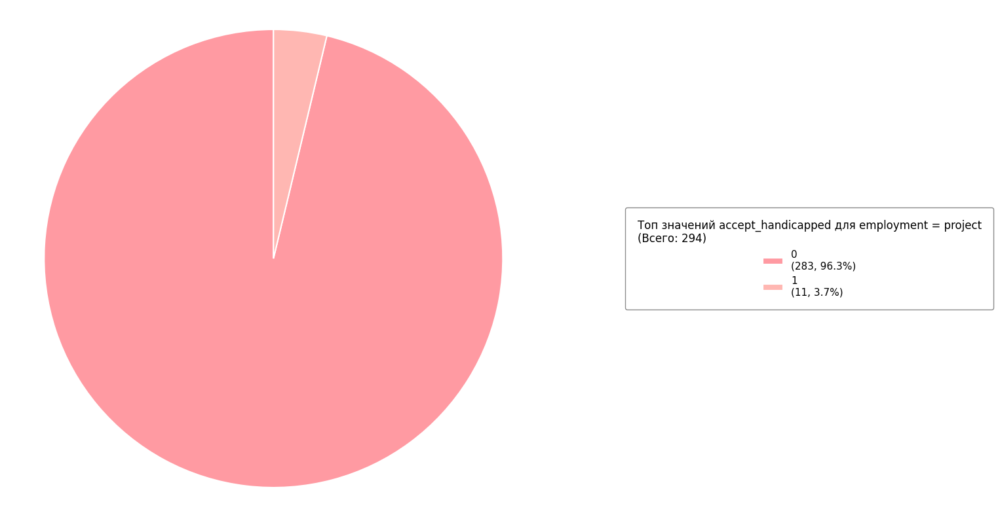

In [136]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [137]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

accept_handicapped,0,1
employment,,
full,74831,1054
part,4307,304
probation,577,45
project,283,11


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [138]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 808.013
p-value = 7.914147398080724e-175
Степени свободы = 3


Оценим уровень связи коэффициентом Крамера

In [139]:
stats.contingency.association(contingency_table, method='cramer')

0.09962422299911035

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.09962) показывает, что связь незначительна

### 14.14 Признаки employment и city

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [140]:
columns = ('city', 'employment')

Посмотрим на уникальные значения первого признака

In [141]:
dataset[columns[0]].unique()

<StringArray>
[                            'Томск',                          'Могочино',
                           'Каргала',    'Первомайское (Томская область)',
                           'Чажемто',                            'Самусь',
                         'Колпашево',                          'Рыбалово',
                            'Парбиг',                          'Копылово',
                            'Курлек',                          'Кедровый',
                        'Кривошеино',                          'Кисловка',
                            'Бакчар',                          'Богашёво',
         'Северск (Томская область)',         'Светлый (Томская область)',
                         'Стрежевой',                          'Белый Яр',
                         'Молчаново',                         'Подгорное',
                        'Мельниково',                             'Асино',
                          'Каргасок',                         'Тегульдет',
           

Выведем их количество

In [142]:
dataset[columns[0]].unique().shape

(42,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [143]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
city,
Томск,74319
Северск (Томская область),3081
Стрежевой,1001
Асино,396
Колпашево,337
Первомайское (Томская область),181
Зональная Станция,152
Светлый (Томская область),150
Парабель,136


Посмотрим на уникальные значения второго признака

In [144]:
dataset[columns[1]].unique()

['full', 'part', 'project', 'probation']
Categories (4, object): ['full', 'part', 'probation', 'project']

Выведем их количество

In [145]:
dataset[columns[1]].unique().shape

(4,)

Для каждого значения первого признака построим круговые диаграммы

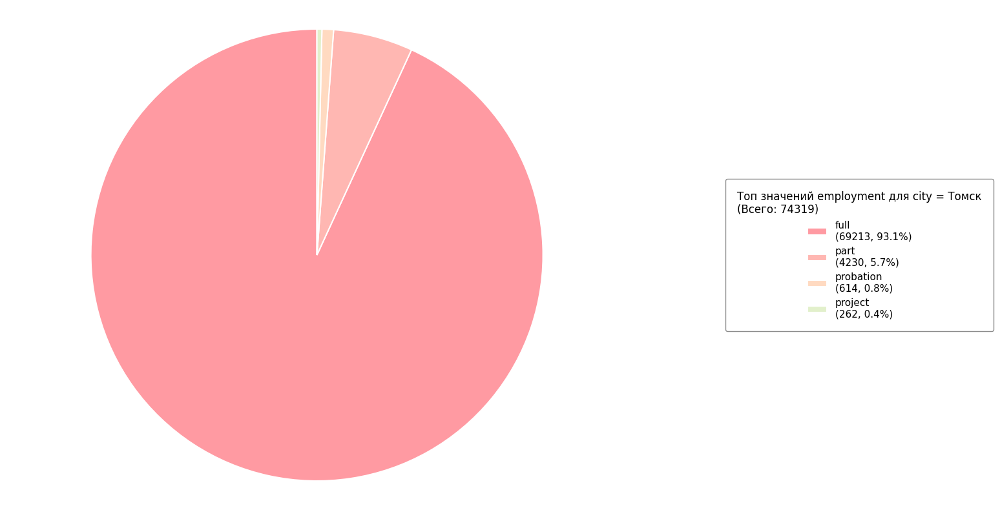

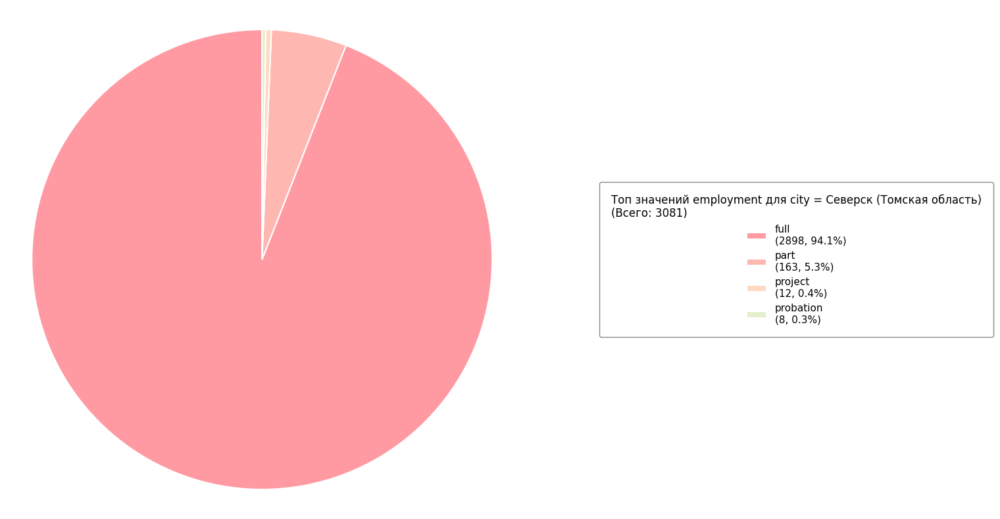

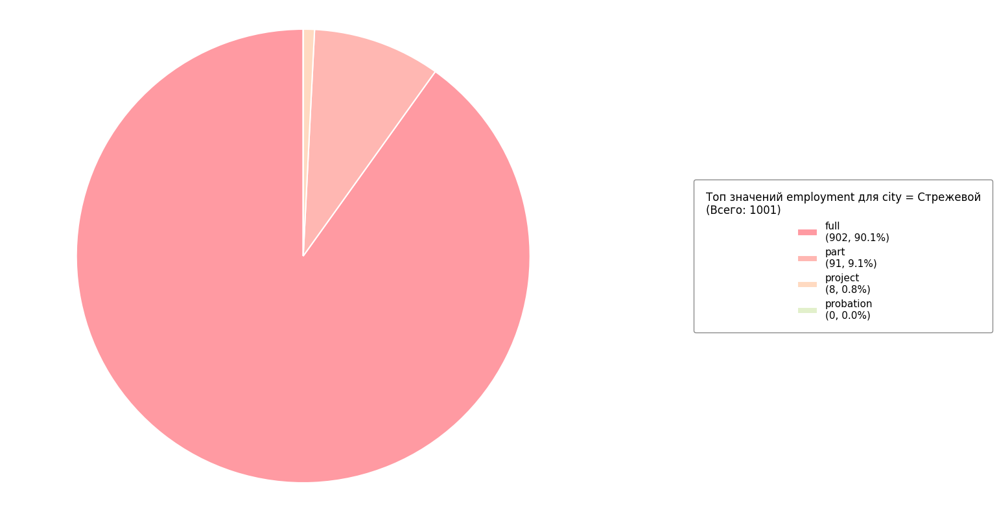

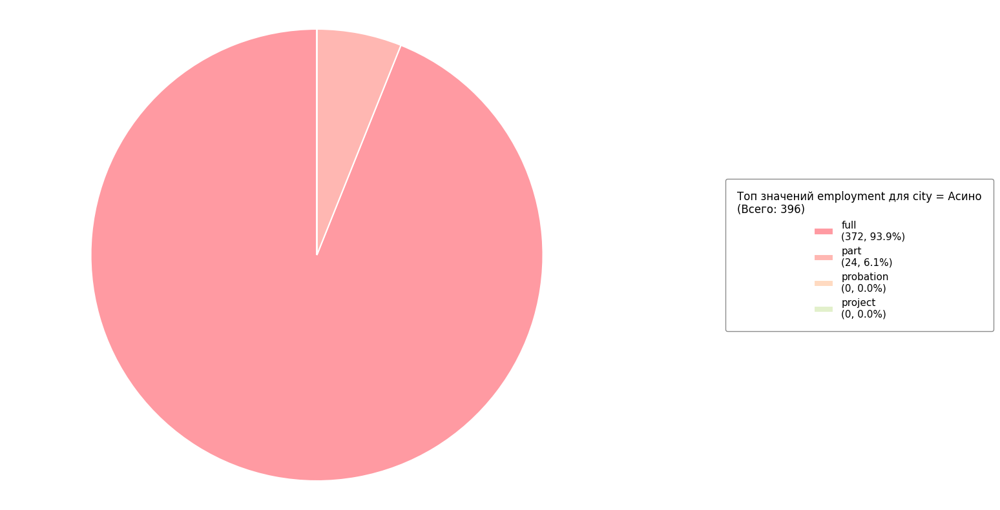

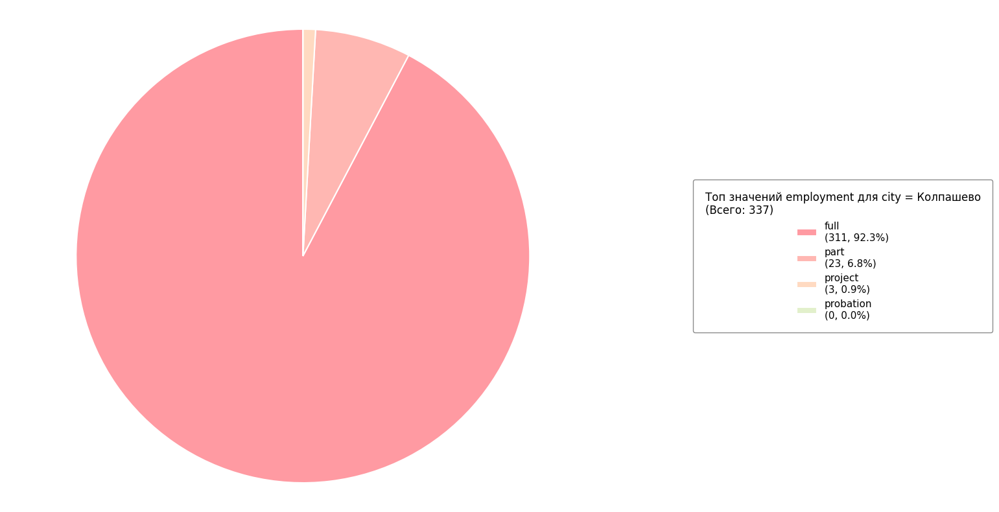

...

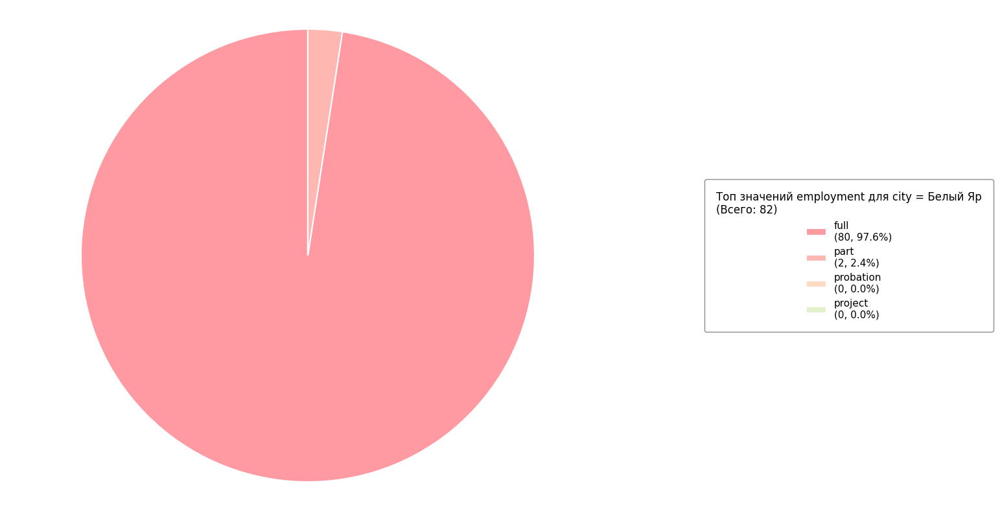

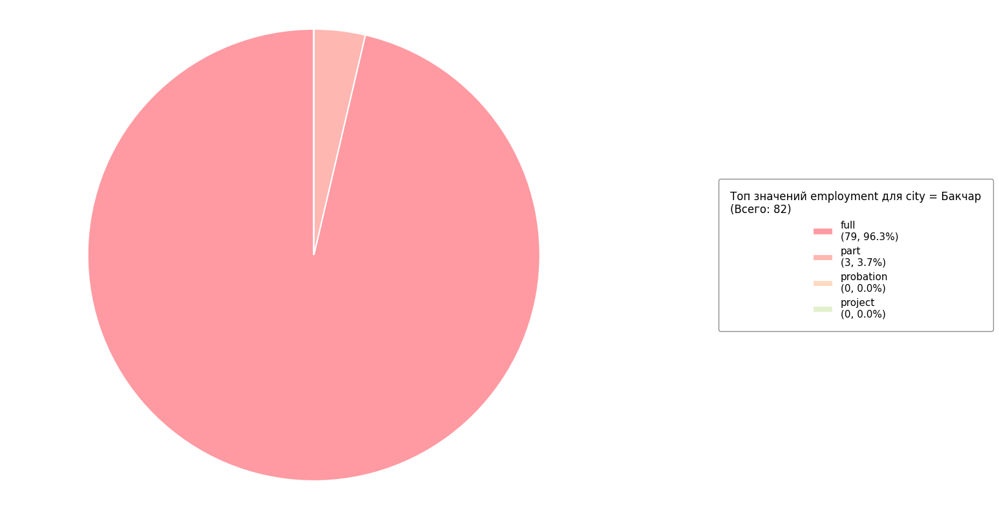

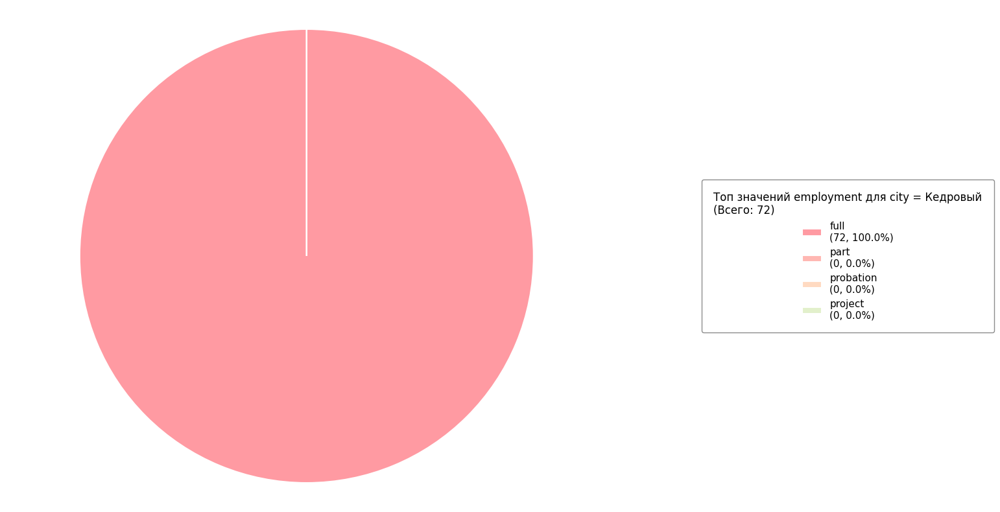

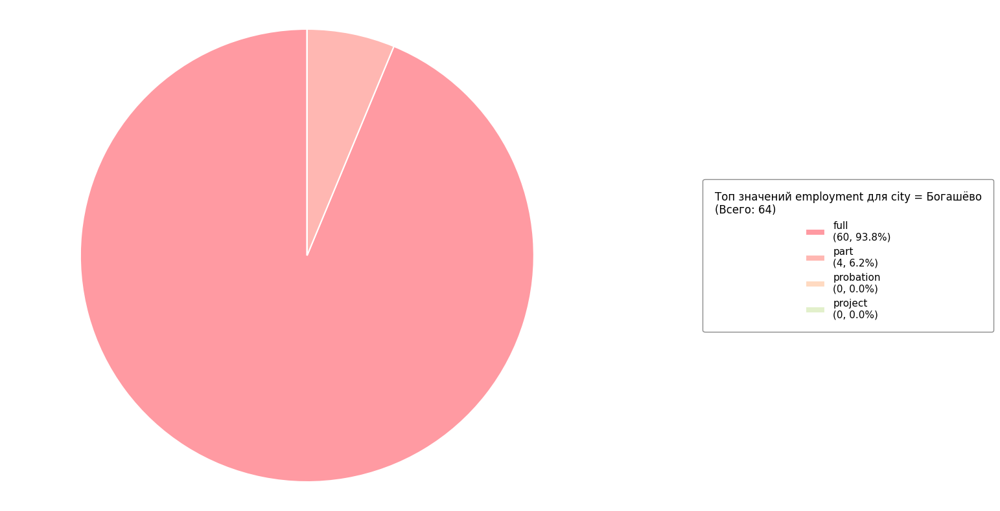

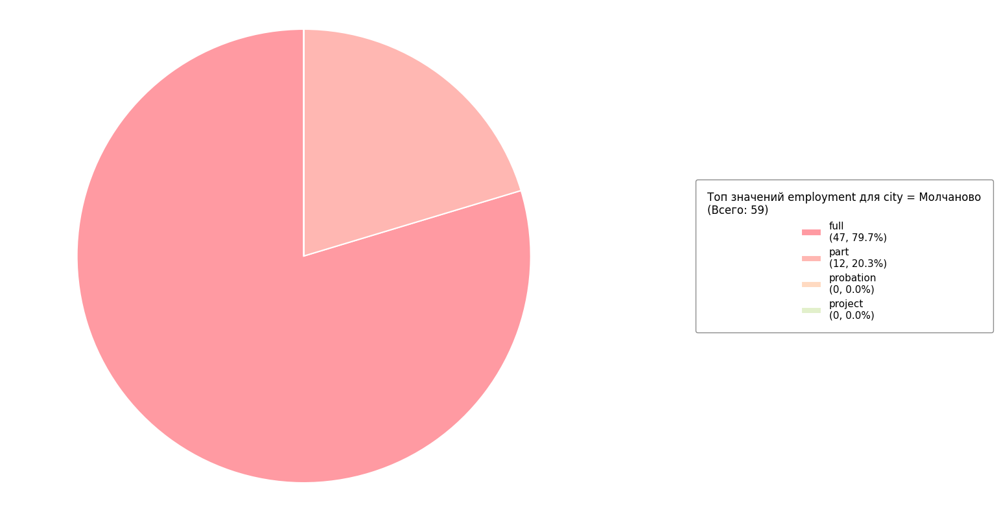

In [146]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [147]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

employment,full,part,probation,project
city,,,,
Александровское (Томская область),121,9,0,0
Асино,372,24,0,0
Бакчар,79,3,0,0
Батурино,13,0,0,0
Белый Яр,80,2,0,0
Богашёво,60,4,0,0
Зональная Станция,145,7,0,0
Зоркальцево,45,0,0,3
Зырянское,112,6,0,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [148]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 311.054
p-value = 2.8768182176477253e-18
Степени свободы = 123


Оценим уровень связи коэффициентом Крамера

In [149]:
stats.contingency.association(contingency_table, method='cramer')

0.03568725759013771

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.03568) показывает, что сила связи слабая

    - Возможно из-за разрежённости матрицы результат не точен

### 14.15 Признаки employment и field_of_activity

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [150]:
columns = ('employment', 'field_of_activity')

Посмотрим на уникальные значения первого признака

In [151]:
dataset[columns[0]].unique()

['full', 'part', 'project', 'probation']
Categories (4, object): ['full', 'part', 'probation', 'project']

Выведем их количество

In [152]:
dataset[columns[0]].unique().shape

(4,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [153]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
employment,
full,75885
part,4611
probation,622
project,294


Посмотрим на уникальные значения второго признака

In [154]:
dataset[columns[1]].unique()

['Инженерия и строительство', 'Транспорт и логистика', 'Торговля и продажи', 'Сфера обслуживания', 'Производство и технические специальности', ..., 'Образование и наука', 'Аналитика и исследования', 'Туризм', 'Сельское хозяйство', 'Спорт и фитнес']
Length: 20
Categories (20, object): ['IT и технологии', 'Аналитика и исследования', 'Бытовые услуги',
                          'Другие сферы', ..., 'Туризм', 'Управление и администрирование',
                          'Финансы и бухгалтерия', 'Юриспруденция и безопасность']

Выведем их количество

In [155]:
dataset[columns[1]].unique().shape

(20,)

Для каждого значения первого признака построим круговые диаграммы

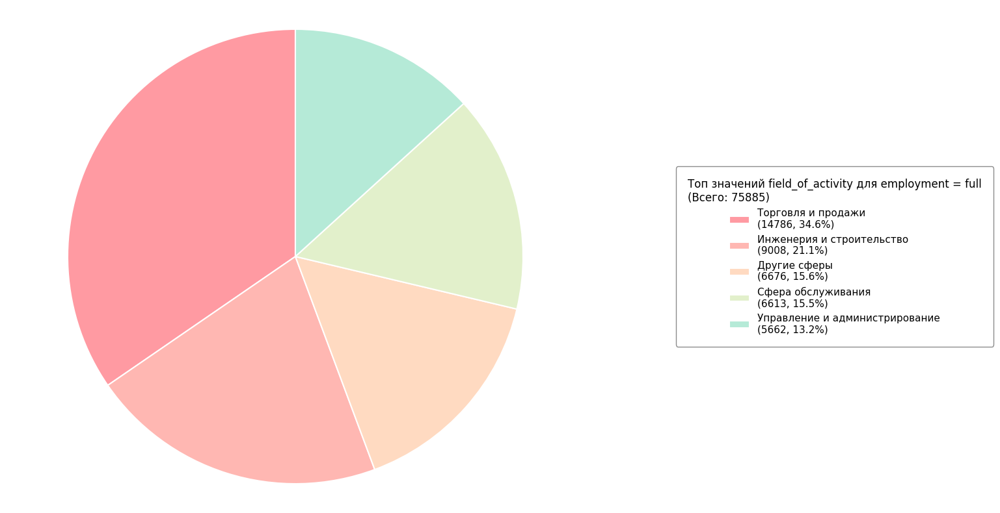

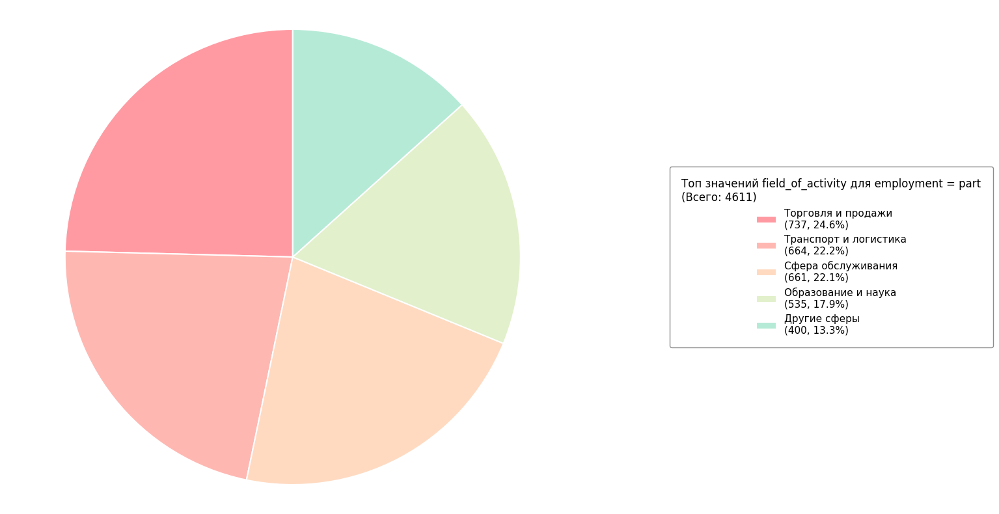

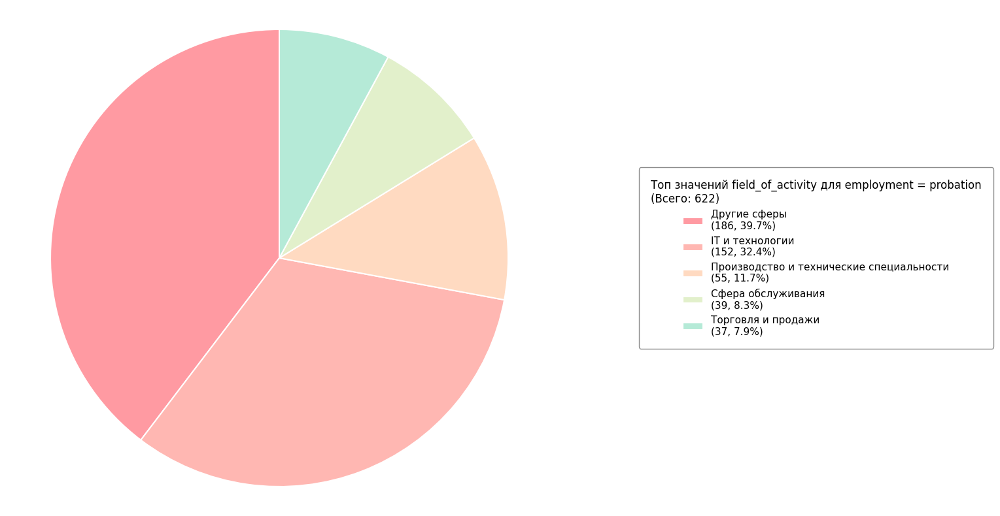

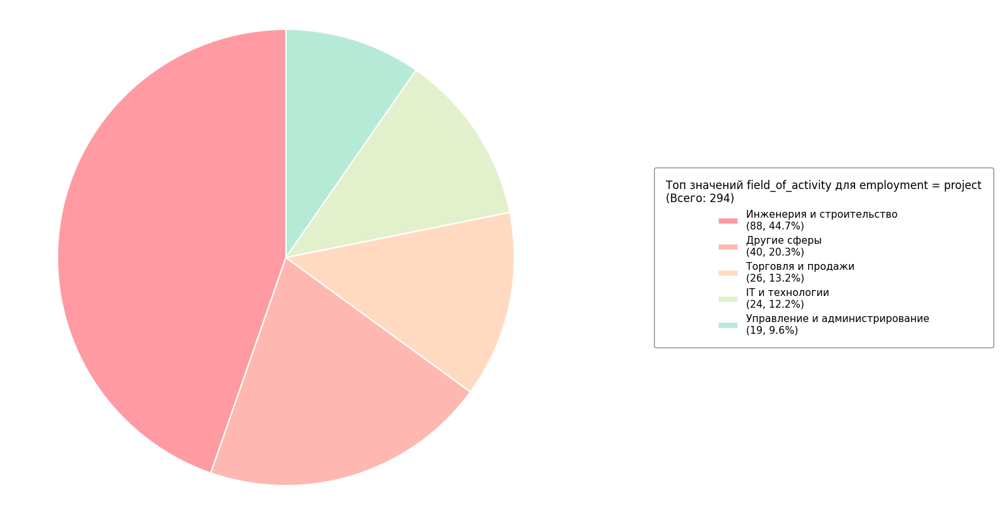

In [156]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [157]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

field_of_activity,IT и технологии,Аналитика и исследования,Бытовые услуги,Другие сферы,Инженерия и строительство,Маркетинг и реклама,Медицина и фармацевтика,Образование и наука,Производство и технические специальности,Сельское хозяйство,Склад и грузоперевозки,Спорт и фитнес,Сфера обслуживания,Творчество и медиа,Торговля и продажи,Транспорт и логистика,Туризм,Управление и администрирование,Финансы и бухгалтерия,Юриспруденция и безопасность
employment,,,,,,,,,,,,,,,,,,,,
full,4734,644,808,6676,9008,1415,3469,1547,5202,232,3172,47,6613,643,14786,5178,241,5662,4504,1304
part,78,11,182,400,160,172,253,535,75,6,147,42,661,79,737,664,18,211,76,104
probation,152,24,2,186,36,13,0,14,55,7,13,0,39,0,37,1,0,10,33,0
project,24,12,0,40,88,13,11,0,15,4,11,0,9,2,26,17,0,19,3,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [158]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 4763.122
p-value = 0.0
Степени свободы = 57


Оценим уровень связи коэффициентом Крамера

In [159]:
stats.contingency.association(contingency_table, method='cramer')

0.13965002995259443

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.13965) показывает, что сила связи слабая

### 14.16 Признаки accept_handicapped и city

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [160]:
columns = ('city', 'accept_handicapped')

Посмотрим на уникальные значения первого признака

In [161]:
dataset[columns[0]].unique()

<StringArray>
[                            'Томск',                          'Могочино',
                           'Каргала',    'Первомайское (Томская область)',
                           'Чажемто',                            'Самусь',
                         'Колпашево',                          'Рыбалово',
                            'Парбиг',                          'Копылово',
                            'Курлек',                          'Кедровый',
                        'Кривошеино',                          'Кисловка',
                            'Бакчар',                          'Богашёво',
         'Северск (Томская область)',         'Светлый (Томская область)',
                         'Стрежевой',                          'Белый Яр',
                         'Молчаново',                         'Подгорное',
                        'Мельниково',                             'Асино',
                          'Каргасок',                         'Тегульдет',
           

Выведем их количество

In [162]:
dataset[columns[0]].unique().shape

(42,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [163]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
city,
Томск,74319
Северск (Томская область),3081
Стрежевой,1001
Асино,396
Колпашево,337
Первомайское (Томская область),181
Зональная Станция,152
Светлый (Томская область),150
Парабель,136


Посмотрим на уникальные значения второго признака

In [164]:
dataset[columns[1]].unique()

['0', '1']
Categories (2, object): ['0', '1']

Выведем их количество

In [165]:
dataset[columns[1]].unique().shape

(2,)

Для каждого значения первого признака построим круговые диаграммы

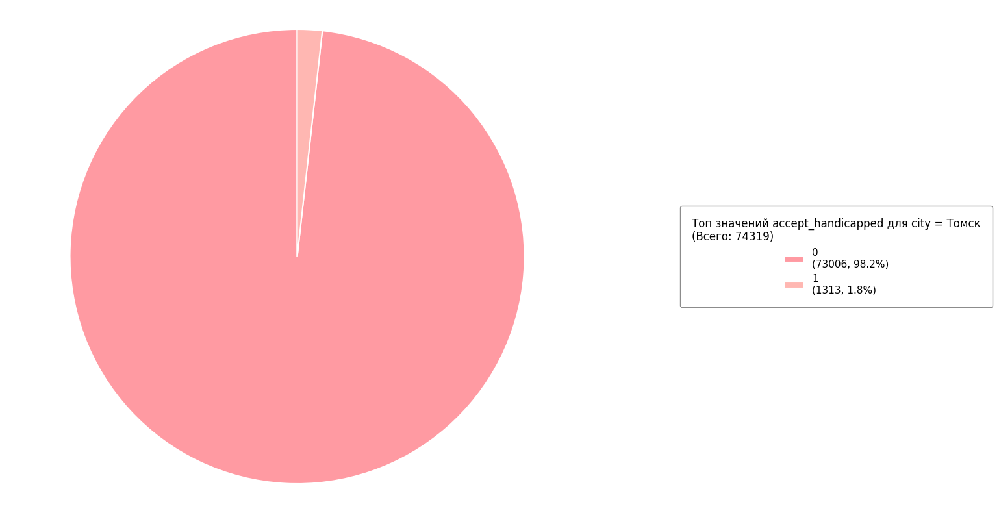

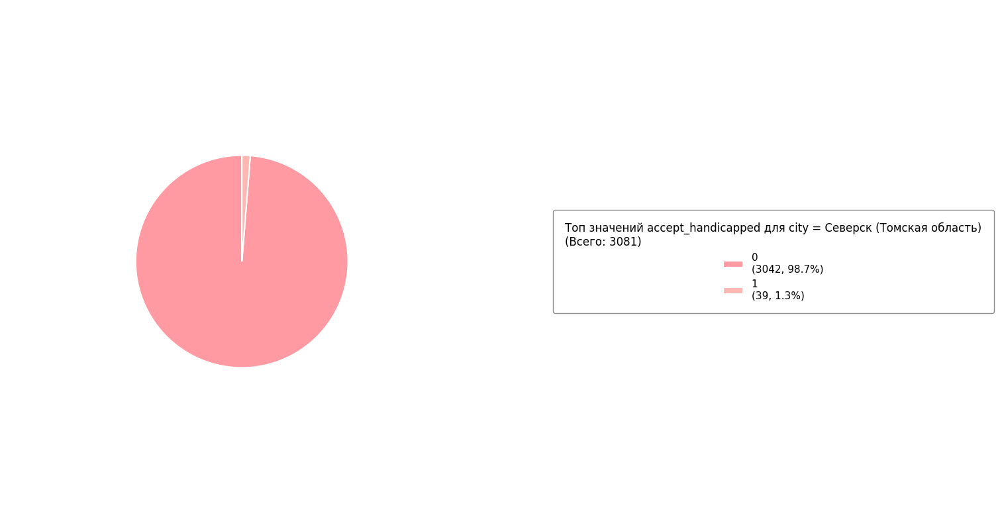

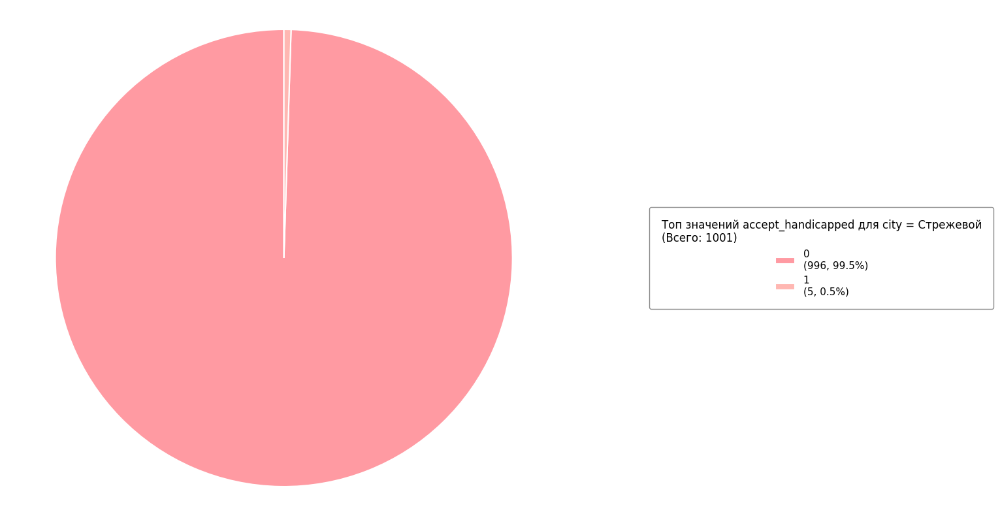

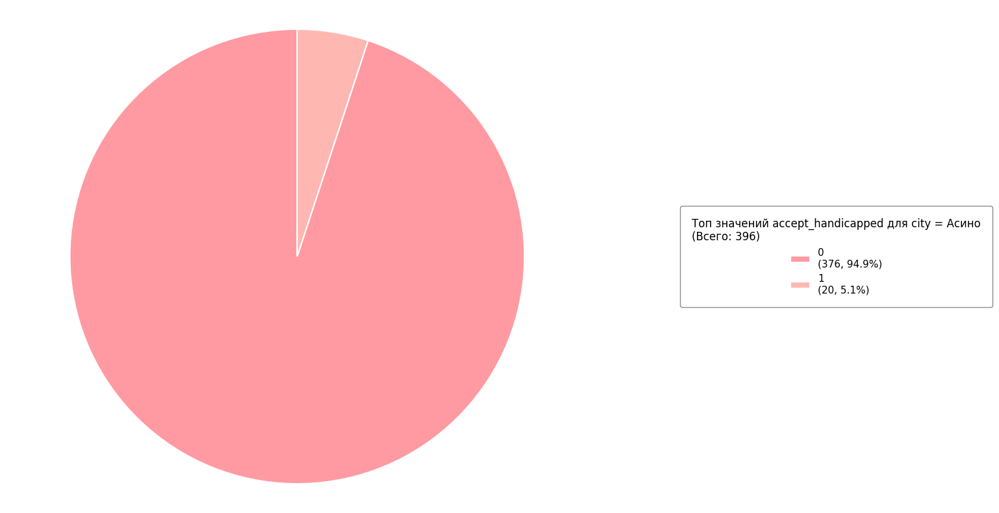

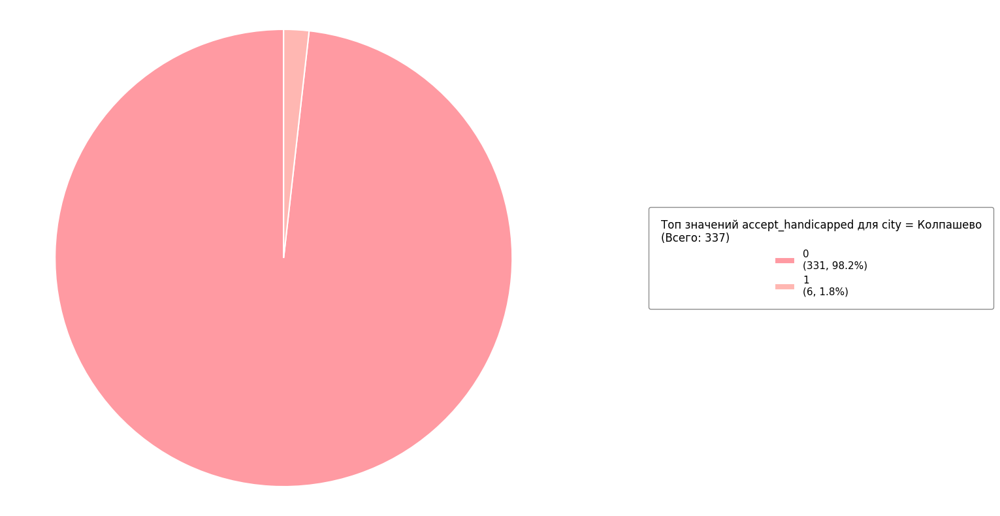

...

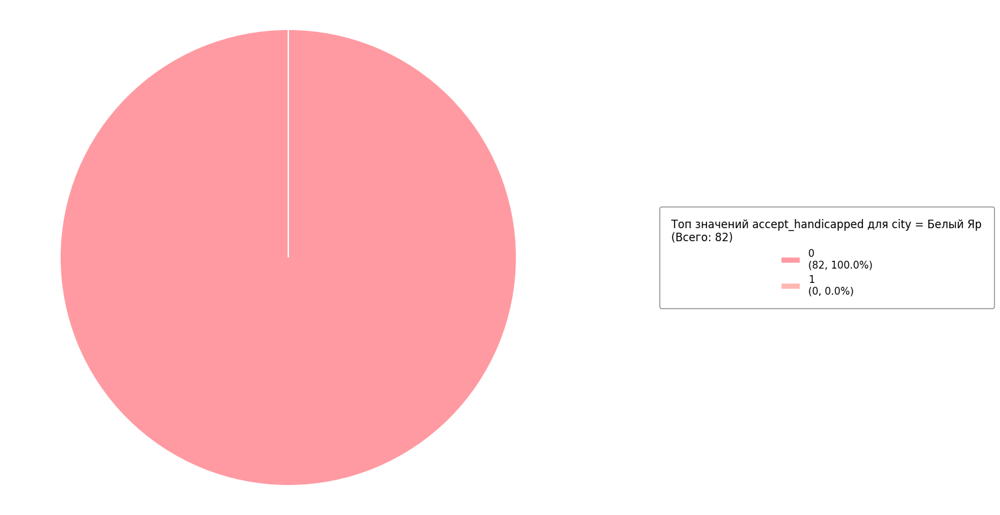

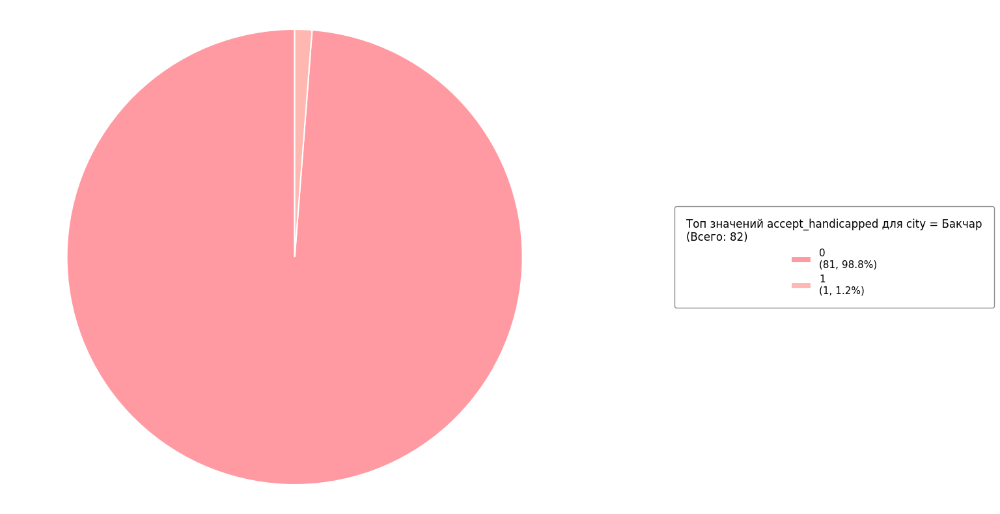

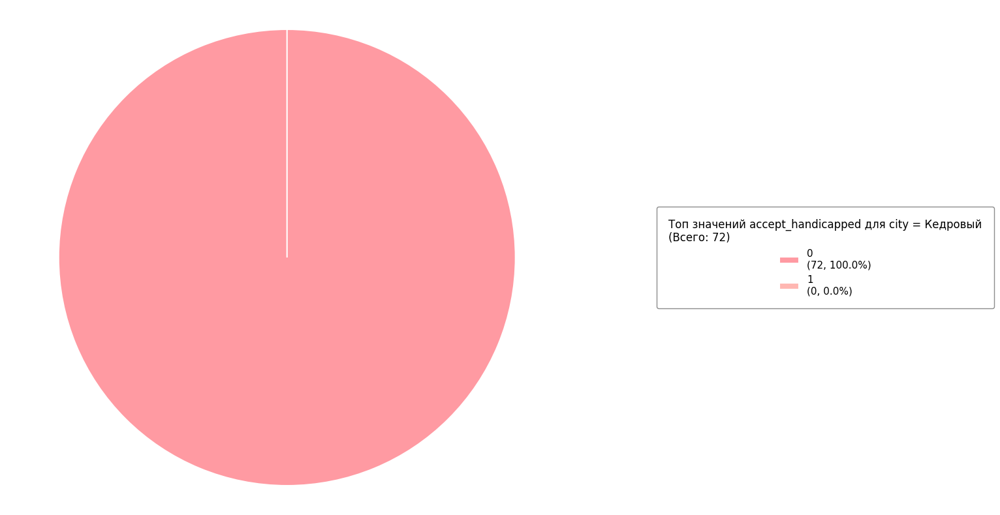

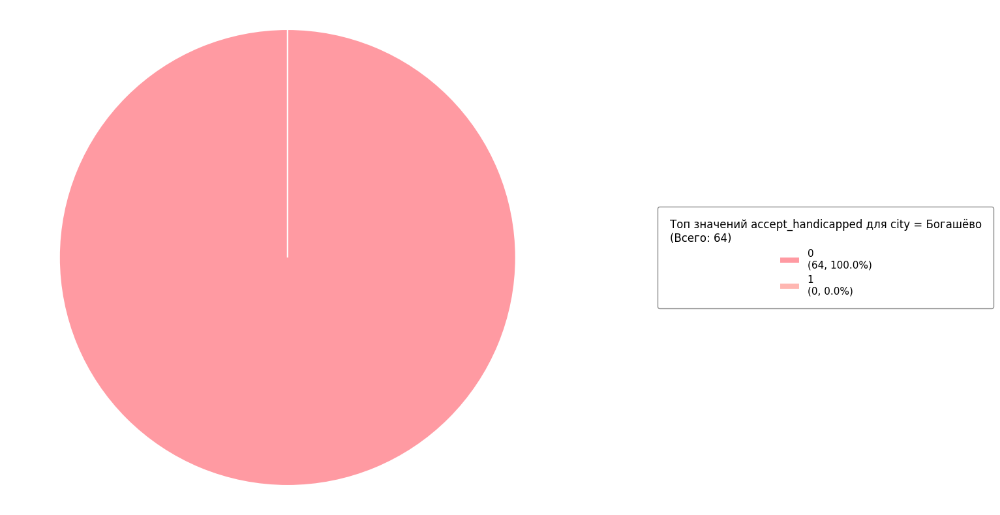

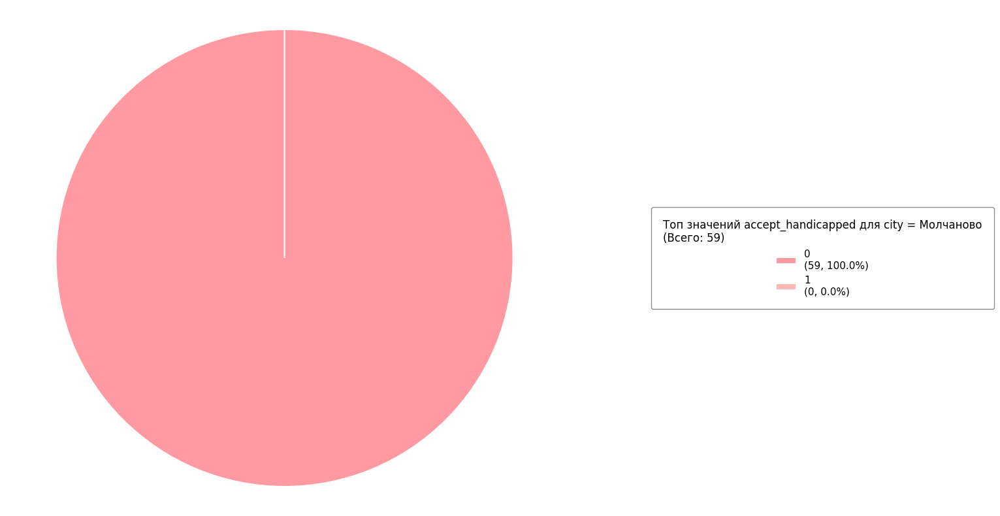

In [166]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [167]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

accept_handicapped,0,1
city,,
Александровское (Томская область),115,15
Асино,376,20
Бакчар,81,1
Батурино,13,0
Белый Яр,82,0
Богашёво,64,0
Зональная Станция,152,0
Зоркальцево,48,0
Зырянское,118,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [168]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 206.040
p-value = 7.380420315707487e-24
Степени свободы = 41


Оценим уровень связи коэффициентом Крамера

In [169]:
stats.contingency.association(contingency_table, method='cramer')

0.05030731435621056

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.05) показывает, что связь незначительна

### 14.17 Признаки accept_handicapped и field_of_activity

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [170]:
columns = ('field_of_activity', 'accept_handicapped')

Посмотрим на уникальные значения первого признака

In [171]:
dataset[columns[0]].unique()

['Инженерия и строительство', 'Транспорт и логистика', 'Торговля и продажи', 'Сфера обслуживания', 'Производство и технические специальности', ..., 'Образование и наука', 'Аналитика и исследования', 'Туризм', 'Сельское хозяйство', 'Спорт и фитнес']
Length: 20
Categories (20, object): ['IT и технологии', 'Аналитика и исследования', 'Бытовые услуги',
                          'Другие сферы', ..., 'Туризм', 'Управление и администрирование',
                          'Финансы и бухгалтерия', 'Юриспруденция и безопасность']

Выведем их количество

In [172]:
dataset[columns[0]].unique().shape

(20,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [173]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
field_of_activity,
Торговля и продажи,15586
Инженерия и строительство,9292
Сфера обслуживания,7322
Другие сферы,7302
Управление и администрирование,5902
Транспорт и логистика,5860
Производство и технические специальности,5347
IT и технологии,4988
Финансы и бухгалтерия,4616


Посмотрим на уникальные значения второго признака

In [174]:
dataset[columns[1]].unique()

['0', '1']
Categories (2, object): ['0', '1']

Выведем их количество

In [175]:
dataset[columns[1]].unique().shape

(2,)

Для каждого значения первого признака построим круговые диаграммы

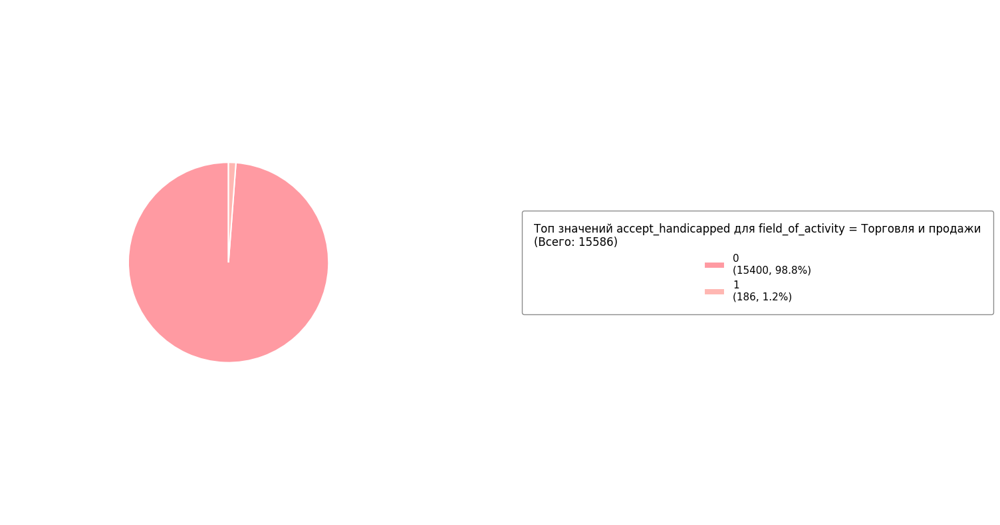

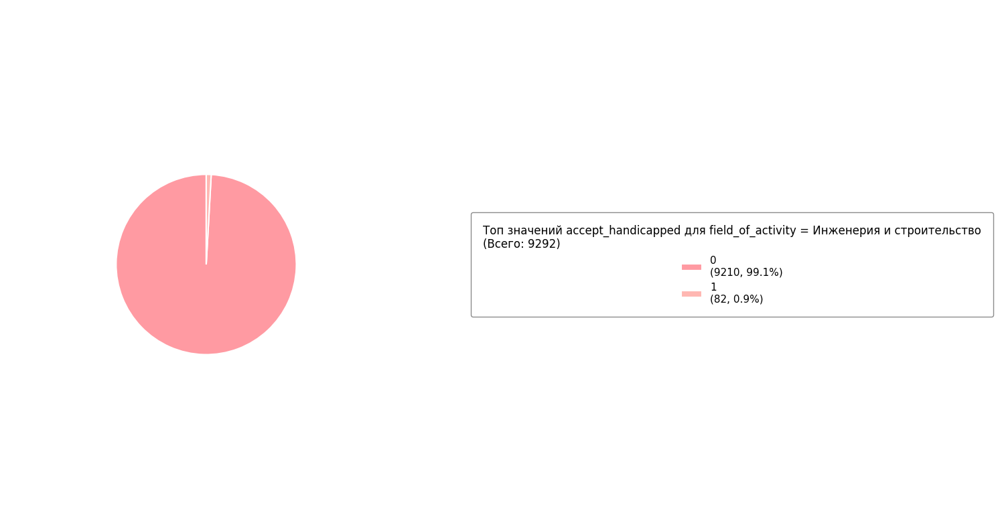

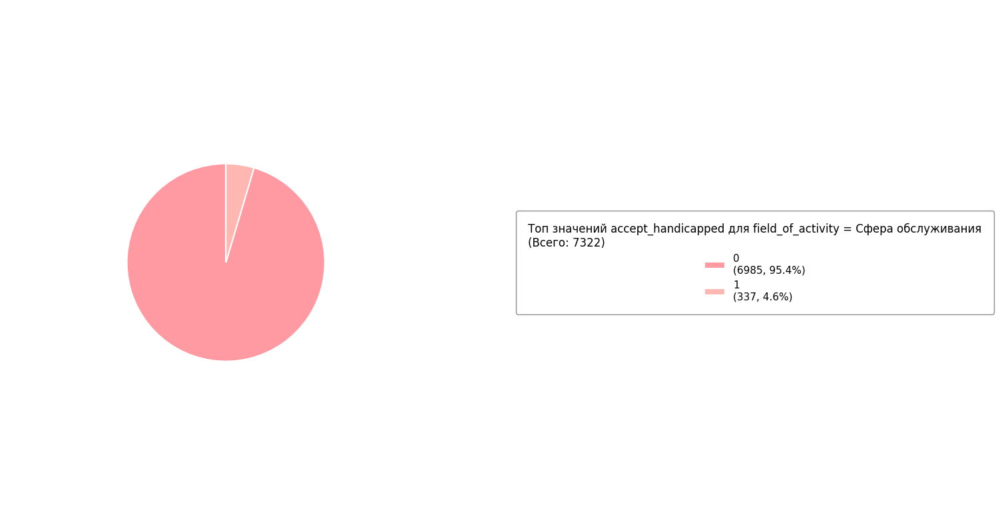

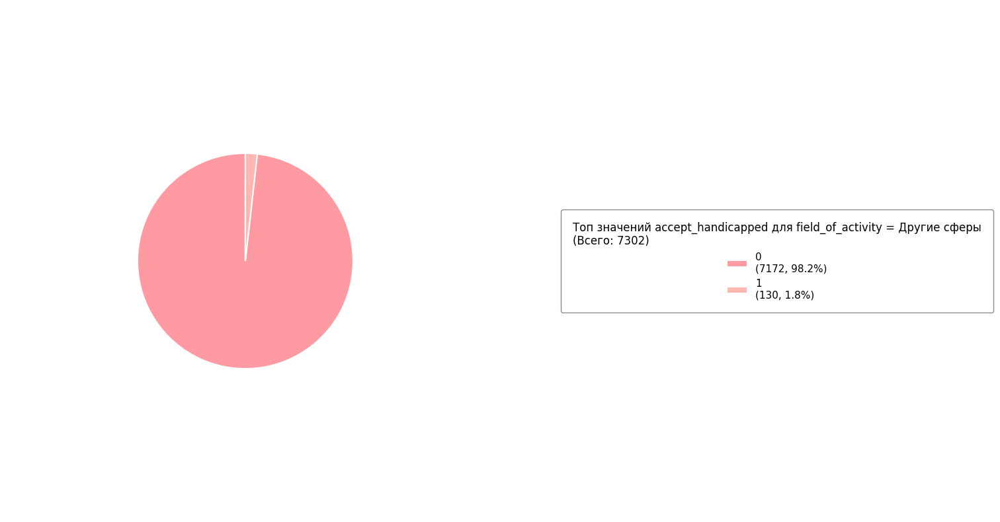

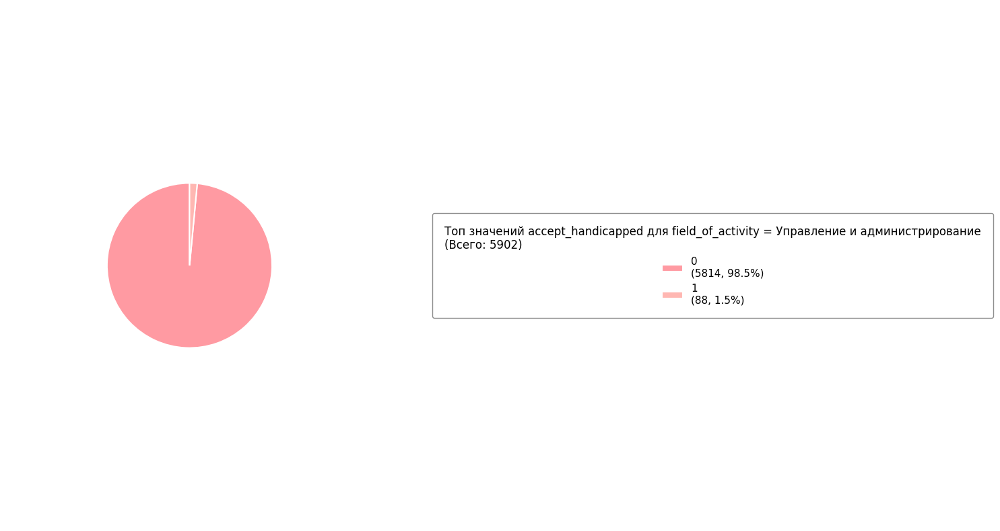

...

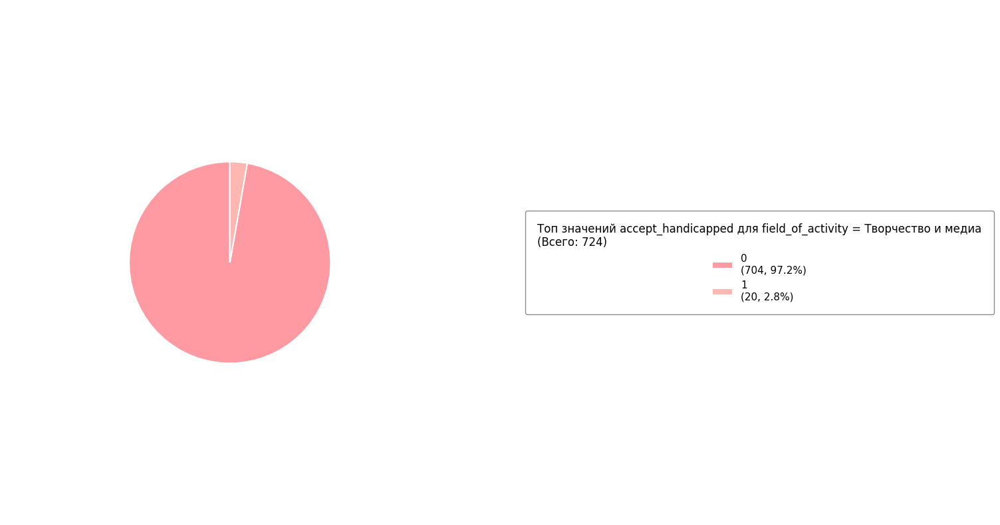

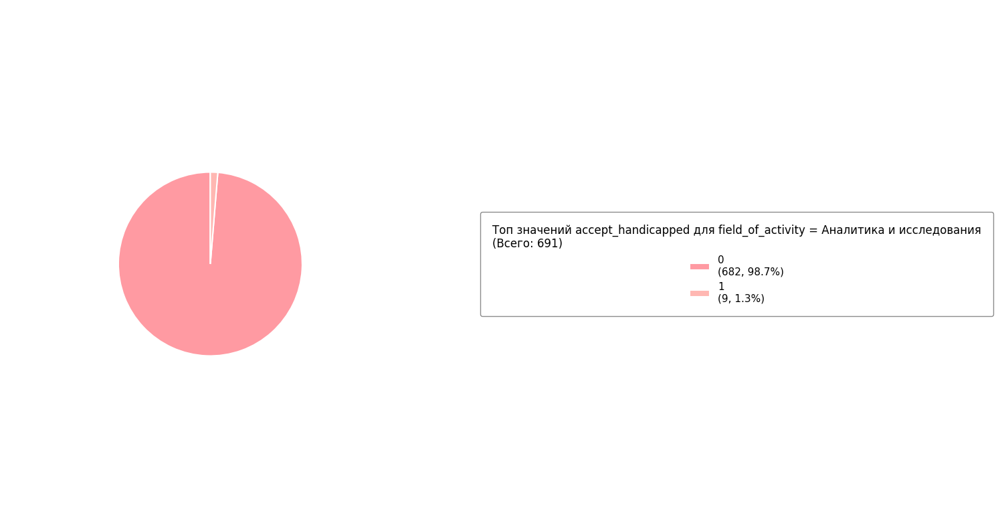

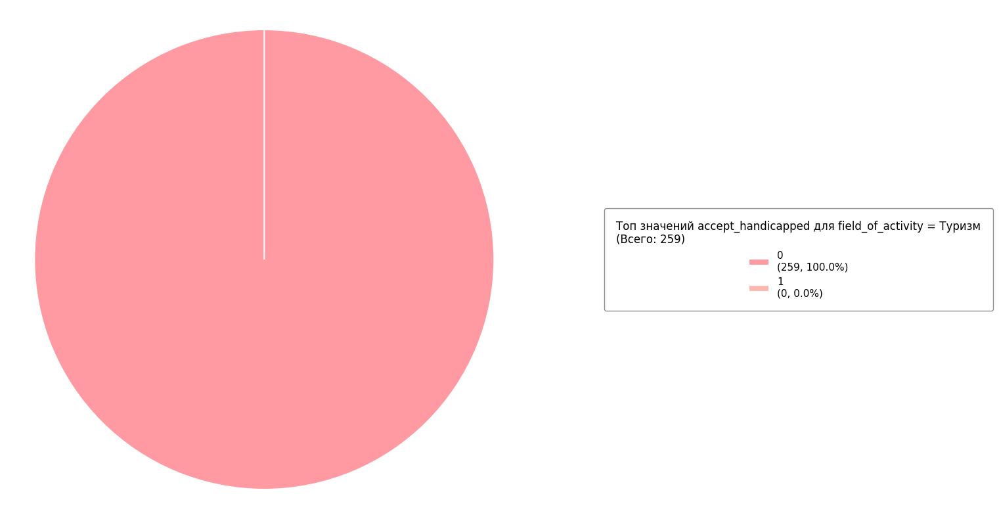

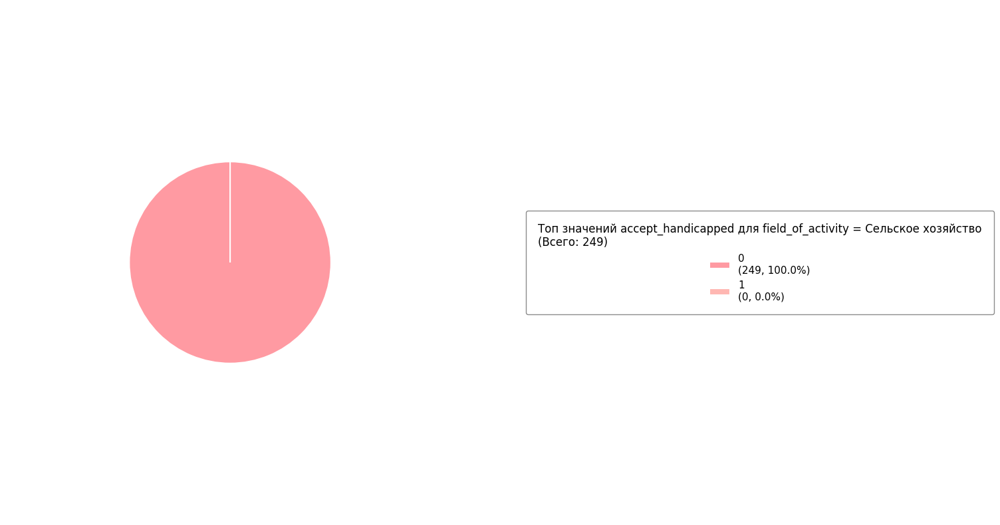

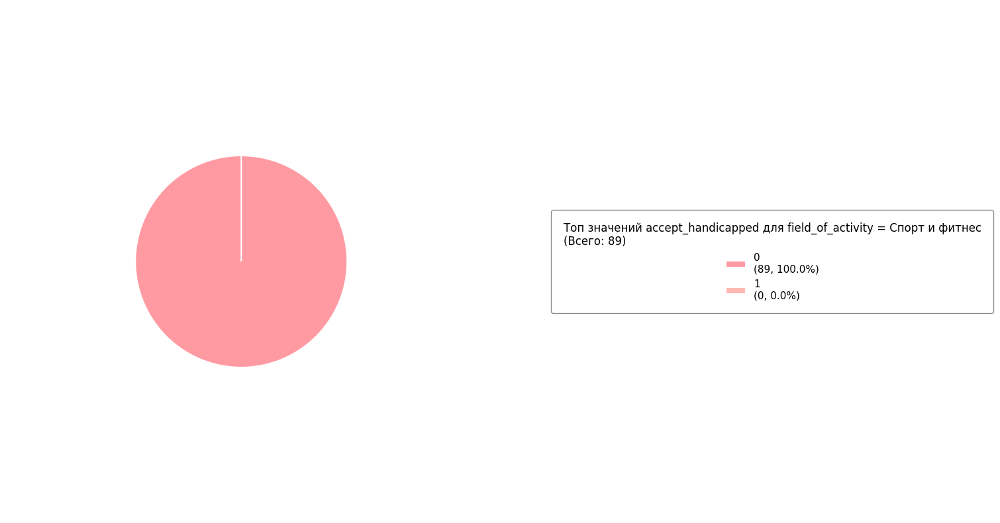

In [176]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [177]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

accept_handicapped,0,1
field_of_activity,,
IT и технологии,4780,208
Аналитика и исследования,682,9
Бытовые услуги,967,25
Другие сферы,7172,130
Инженерия и строительство,9210,82
Маркетинг и реклама,1556,57
Медицина и фармацевтика,3721,12
Образование и наука,2059,37
Производство и технические специальности,5331,16


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [178]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 825.382
p-value = 8.62433577892358e-163
Степени свободы = 19


Оценим уровень связи коэффициентом Крамера

In [179]:
stats.contingency.association(contingency_table, method='cramer')

0.10068931029544795

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.1) показывает, что сила связи слабая

### 14.18 Признаки city и field_of_activity

**Нулевая гипотеза (H₀): переменные независимы, между двумя категориальными переменными нет связи. Знание значения одной переменной не помогает предсказать значение другой переменной. Уровень значимости полагаем 0.05**

Сохраним именна переменных в кортеж columns

In [180]:
columns = ('city', 'field_of_activity')

Посмотрим на уникальные значения первого признака

In [181]:
dataset[columns[0]].unique()

<StringArray>
[                            'Томск',                          'Могочино',
                           'Каргала',    'Первомайское (Томская область)',
                           'Чажемто',                            'Самусь',
                         'Колпашево',                          'Рыбалово',
                            'Парбиг',                          'Копылово',
                            'Курлек',                          'Кедровый',
                        'Кривошеино',                          'Кисловка',
                            'Бакчар',                          'Богашёво',
         'Северск (Томская область)',         'Светлый (Томская область)',
                         'Стрежевой',                          'Белый Яр',
                         'Молчаново',                         'Подгорное',
                        'Мельниково',                             'Асино',
                          'Каргасок',                         'Тегульдет',
           

Выведем их количество

In [182]:
dataset[columns[0]].unique().shape

(42,)

Проведём неграфический структурный анализ. Сохраним результаты работы метода отсортировав значения.

In [183]:
value_counts = dataset[columns[0]].value_counts().sort_values(ascending=False)
value_counts

,count
city,
Томск,74319
Северск (Томская область),3081
Стрежевой,1001
Асино,396
Колпашево,337
Первомайское (Томская область),181
Зональная Станция,152
Светлый (Томская область),150
Парабель,136


Посмотрим на уникальные значения второго признака

In [184]:
dataset[columns[1]].unique()

['Инженерия и строительство', 'Транспорт и логистика', 'Торговля и продажи', 'Сфера обслуживания', 'Производство и технические специальности', ..., 'Образование и наука', 'Аналитика и исследования', 'Туризм', 'Сельское хозяйство', 'Спорт и фитнес']
Length: 20
Categories (20, object): ['IT и технологии', 'Аналитика и исследования', 'Бытовые услуги',
                          'Другие сферы', ..., 'Туризм', 'Управление и администрирование',
                          'Финансы и бухгалтерия', 'Юриспруденция и безопасность']

Выведем их количество

In [185]:
dataset[columns[1]].unique().shape

(20,)

Для каждого значения первого признака построим круговые диаграммы

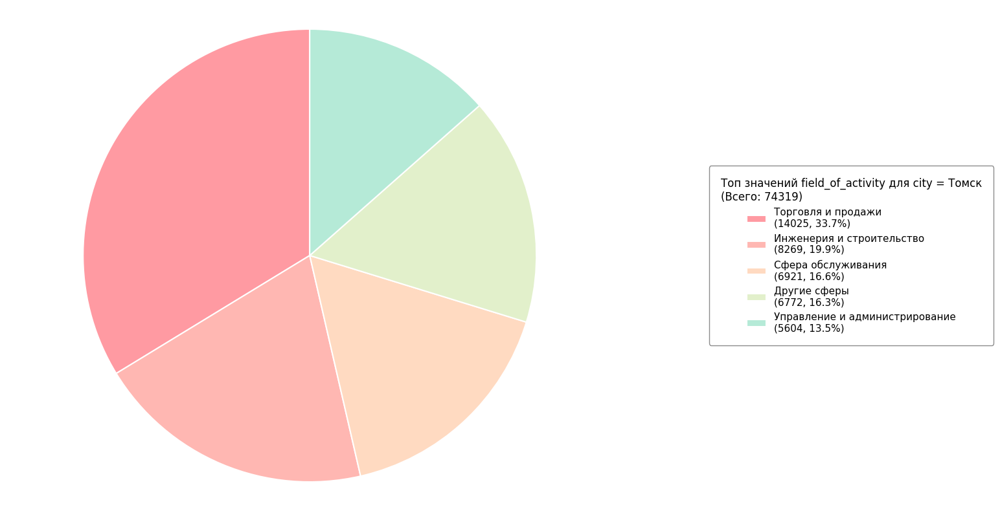

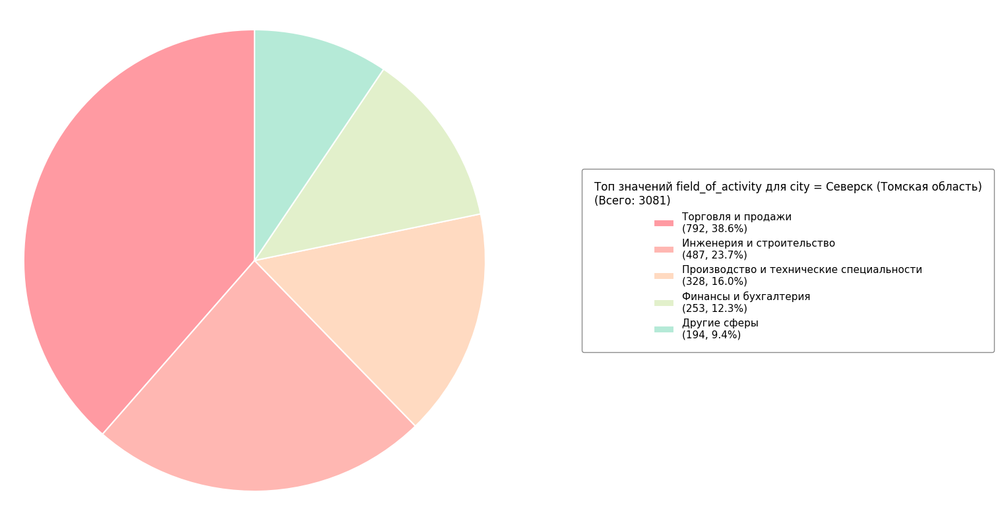

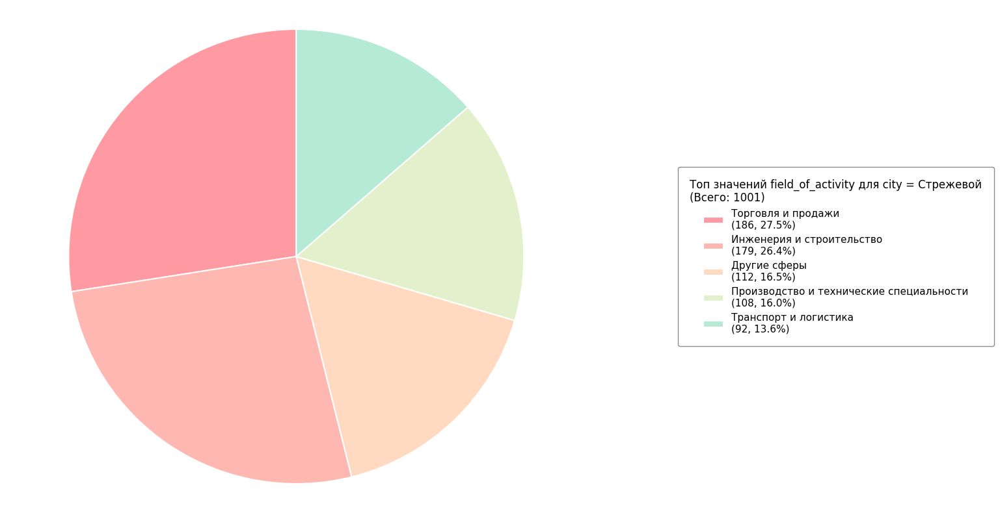

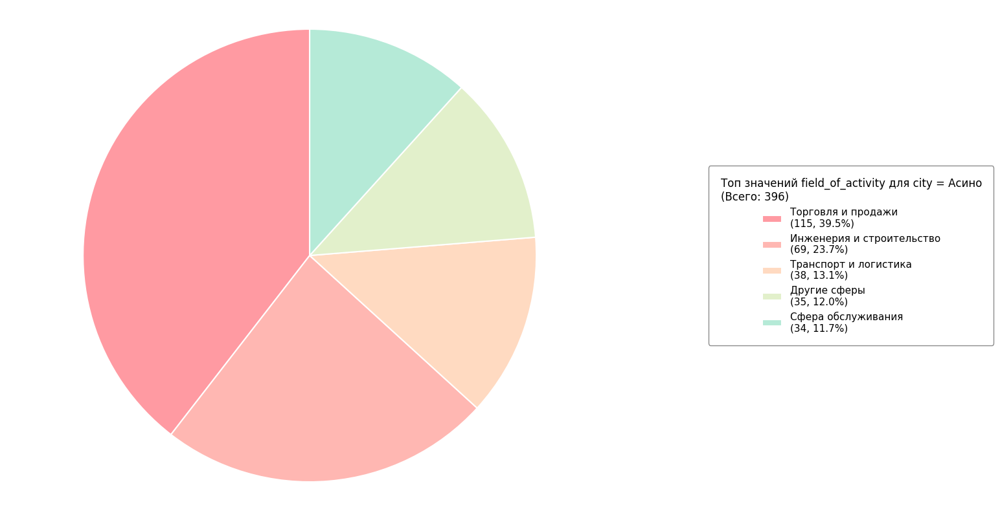

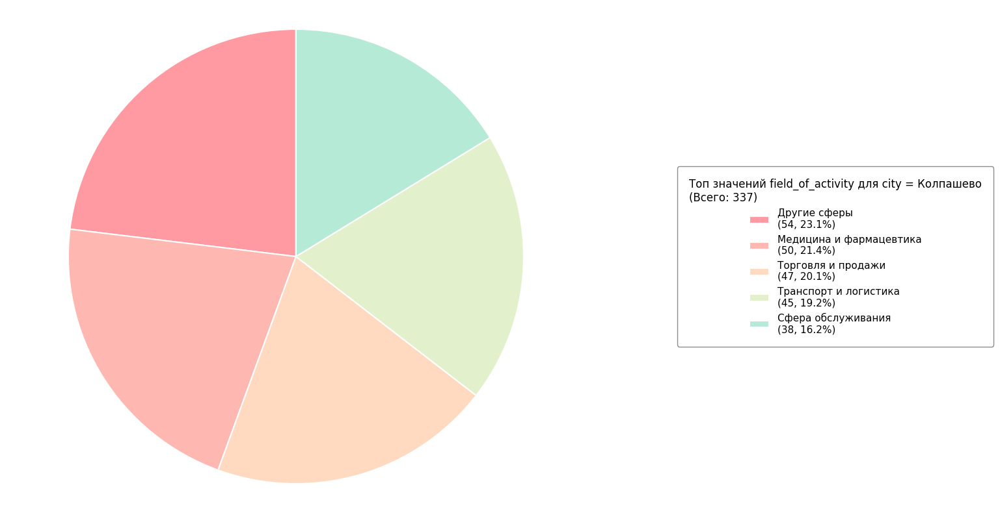

...

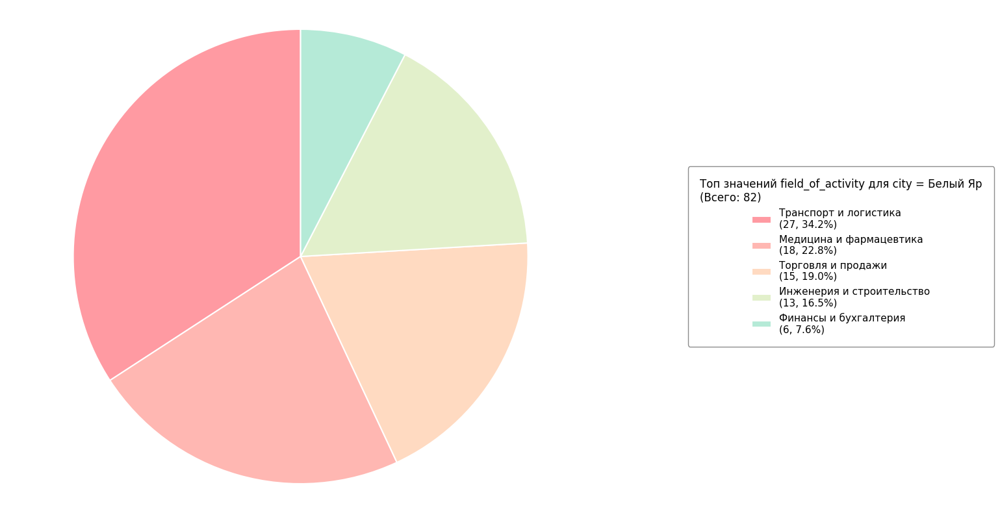

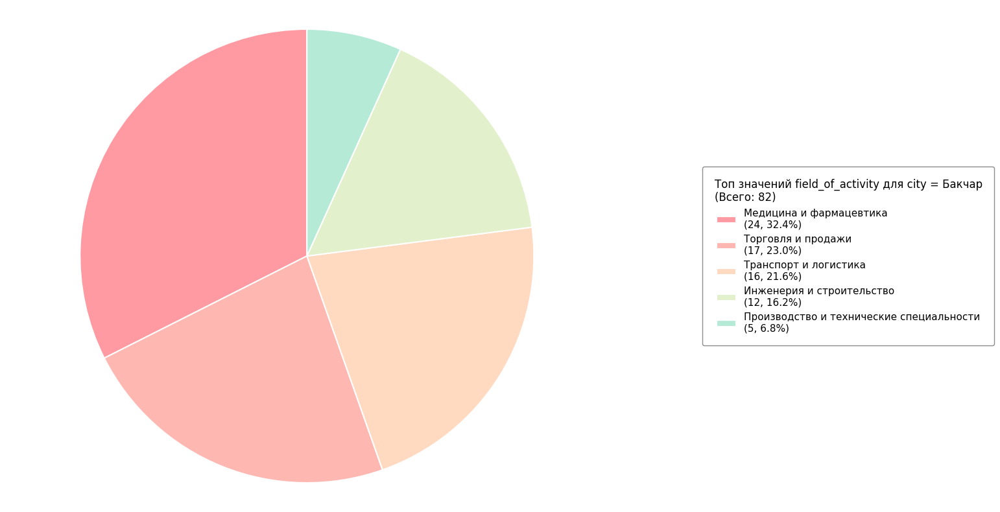

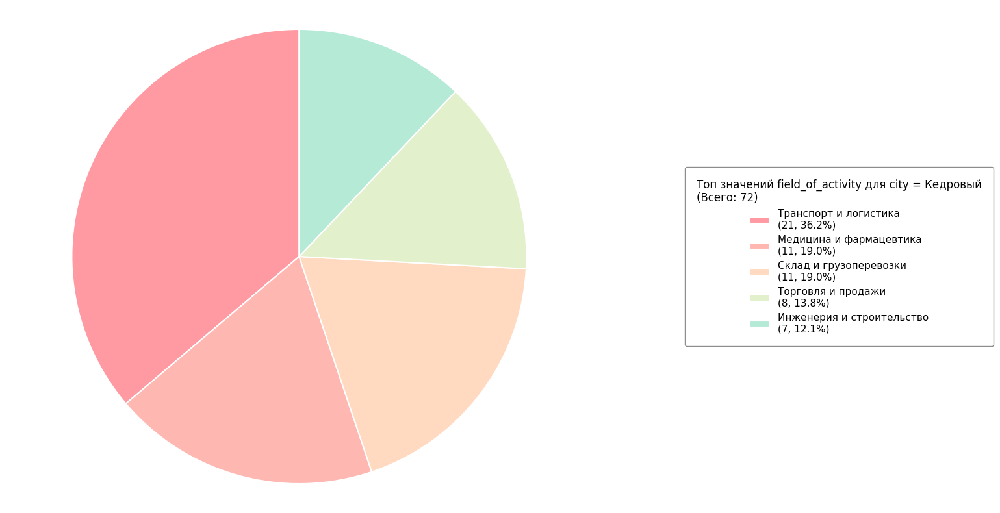

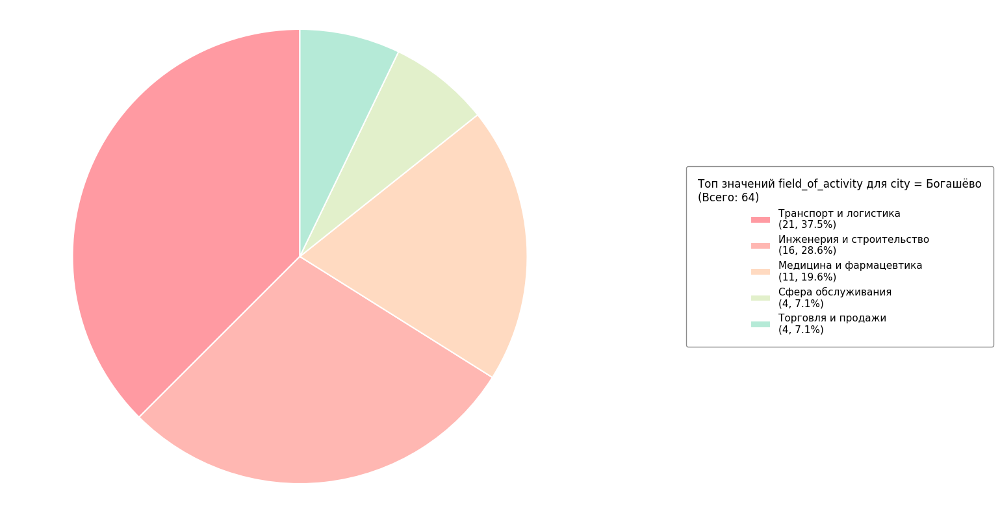

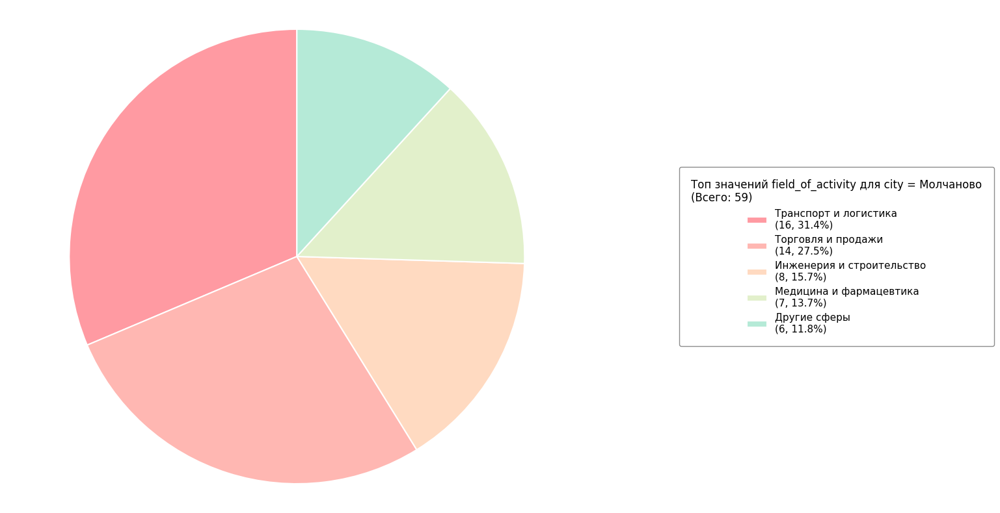

In [186]:
for observation, count in value_counts.nlargest(20).items():
    # Создаем фигуру с заданным размером
    plt.figure(figsize=(16, 8))

    # Фильтруем данные по текущему значению
    dataset_filtered = dataset[dataset[columns[0]] == observation]

    # Получаем топ значений второго столбца
    top_values = dataset_filtered[columns[1]].value_counts().nlargest(5)

    # Пропускаем если нет данных
    if top_values.empty:
        print(f"Нет данных для значения: {observation}")
        plt.close()
        continue

    # Создаем цветовую схему
    observation_color_subset = {val: colors[i] for i, val in enumerate(top_values.index)}

    # Рассчитываем проценты
    total = top_values.sum()
    percentages = [f'{(v/total)*100:.1f}%' for v in top_values.values]

    # Создаем круговую диаграмму
    wedges, texts, autotexts = plt.pie(
        top_values,
        labels=None,
        autopct='',
        startangle=90,
        colors=[observation_color_subset[val] for val in top_values.index],
        wedgeprops=wedgeprops,
        textprops=textprops
    )

    # Формируем подписи для легенды
    legend_labels = [f'{label}\n({count}, {percent})'
                   for label, count, percent in zip(top_values.index, top_values.values, percentages)]

    # Добавляем легенду
    legend = plt.legend(
        wedges,
        legend_labels,
        title=f"Топ значений {columns[1]} для {columns[0]} = {observation}\n(Всего: {count})",
        loc="center left",
        bbox_to_anchor=(1.15, 0.5),
        fontsize=11,
        title_fontsize=12,
        framealpha=0.9,
        edgecolor='gray',
        borderpad=1.2
    )

    # Делаем диаграмму круглой и настраиваем расположение
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

Посмотрим таблицу сопряжённости

In [187]:
contingency_table = pd.crosstab(dataset[columns[0]], dataset[columns[1]])
contingency_table

field_of_activity,IT и технологии,Аналитика и исследования,Бытовые услуги,Другие сферы,Инженерия и строительство,Маркетинг и реклама,Медицина и фармацевтика,Образование и наука,Производство и технические специальности,Сельское хозяйство,Склад и грузоперевозки,Спорт и фитнес,Сфера обслуживания,Творчество и медиа,Торговля и продажи,Транспорт и логистика,Туризм,Управление и администрирование,Финансы и бухгалтерия,Юриспруденция и безопасность
city,,,,,,,,,,,,,,,,,,,,
Александровское (Томская область),0,0,0,15,20,0,27,0,0,0,5,0,24,4,4,26,0,3,0,2
Асино,3,0,0,35,69,3,17,0,26,0,14,0,34,4,115,38,0,19,9,10
Бакчар,0,0,0,0,12,0,24,0,5,0,0,0,3,0,17,16,0,0,0,5
Батурино,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,8,0,0,0,0
Белый Яр,0,0,0,0,13,0,18,0,3,0,0,0,0,0,15,27,0,0,6,0
Богашёво,0,0,0,0,16,0,11,0,3,0,0,0,4,4,4,21,0,0,0,1
Зональная Станция,0,0,0,20,16,0,12,4,0,0,8,0,7,0,43,21,0,4,0,17
Зоркальцево,0,0,0,3,9,0,11,1,0,0,0,0,0,4,1,18,0,0,0,1
Зырянское,2,0,0,7,5,3,3,0,0,12,0,0,3,0,32,13,0,35,3,0


Для выявления статистически значимых взаимосвязей между небинарными категориальными переменными был применён критерий хи-квадрат Пирсона (χ²), как наиболее подходящий метод анализа сопряжённости номинальных данных.

In [188]:
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"χ² статистика = {chi2:.3f}")
print(f"p-value = {p_value}")
print(f"Степени свободы = {dof}")

χ² статистика = 6858.750
p-value = 0.0
Степени свободы = 779


Оценим уровень связи коэффициентом Крамера

In [189]:
stats.contingency.association(contingency_table, method='cramer')

0.06658884249271861

* О возможной взаимосвязи признаков:

    - Статистическая значимость:
    
      - Критерий χ² подтвердил наличие связи (p-value ≈ 0). Нулевая гипотеза отвергается

    - Сила связи:
      
      - Коэффициент Крамера (0.06658884) показывает, что связь незначительна